# Hypertuning
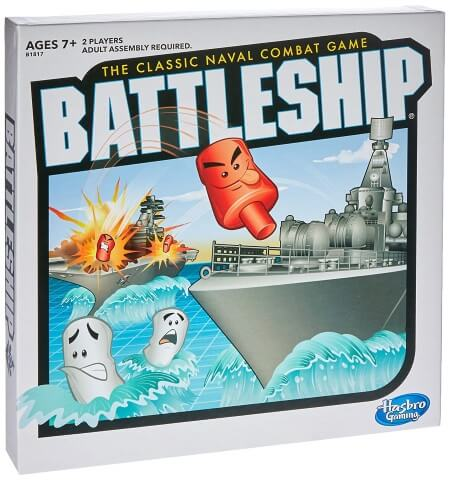

# Setup

In [1]:
#!conda install kaggle --yes

In [2]:
#!conda install hyperopt --yes

In [3]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import xgboost as xgb

from hyperopt import hp
from hyperopt import tpe
from hyperopt import Trials
from hyperopt import fmin
from hyperopt.pyll.stochastic import sample
from hyperopt import STATUS_OK
from hyperopt import STATUS_FAIL
from hyperopt import plotting

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import log_loss

from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import VotingClassifier

# Data
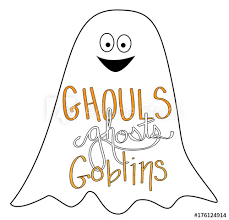

In [4]:
!kaggle competitions download -c ghouls-goblins-and-ghosts-boo -p ./ghost

ghouls-goblins-and-ghosts-boo.zip: Skipping, found more recently modified local copy (use --force to force download)


In [5]:
!(cd ghost; unzip -o ghouls-goblins-and-ghosts-boo.zip)
!(cd ghost; unzip -o train.csv.zip)

Archive:  ghouls-goblins-and-ghosts-boo.zip
  inflating: sample_submission.csv.zip  
  inflating: test.csv.zip            
  inflating: train.csv.zip           
Archive:  train.csv.zip
  inflating: train.csv               


In [6]:
!ls ghost

ghouls-goblins-and-ghosts-boo.zip train.csv
sample_submission.csv.zip         train.csv.zip
test.csv.zip


In [7]:
df = pd.read_csv('ghost/train.csv')

In [8]:
df.head()

,id,bone_length,rotting_flesh,hair_length,has_soul,color,type
0,0,0.354512,0.350839,0.465761,0.781142,clear,Ghoul
1,1,0.575560,0.425868,0.531401,0.439899,green,Goblin
2,2,0.467875,0.354330,0.811616,0.791225,black,Ghoul
3,4,0.776652,0.508723,0.636766,0.884464,black,Ghoul
4,5,0.566117,0.875862,0.418594,0.636438,green,Ghost


# Features & Target

## Column Types

In [9]:
df.dtypes

id                 int64
bone_length      float64
rotting_flesh    float64
hair_length      float64
has_soul         float64
color             object
type              object
dtype: object

In [10]:
y = df['type']
X = df.drop(columns=['type', 'id'])

In [11]:
X.shape, y.shape

((371, 5), (371,))

# EDA

## Missing

In [12]:
X.isna().sum()

bone_length      0
rotting_flesh    0
hair_length      0
has_soul         0
color            0
dtype: int64

## Class Balance

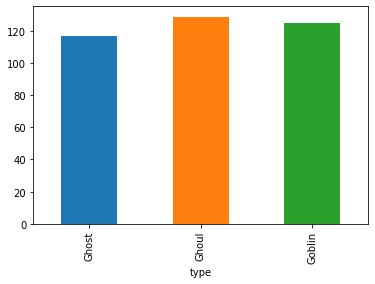

In [13]:
df.groupby('type').size().plot.bar()

## Pair Plot
* There is some grouping, but not really separable
* Possible that we could project this data to a different space could help
* Interactions may be useful

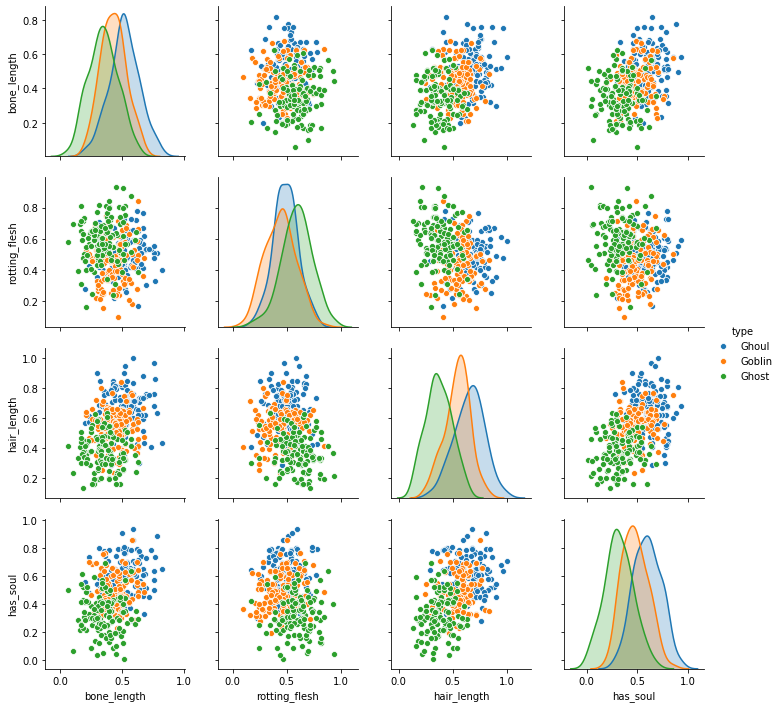

In [14]:
sns.pairplot(df[['bone_length', 'rotting_flesh', 'hair_length', 'has_soul', 'type']], hue='type')

## Color
* Not a lot of separation here
* Perhaps, clear is a little less likely to be a ghost
* And if you have blood color not as likely to be a goblin

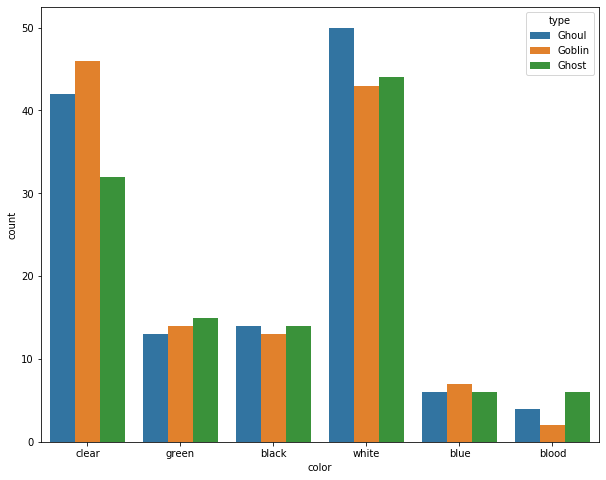

In [15]:
plt.figure(figsize=(10,8))
sns.countplot(x='color', hue='type', data=df)

# Metrics

In [16]:
def errors(y, yhat):
    accuracy = accuracy_score(yhat, y)
    print('Accuracy', accuracy)
    print('Confusion Matrix')
    print(confusion_matrix(yhat, y))
    print('Classification Report')
    print(classification_report(yhat, y))
    return accuracy

In [17]:
resultsDF = pd.DataFrame(columns=['Time', 'Accuracy'])

# Pipeline

In [18]:
featuresN = ['bone_length', 
             'rotting_flesh',
             'hair_length',
             'has_soul']
transformerN = Pipeline(steps=[('scaler', StandardScaler())], verbose=True)

featuresC = ['color']
transformerC = Pipeline(steps=[('ohe', OneHotEncoder())], verbose=True)

preprocessor = ColumnTransformer(transformers=[
    ('numerical', transformerN, featuresN),
    ('categorical', transformerC, featuresC)
])

In [19]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=46)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=46)

In [20]:
pipe = Pipeline(steps=[('pre', preprocessor)])
X_train_proc = pipe.fit_transform(X_train, y_train)
X_val_proc   = pipe.fit_transform(X_val, y_val)
X_test_proc  = pipe.fit_transform(X_test, y_test)

[Pipeline] ............ (step 1 of 1) Processing scaler, total=   0.0s
[Pipeline] ............... (step 1 of 1) Processing ohe, total=   0.0s
[Pipeline] ............ (step 1 of 1) Processing scaler, total=   0.0s
[Pipeline] ............... (step 1 of 1) Processing ohe, total=   0.0s
[Pipeline] ............ (step 1 of 1) Processing scaler, total=   0.0s
[Pipeline] ............... (step 1 of 1) Processing ohe, total=   0.0s


# Baseline Model
* Split Train - Validation - Test

In [21]:
bst = xgb.XGBClassifier(n_estimators=10000,
                       max_depth=4,
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=1)

## Fit

In [22]:
startDefault = datetime.datetime.now()
eval_set = [(X_val_proc, y_val)]
bst.fit(X_train_proc, y_train,
        early_stopping_rounds=5,
        eval_metric=[ 'merror', 'mlogloss'],
        eval_set=eval_set,
        verbose=True)
endDefault = datetime.datetime.now()

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.04431
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00265
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.969908
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.943569
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.920085
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.899691
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.880294
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.861652
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.850396
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.841422
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.829942
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.823159
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.812241
[13]	validati

In [23]:
defaultTime = (endDefault - startDefault).seconds
print(f'Default took {defaultTime} seconds')

Default took 0 seconds


## Predict

In [24]:
proba = bst.predict_proba(X_test_proc, bst.best_iteration)
pred  = np.argmax(proba, axis=1)
truth = y_test.astype('category').cat.codes
acc   = errors(truth, pred);

Accuracy 0.6666666666666666
Confusion Matrix
[[19  0  3]
 [ 5 17  8]
 [ 3  6 14]]
Classification Report
              precision    recall  f1-score   support

           0       0.70      0.86      0.78        22
           1       0.74      0.57      0.64        30
           2       0.56      0.61      0.58        23

    accuracy                           0.67        75
   macro avg       0.67      0.68      0.67        75
weighted avg       0.67      0.67      0.66        75



## Log Results

In [25]:
resultsDF.loc['Default'] = [defaultTime, acc]
resultsDF

,Time,Accuracy
Default,0.0,0.666667


# Leaderboard
* Most scores around .758 to .752
* Test-Train-Val split lags the leaderboard .666
* Not surprising ... We didn't:
    * Attempt feature engineering
    * Hypertune XGBoost (Used some simple settings)

In [26]:
!kaggle competitions leaderboard -c ghouls-goblins-and-ghosts-boo --show

teamId  teamName                            submissionDate       score    
------  ----------------------------------  -------------------  -------  
411720  Victor Kasatkin overfits PLB        2016-12-01 07:51:50  1.00000  
397199  anokas and his overfitting bazooka  2016-11-24 09:59:07  0.80718  
402601  HangYu                              2016-12-01 04:30:22  0.77504  
413031  Daqi's overfitting Bazinga          2016-11-29 18:44:57  0.77315  
414968  the 10 minute overfit               2016-12-01 08:25:34  0.76937  
405019  DDerek                              2016-12-01 11:57:29  0.76748  
411108  Jeans                               2016-12-01 17:33:56  0.76748  
414353  exCite                              2016-12-01 02:00:36  0.76559  
419851  victor                              2016-12-01 19:00:15  0.76370  
419903  Ghost                               2016-12-01 19:18:10  0.76370  
400304  Prakhar Agarwal                     2016-12-01 19:22:25  0.76370  
398369  Gilles Vandewiele

# XGBoost Parameters
* Controlling model complexity
    * max_depth : Max allowable depth of nodes (splits)
    * min_child_weight : Minimum child weight to create a leaf node
    * gamma : Minium loss reduction required to make a further split on a node
* Adding randomness to make training robust to noise
    * subsample : sample % of training data for an iteration
    * colsample_bytree : sample % of columns available for an iteration

In [27]:
param_grid = {'max_depth': [2,4,6,8],
              'min_child_weight': [1,2,3,4,5],
              'gamma': [0.0, 0.1, 0.2, 0.3],
              'subsample':[0.6, 0.8, 1.0],
              'colsample_bytree':[0.6, 0.8, 1.0]}

# Grid Search
* Grid search is exhaustive, trying all combinations
* Expensive in terms of compute and time
* In our example we'll search over 5 common parameters with early stop
* That's 4 * 5 * 4 * 3 * 3 models = 720 searches
* Each model is being cross fold validated as well 720 * 3 = 2,160
* Over 2 minutes to train
* In Battleship terms - it's the equivalent of putting a peg in each hole

## Search

In [28]:
startGrid = datetime.datetime.now()
fit_params = {'early_stopping_rounds':5,
             'eval_metric': [ 'merror', 'mlogloss'],
             'eval_set': [(X_val_proc, y_val)]}

kfold = StratifiedKFold(n_splits=3, random_state=8)
              
model = xgb.XGBClassifier(n_estimators=10000,
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=0)
              
gridsearch = GridSearchCV(model, param_grid, 
                          verbose=0,
                          cv=kfold)
              
gridsearch.fit(X_train_proc, y_train, **fit_params)
endGrid = datetime.datetime.now()

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05726
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02672
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00005
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.970093
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.962484
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.941913
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.924615
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.909442
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.888094
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.872431
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.859473
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.845054
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.832724
[13]	validation_0-merror:0.3	validati

[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.802036
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.785859
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.780717
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.772189
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.768709
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.756744
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.750355
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.745919
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.738502
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.7321
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.724758
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.723126
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.7175
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.713498
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.708177
[28]	validation_0-merror:0.3	validation

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.754631
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.754877
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.750858
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.748636
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.746096
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.746702
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.743528
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.738334
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.738402
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.736847
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.736056
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.736316
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.734388
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.733676
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.733773
[41]	validation_0-merror:

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.713679
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.711996
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.706465
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.704045
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.699302
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.698404
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.694986
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.693946
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.692347
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.685758
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.680665
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.682319
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.679835
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.678433
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.676146
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.673986
[43]	validation_0-me

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.685331
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.6824
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.679623
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.677447
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.674029
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.671614
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.669057
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.668769
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.665902
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.663023
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.659635
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.659021
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.657203
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.654936
[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.655711
[54]	validation_0-merror:0.

[26]	validation_0-merror:0.35	validation_0-mlogloss:0.755593
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.753148
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.750705
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.749362
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.748864
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.746803
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.745038
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.742102
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.746017
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.745663
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.7401
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.740541
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.738318
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.736863
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.734957
[41]	validation_0-merror:0.333333	validation_0-mlogloss

[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.0359
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00639
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.97892
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.952764
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.92984
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.913195
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.899084
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.879015
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.863813
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.853256
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.844964
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.835668
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.826895
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.817125
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.808029
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0

[2]	validation_0-merror:0.35	validation_0-mlogloss:0.992351
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.969668
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.941287
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.916239
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.901263
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.890077
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.876154
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.862492
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.84947
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.835863
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.820957
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.808208
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.798967
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.787353
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.777866
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.768

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.807056
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.798457
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.789723
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.779982
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.773175
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.767748
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.760351
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.752685
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.74571
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.740351
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.73394
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.730755
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.725227
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.721245
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.716768
[31]	validation_0-merror:0.316667	validation

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.792344
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.789514
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.781325
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.777404
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.774023
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.772337
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.768385
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.76681
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.763875
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.761818
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.755485
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.752226
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.750786
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.752627
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.74922
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.747074
[33]	validatio

[36]	validation_0-merror:0.25	validation_0-mlogloss:0.677847
[37]	validation_0-merror:0.25	validation_0-mlogloss:0.679097
[38]	validation_0-merror:0.25	validation_0-mlogloss:0.680314
[39]	validation_0-merror:0.25	validation_0-mlogloss:0.674044
[40]	validation_0-merror:0.25	validation_0-mlogloss:0.67306
[41]	validation_0-merror:0.25	validation_0-mlogloss:0.67194
[42]	validation_0-merror:0.25	validation_0-mlogloss:0.670248
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.668925
[44]	validation_0-merror:0.233333	validation_0-mlogloss:0.666361
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.665198
[46]	validation_0-merror:0.25	validation_0-mlogloss:0.662745
[47]	validation_0-merror:0.25	validation_0-mlogloss:0.65906
[48]	validation_0-merror:0.25	validation_0-mlogloss:0.654552
[49]	validation_0-merror:0.25	validation_0-mlogloss:0.656336
[50]	validation_0-merror:0.25	validation_0-mlogloss:0.655755
[51]	validation_0-merror:0.25	validation_0-mlogloss:0.656543
[52]	validation

[51]	validation_0-merror:0.3	validation_0-mlogloss:0.677277
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.676095
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.677058
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.676279
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.674584
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.672602
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.66874
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.667736
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.667032
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.668415
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.666382
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.668724
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.670424
[64]	validation_0-merror:0.3	validation_0-mlogloss:0.673682
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.6711
[66]	validation_0-merror:0.3	validation_0-mlogloss:0.671397
Stopping. Best iteration:
[61]	validation_0

[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.9107
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.89442
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.874744
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.858407
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.843294
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.830995
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.821092
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.81669
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.803817
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.796114
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.789008
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.778863
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.770779
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.765981
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.758443
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.7

[2]	validation_0-merror:0.366667	validation_0-mlogloss:1.00519
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.984303
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.955764
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.935623
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.913851
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.897672
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.878141
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.863235
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.847267
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.834842
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.827679
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.818549
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.812877
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.803838
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.79823
[17]	validation_0-merror:0.366667	valida

[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.684487
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.681096
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.679082
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.679298
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.681091
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.674972
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.673956
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.672875
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.672444
[43]	validation_0-merror:0.25	validation_0-mlogloss:0.669726
[44]	validation_0-merror:0.25	validation_0-mlogloss:0.666945
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.663048
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.660406
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.657154
[48]	validation_0-merror:0.25	validation_0-mlogloss:0.653498
[49]	validation_0-merror:0.25	validat

[54]	validation_0-merror:0.3	validation_0-mlogloss:0.680195
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.678452
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.67479
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.673222
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.672696
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.672165
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.669004
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.671679
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.672313
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.67278
[64]	validation_0-merror:0.3	validation_0-mlogloss:0.674728
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.670444
Stopping. Best iteration:
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.669004

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.0601
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss 

Stopping. Best iteration:
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.740039

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.07227
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.04312
[2]	validation_0-merror:0.416667	validation_0-mlogloss:1.01763
[3]	validation_0-merror:0.416667	validation_0-mlogloss:1.00282
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.986041
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.960856
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.946502
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.934973
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.917415
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.901096
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.881324
[11]	validation_0-merror:0.35	validation_0-mlogloss:0

[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.76605
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.762119
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.761068
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.758783
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.755954
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.752698
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.749521
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.747164
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.746626
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.743082
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.741588
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.740792
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.743993
[35]	validation_0-merror:0.383333	validation_0-mlogloss:0.742178
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.740328
[37]	validation_0-merror:0.366667	validati

[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.701757
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.701015
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.698706
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.695376
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.690558
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.686502
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.684423
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.680666
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.678144
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.677816
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.679454
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.673671
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.673396
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.672404
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.672545
[43]	validation_0-merror:0.3	validation_0-mlogloss

[51]	validation_0-merror:0.333333	validation_0-mlogloss:0.700556
[52]	validation_0-merror:0.333333	validation_0-mlogloss:0.698155
[53]	validation_0-merror:0.333333	validation_0-mlogloss:0.699056
[54]	validation_0-merror:0.333333	validation_0-mlogloss:0.701031
[55]	validation_0-merror:0.333333	validation_0-mlogloss:0.699468
[56]	validation_0-merror:0.333333	validation_0-mlogloss:0.694697
[57]	validation_0-merror:0.333333	validation_0-mlogloss:0.691608
[58]	validation_0-merror:0.333333	validation_0-mlogloss:0.691458
[59]	validation_0-merror:0.333333	validation_0-mlogloss:0.691159
[60]	validation_0-merror:0.316667	validation_0-mlogloss:0.690229
[61]	validation_0-merror:0.316667	validation_0-mlogloss:0.692014
[62]	validation_0-merror:0.316667	validation_0-mlogloss:0.694844
[63]	validation_0-merror:0.316667	validation_0-mlogloss:0.695658
[64]	validation_0-merror:0.316667	validation_0-mlogloss:0.695988
[65]	validation_0-merror:0.316667	validation_0-mlogloss:0.693139
Stopping. Best iteration:

[40]	validation_0-merror:0.35	validation_0-mlogloss:0.740744
Stopping. Best iteration:
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.739291

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.07227
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.04312
[2]	validation_0-merror:0.416667	validation_0-mlogloss:1.01763
[3]	validation_0-merror:0.416667	validation_0-mlogloss:1.00282
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.984833
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.959738
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.945415
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.934464
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.917267
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.899559
[10]	validation_0-merror:0.35	validation_0-mlogloss:0

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.87614
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.858531
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.844742
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.828983
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.818126
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.813794
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.805475
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.799016
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.787264
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.785607
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.780802
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.779438
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.772345
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.772657
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.766427
[22]	validation_0-merror:0.333333	validation_0-mloglos

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.862576
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.851491
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.840822
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.830954
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.825231
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.814249
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.806979
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.797059
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.797511
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.791564
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.786685
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.783591
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.778812
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.776352
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.772051
[23]	validation_0-merror:0.333333	v

[2]	validation_0-merror:0.383333	validation_0-mlogloss:1.0046
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.984098
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.951283
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.926874
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.913177
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.903985
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.890581
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.876928
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.864444
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.849406
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.833465
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.821284
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.816137
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.808719
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.803229
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.79

Stopping. Best iteration:
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.660501

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05955
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.03606
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.999395
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.972484
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.937022
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.915644
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.893936
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.877036
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.858174
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.840642
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.826081
[11]	validation_0-merror:0.333333	validation_0-ml

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.676641
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.675144
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.67747
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.677823
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.682317
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.678813
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.675443
Stopping. Best iteration:
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.675144

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06373
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02944
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.998548
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.964142
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.937087
[5]

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.705994
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.699626
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.697679
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.693992
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.693051
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.688886
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.685207
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.68144
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.67769
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.67207
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.66952
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.669478
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.670965
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.670951
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.672092
[39]	validation_0-merror:0.283333	validation_0-ml

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.781616
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.76996
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.761358
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.755646
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.747103
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.738844
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.737022
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.72851
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.721506
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.715802
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.711325
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.706001
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.70155
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.699827
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.696659
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.695493
[3

[47]	validation_0-merror:0.3	validation_0-mlogloss:0.68714
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.689889
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.69005
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.690144
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.690772
Stopping. Best iteration:
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.68658

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05263
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.283333	validation_0-mlogloss:1.01377
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.985289
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.95639
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.948466
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.917378
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.89

[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.728757
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.724711
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.71837
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.719273
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.718442
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.713635
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.71758
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.714836
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.715297
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.715085
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.71524
Stopping. Best iteration:
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.713635

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05466
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss 

[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.688668
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.69157
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.695243
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.69225
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.693304
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.691165
Stopping. Best iteration:
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.688668

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06128
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02989
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.998893
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.972205
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.963254
[5]	validation_0-merror:0.35	validation_0-mlogloss

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.868436
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.84722
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.835843
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.823276
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.809231
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.797412
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.796145
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.790603
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.784098
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.77154
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.767021
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.759417
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.750617
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.7476
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.737246
[24]	validation_0-merror:0.316

[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.76939
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.765393
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.762796
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.765045
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.76237
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.762071
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.767279
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.767133
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.766673
[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.766034
[35]	validation_0-merror:0.383333	validation_0-mlogloss:0.766895
Stopping. Best iteration:
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.762071

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06716
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss

[15]	validation_0-merror:0.416667	validation_0-mlogloss:0.821948
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.81292
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.807432
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.803931
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.800964
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.799685
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.797368
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.79313
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.787838
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.786059
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.782674
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.78301
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.782644
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.782534
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.781706
[30]	validation_0-merror:0.38333

[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.911095
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.894554
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.877953
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.862431
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.845043
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.833365
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.826923
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.817986
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.811658
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.80397
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.798754
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.788959
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.783437
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.775331
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.772498
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.767896


[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.808042
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.797465
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.789159
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.784503
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.77453
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.763234
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.758702
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.753415
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.744775
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.740881
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.729606
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.721789
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.712731
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.710168
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.704337
[27]	validation_0-merror:0.3	validation_0-mlog

[44]	validation_0-merror:0.3	validation_0-mlogloss:0.719615
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.716693
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.711875
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.711324
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.71098
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.714851
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.709647
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.711173
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.709291
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.708602
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.712462
[55]	validation_0-merror:0.316667	validation_0-mlogloss:0.711687
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.709523
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.707712
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.707865
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.708799
[60]	validation_0-merror:0.3	validat

[22]	validation_0-merror:0.3	validation_0-mlogloss:0.723689
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.715896
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.71186
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.70671
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.704139
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.699624
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.695619
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.694718
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.695336
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.697749
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.695738
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.694437
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.693188
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.691495
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.688824
[37]	validation_0-merror:0.283333	validation_0-

[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.758657
Stopping. Best iteration:
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.748105

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06376
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.03642
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.994184
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.971208
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.938499
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.916134
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.903411
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.891693
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.876567
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.862865
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.919449
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.897711
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.885645
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.870794
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.857611
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.844366
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.835975
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.819193
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.8158
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.814244
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.809344
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.800271
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.7956
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.796868
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.792441
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.7

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.784727
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.778498
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.775763
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.769851
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.765824
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.768501
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.763358
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.75958
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.754954
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.75314
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.752051
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.748638
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.742822
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.744489
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.745412
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.75026
[32]	validation_0-m

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.843426
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.830205
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.813776
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.798054
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.796448
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.787149
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.783148
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.773089
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.763035
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.760547
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.757058
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.755086
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.745684
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.743093
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.739335
[26]	validation_0-merror:0.333333	validation_0-ml

[21]	validation_0-merror:0.35	validation_0-mlogloss:0.780935
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.776388
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.768535
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.76471
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.761481
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.756371
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.754407
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.752242
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.748751
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.750164
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.752472
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.749576
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.752053
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.752266
Stopping. Best iteration:
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.748751

[0]	vali

[31]	validation_0-merror:0.3	validation_0-mlogloss:0.731362
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.727981
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.725825
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.719886
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.71892
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.720999
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.722915
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.722898
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.722822
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.7214
Stopping. Best iteration:
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.71892

[0]	validation_0-merror:0.533333	validation_0-mlogloss:1.05967
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.0275
[2]	validation_0-merror:0.

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.813833
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.801564
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.799806
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.792548
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.788325
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.780879
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.7792
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.774596
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.769731
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.765729
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.75717
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.754884
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.750174
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.744942
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.736828
[28]	validation_0-merror:0.316667	validatio

[29]	validation_0-merror:0.35	validation_0-mlogloss:0.766519
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.763942
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.765324
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.765129
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.763376
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.766793
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.768741
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.768995
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.77217
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.770102
Stopping. Best iteration:
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.763376

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.06315
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.03597
[2]	validation_

[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.919064
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.90992
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.898743
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.887622
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.878775
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.863962
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.848936
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.839594
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.833496
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.825723
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.818136
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.815567
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.81024
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.805693
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.800468
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.79602

[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.692416
Stopping. Best iteration:
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.688188

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06628
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.04322
[2]	validation_0-merror:0.4	validation_0-mlogloss:1.00721
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.981928
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.949778
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.929684
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.910077
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.890945
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.873556
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.857637
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.772313
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.760831
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.754252
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.749128
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.738523
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.735546
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.72557
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.720772
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.712879
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.710859
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.704571
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.702698
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.69906
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.69572
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.693636
[31]	validation_0-merror:0.3	validation_0-m

[2]	validation_0-merror:0.4	validation_0-mlogloss:0.993329
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.969072
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.939685
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.914393
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.89526
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.884655
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.863762
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.852156
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.838526
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.821069
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.798426
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.784832
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.775916
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.767273
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.760989
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.752

[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.940185
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.920968
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.903699
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.886441
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.870131
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.856125
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.840842
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.827807
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.814519
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.804707
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.802591
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.790148
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.778858
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.776184
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.771543
[20]	validation_0-merror:0.333333	validati

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.73651
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.732945
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.72954
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.728588
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.728473
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.726403
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.724613
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.718738
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.719404
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.71631
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.71416
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.707949
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.705867
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.706911
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.702662
[44]	validation_0-merror:0.31

Stopping. Best iteration:
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.762852

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06659
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03873
[2]	validation_0-merror:0.316667	validation_0-mlogloss:1.0097
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.982144
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.961126
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.938207
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.918654
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.905555
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.88799
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.870971
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.858048
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.8460

[22]	validation_0-merror:0.416667	validation_0-mlogloss:0.802536
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.799987
[24]	validation_0-merror:0.416667	validation_0-mlogloss:0.79658
[25]	validation_0-merror:0.416667	validation_0-mlogloss:0.794815
[26]	validation_0-merror:0.4	validation_0-mlogloss:0.792284
[27]	validation_0-merror:0.416667	validation_0-mlogloss:0.794192
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.793028
[29]	validation_0-merror:0.416667	validation_0-mlogloss:0.791973
[30]	validation_0-merror:0.416667	validation_0-mlogloss:0.795182
[31]	validation_0-merror:0.416667	validation_0-mlogloss:0.798026
[32]	validation_0-merror:0.416667	validation_0-mlogloss:0.798227
[33]	validation_0-merror:0.416667	validation_0-mlogloss:0.799128
[34]	validation_0-merror:0.416667	validation_0-mlogloss:0.799394
Stopping. Best iteration:
[29]	validation_0-merror:0.416667	validation_0-mlogloss:0.791973

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06524
Multiple eval metrics

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.82444
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.822835
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.813017
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.807896
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.800864
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.796636
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.792942
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.792723
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.791932
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.792185
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.783653
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.784783
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.782766
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.780601
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.781645
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.928009
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.910483
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.894139
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.870282
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.860102
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.850405
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.848546
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.840526
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.834074
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.82832
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.81564
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.815998
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.817009
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.81842
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.813315
[20]	validation_0-merror:0.35	validation_0-ml

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05681
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.03155
[2]	validation_0-merror:0.383333	validation_0-mlogloss:1.00551
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.988985
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.960048
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.936882
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.921852
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.916398
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.905815
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.894374
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.88129
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.86934
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.853217
[13]	validation_0-merro

[48]	validation_0-merror:0.3	validation_0-mlogloss:0.690039
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.692291
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.689871
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.690618
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.691657
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.694132
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.693935
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.693325
Stopping. Best iteration:
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.689871

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05955
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.03878
[2]	validation_0-merror:0.333333	validation_0-mlogloss:1.00446
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.982392
[4]	vali

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06379
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03276
[2]	validation_0-merror:0.333333	validation_0-mlogloss:1.00015
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.968475
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.93982
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.920055
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.900721
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.888008
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.865342
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.854603
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.843337
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.836808
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.831254
[13]	validation_0-

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.91979
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.907906
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.896745
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.884576
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.86779
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.854447
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.84143
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.831119
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.822658
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.815791
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.810402
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.806628
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.8008
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.798319
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.79667
[22]	validation_0-merror:0.316667	validati

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05987
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03326
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.997506
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.976679
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.942886
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.922417
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.901758
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.887229
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.867805
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.850731
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.832483
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.823059
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.818926
[13]	validation_0-mer

[16]	validation_0-merror:0.3	validation_0-mlogloss:0.774467
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.764074
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.758517
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.75391
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.7454
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.742655
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.735026
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.727159
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.718814
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.717249
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.710857
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.709075
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.702003
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.699781
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.697433
[31]	validation_0-merror:0.283333	validation_0-m

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.848938
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.831266
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.810248
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.799602
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.790278
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.778241
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.76939
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.761949
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.751769
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.741532
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.735
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.731516
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.726387
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.723809
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.719214
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.71461

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02989
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.996512
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.970771
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.962002
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.935071
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.91673
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.901679
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.886518
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.869788
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.857255
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.841722
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.828251
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.813702
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.807835
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.

[18]	validation_0-merror:0.3	validation_0-mlogloss:0.77249
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.768596
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.762588
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.753662
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.750758
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.740856
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.739653
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.735024
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.72985
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.724693
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.721442
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.717288
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.711734
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.706588
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.705771
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.7062
[34]	validation_0-merror

[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.767988
Stopping. Best iteration:
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.763413

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06716
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03729
[2]	validation_0-merror:0.3	validation_0-mlogloss:1.0047
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.976484
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.947373
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.924426
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.906312
[7]	validation_0-merror:0.266667	validation_0-mlogloss:0.892219
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.873704
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.859853
[10]	validation_0-merror:0.266667	validation_0-mlo

[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.845951
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.839186
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.830057
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.822061
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.818377
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.813363
[19]	validation_0-merror:0.4	validation_0-mlogloss:0.809664
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.807695
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.80538
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.802069
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.802976
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.800873
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.798539
[26]	validation_0-merror:0.4	validation_0-mlogloss:0.799026
[27]	validation_0-merror:0.4	validation_0-mlogloss:0.80098
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.8001

[14]	validation_0-merror:0.4	validation_0-mlogloss:0.813476
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.805764
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.800575
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.790905
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.785512
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.779269
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.777311
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.772695
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.771231
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.768986
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.767655
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.765964
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.764675
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.762243
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.759902
[29]	validation_0-merror:0.383333	valida

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.74329
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.733705
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.72892
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.720614
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.719115
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.713844
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.713295
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.710698
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.70849
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.705868
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.702514
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.698375
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.696591
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.694923
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.689732
[36]	validation_0-merror:0.316667

[51]	validation_0-merror:0.333333	validation_0-mlogloss:0.72908
Stopping. Best iteration:
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.719911

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05695
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02554
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.993599
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.96823
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.940036
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.917497
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.896856
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.882786
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.863863
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.852138
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.839987

Stopping. Best iteration:
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.692828

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05726
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02672
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00005
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.970093
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.962484
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.941913
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.924615
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.909442
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.888094
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.872431
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.859473
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.845054
[12]	valid

[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.819437
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.801252
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.785126
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.779313
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.769091
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.765522
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.753536
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.747135
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.742854
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.735477
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.729115
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.721967
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.7198
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.715603
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.71159
[27]	validation_0-merror:0.3	validatio

[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.738252
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.735458
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.734711
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.734968
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.733238
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.732566
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.732724
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.732529
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.732322
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.730802
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.730223
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.726162
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.725535
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.725399
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.722365
[49]	validation_0-merror:

[36]	validation_0-merror:0.3	validation_0-mlogloss:0.687208
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.681994
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.683
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.680673
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.67992
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.678259
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.675528
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.673625
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.670957
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.671466
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.670288
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.669339
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.67094
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.668733
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.666964
[51]	validation_0-merror:0.266667	v

[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.671747
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.667846
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.667201
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.665654
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.661108
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.658124
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.656226
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.654479
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.65334
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.652631
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.652632
[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.653778
[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.650761
[57]	validation_0-merror:0.266667	validation_0-mlogloss:0.64921
[58]	validation_0-merror:0.266667	validation_0-mlogloss:0.648383
[59]	validation_0-merror:0.

[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.742082
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.738899
[39]	validation_0-merror:0.366667	validation_0-mlogloss:0.737327
[40]	validation_0-merror:0.366667	validation_0-mlogloss:0.735465
[41]	validation_0-merror:0.35	validation_0-mlogloss:0.734325
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.731754
[43]	validation_0-merror:0.35	validation_0-mlogloss:0.728916
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.728728
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.729956
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.735546
[47]	validation_0-merror:0.35	validation_0-mlogloss:0.730777
[48]	validation_0-merror:0.35	validation_0-mlogloss:0.731492
[49]	validation_0-merror:0.35	validation_0-mlogloss:0.737075
Stopping. Best iteration:
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.728728

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06946
Multiple eval metrics have b

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.827071
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.817913
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.808807
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.805873
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.801901
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.793
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.790214
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.783099
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.779395
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.774734
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.768636
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.767117
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.762345
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.755183
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.755541
[28]	validation_0-merror:0.33333

[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.718404
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.715842
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.713702
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.708079
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.704822
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.701342
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.700135
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.697568
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.69671
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.694982
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.690557
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.686171
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.685625
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.683729
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.683147
[41]	validation_0-merror:0.3	validation_0-mlog

[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.662104
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.661337
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.659507
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.656176
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.655639
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.655086
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.653173
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.652499
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.650907
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.651982
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.648886
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.649296
[62]	validation_0-merror:0.266667	validation_0-mlogloss:0.646146
[63]	validation_0-merror:0.266667	validation_0-mlogloss:0.646759
[64]	validation_0-merror:0.25	validation_0-mlogloss:0.645296
[65]	validation_0-merror:0.25	validation_0-mloglo

[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.728441
[45]	validation_0-merror:0.366667	validation_0-mlogloss:0.729737
[46]	validation_0-merror:0.35	validation_0-mlogloss:0.730665
[47]	validation_0-merror:0.366667	validation_0-mlogloss:0.729611
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.731007
[49]	validation_0-merror:0.383333	validation_0-mlogloss:0.738896
Stopping. Best iteration:
[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.728441

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.07332
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.04693
[2]	validation_0-merror:0.366667	validation_0-mlogloss:1.01025
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.993076
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.96628
[5]	validation_0-merror:0.316667	validation_0-mlo

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.880887
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.865858
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.855053
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.847446
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.838649
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.829175
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.820004
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.810851
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.807898
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.803139
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.796411
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.792305
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.785319
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.781496
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.776944
[23]	validation_0-merror:0.333333	validatio

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.838263
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.824632
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.811773
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.803055
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.794144
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.784344
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.774508
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.764559
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.754889
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.747401
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.74223
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.735325
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.73103
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.727872
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.72302
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.71948

[18]	validation_0-merror:0.35	validation_0-mlogloss:0.788428
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.778314
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.770218
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.765452
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.757915
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.750399
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.742516
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.737416
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.732275
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.728893
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.722892
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.72085
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.720218
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.712964
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.706293
[33]	validation_0-merror:0.316

[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.86381
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.847814
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.835333
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.828122
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.819028
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.813082
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.804873
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.7996
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.791688
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.788633
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.780631
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.776289
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.769142
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.768035
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.764278
[24]	validation_0-merror:0.35	validation_

[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.672373
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.671953
[43]	validation_0-merror:0.25	validation_0-mlogloss:0.669507
[44]	validation_0-merror:0.25	validation_0-mlogloss:0.666727
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.663346
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.660747
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.657479
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.653784
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.655595
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.655254
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.655782
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.651187
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.652547
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.652222
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.6519
[56]	validation_0-merror:0.3	validation_0-mlo

[52]	validation_0-merror:0.3	validation_0-mlogloss:0.678344
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.677741
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.679354
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.677069
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.673394
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.673607
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.673016
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.672533
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.669369
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.672026
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.672648
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.673169
[64]	validation_0-merror:0.3	validation_0-mlogloss:0.675976
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.671603
Stopping. Best iteration:
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.669369

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.0601


[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.750419
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.745397
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.743906
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.743481
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.740843
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.74
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.742704
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.744207
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.74143
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.739828
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.740681
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.741616
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.740395
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.740712
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.738179
[45]	validation_0-merror:0.333333	validation_0

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.04031
[2]	validation_0-merror:0.366667	validation_0-mlogloss:1.007
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.984669
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.956879
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.936502
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.916002
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.898781
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.878871
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.861852
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.845744
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.833852
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.827102
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.816218
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.811533
[15]	validation_0-merror:0.366667	valida

[6]	validation_0-merror:0.3	validation_0-mlogloss:0.910637
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.892603
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.875521
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.858744
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.844226
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.829109
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.817841
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.810153
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.798443
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.7921
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.781123
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.77162
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.764859
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.759856
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.751109
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.763183
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.755903
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.752037
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.746629
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.739634
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.735069
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.737406
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.73355
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.726505
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.729037
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.722274
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.719496
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.716637
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.712491
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.709427
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03594
[2]	validation_0-merror:0.383333	validation_0-mlogloss:1.01207
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.991244
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.96499
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.938947
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.923896
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.913493
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.898364
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.884222
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.870328
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.854924
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.840289
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.827044
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.819386
[15]	validation_0-merror:0.35	validation_0-mlo

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.844318
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.834422
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.81977
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.811098
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.805373
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.805208
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.792093
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.781631
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.77451
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.768718
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.756595
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.745323
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.73729
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.729128
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.723368
[25]	validation_0-merror:0.316667	validation_0-

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.82999
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.81837
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.804318
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.790116
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.779916
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.775558
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.766496
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.75919
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.753373
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.748904
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.740025
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.734886
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.723524
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.71906
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.709498
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.7

[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.853472
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.839924
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.829872
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.813041
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.793281
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.777323
[14]	validation_0-merror:0.233333	validation_0-mlogloss:0.767008
[15]	validation_0-merror:0.233333	validation_0-mlogloss:0.759525
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.75076
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.743988
[18]	validation_0-merror:0.25	validation_0-mlogloss:0.733581
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.722625
[20]	validation_0-merror:0.25	validation_0-mlogloss:0.716993
[21]	validation_0-merror:0.25	validation_0-mlogloss:0.712888
[22]	validation_0-merror:0.233333	validation_0-mlogloss:0.709091
[23]	validation_0-merror:0.266667	validation_

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.696291
Stopping. Best iteration:
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.69409

[0]	validation_0-merror:0.5	validation_0-mlogloss:1.05515
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.0211
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.99704
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.968163
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.958526
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.936565
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.918143
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.900186
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.884345
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.86557
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.855

[26]	validation_0-merror:0.3	validation_0-mlogloss:0.72976
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.724719
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.71882
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.714901
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.713909
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.709932
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.710427
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.711426
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.711141
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.714803
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.711633
Stopping. Best iteration:
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.709932

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.04961
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.

[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.727677
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.722963
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.722739
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.721958
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.717549
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.721306
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.717711
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.720756
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.719118
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.716256
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.712484
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.712822
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.711205
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.710522
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.70855
[43]	validation_0-merror:0.3	va

[28]	validation_0-merror:0.35	validation_0-mlogloss:0.702787
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.700565
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.701184
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.699933
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.694646
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.693596
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.690855
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.688142
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.693306
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.696103
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.692996
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.693241
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.69196
Stopping. Best iteration:
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.688142

[0]	validation_0-merror:0.533333	validation_0-mlogloss:1.05945
Multiple eval metrics

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.844361
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.835869
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.823195
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.808391
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.796868
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.793793
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.787336
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.782525
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.77541
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.766167
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.761069
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.754799
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.750765
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.74346
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.74128
[25]	validation_0-merror:0.316667	validati

[27]	validation_0-merror:0.35	validation_0-mlogloss:0.768422
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.772398
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.768732
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.769993
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.772816
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.771196
Stopping. Best iteration:
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.768422

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.06201
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.03428
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00276
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.974952
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.942955
[5]	validation_0-merror:0.266667	validation_0-mlogloss:0.921263
[6]	validati

[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.771457
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.772529
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.77403
Stopping. Best iteration:
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.770226

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06775
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.03876
[2]	validation_0-merror:0.383333	validation_0-mlogloss:1.00583
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.987398
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.965679
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.939324
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.921784
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.906096
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.886861

[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.83587
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.826225
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.819699
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.810246
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.801651
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.793523
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.787383
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.782464
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.778924
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.772397
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.765964
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.75919
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.757811
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.755032
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.754809
[25]	validation_0-merror:0.

[31]	validation_0-merror:0.3	validation_0-mlogloss:0.682131
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.677756
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.675194
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.673414
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.667561
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.665891
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.664438
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.667503
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.65944
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.660778
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.65554
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.656624
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.654999
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.653456
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.651033
[46]	validation_0-merror:0.283333	val

[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.884305
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.867977
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.853988
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.839866
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.824835
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.804091
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.795399
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.7869
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.778435
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.771783
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.761206
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.751527
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.742018
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.737926
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.734469
[22]	validation_0-merror:0.316667	validation_0-mlo

[42]	validation_0-merror:0.25	validation_0-mlogloss:0.675703
[43]	validation_0-merror:0.25	validation_0-mlogloss:0.678217
[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.678153
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.676478
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.676878
[47]	validation_0-merror:0.25	validation_0-mlogloss:0.676423
Stopping. Best iteration:
[42]	validation_0-merror:0.25	validation_0-mlogloss:0.675703

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05446
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02768
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.998338
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.971385
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.96248
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.798897
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.796671
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.791245
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.78634
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.7795
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.773589
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.768006
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.763187
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.76258
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.756402
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.755909
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.752414
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.747906
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.739944
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.737998
[29]	validation_0-merror:0.333333	valid

[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.76806
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.764515
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.765917
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.763284
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.758898
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.754489
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.752486
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.748326
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.749964
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.7506
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.748571
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.749793
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.749625
Stopping. Best iteration:
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.748326

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06628
Multiple eval metric

[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.982325
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.951863
[5]	validation_0-merror:0.433333	validation_0-mlogloss:0.929258
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.915485
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.906279
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.897229
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.88489
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.872227
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.861034
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.847435
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.836348
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.828668
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.821021
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.813021
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.808414
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.680637
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.673922
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.674795
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.672589
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.677147
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.678573
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.677328
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.677531
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.675814
Stopping. Best iteration:
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.672589

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06024
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.03479
[2]	validation_0-merror:0.333333	validati

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.681133
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.679756
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.678622
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.678549
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.67653
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.676297
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.673388
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.672231
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.67176
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.67141
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.673089
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.67456
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.674579
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.678744
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.677348
Stopping. Best iteration:
[49

[25]	validation_0-merror:0.25	validation_0-mlogloss:0.696365
[26]	validation_0-merror:0.25	validation_0-mlogloss:0.692911
[27]	validation_0-merror:0.25	validation_0-mlogloss:0.688769
[28]	validation_0-merror:0.25	validation_0-mlogloss:0.68952
[29]	validation_0-merror:0.25	validation_0-mlogloss:0.685407
[30]	validation_0-merror:0.25	validation_0-mlogloss:0.685854
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.683597
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.681755
[33]	validation_0-merror:0.25	validation_0-mlogloss:0.679575
[34]	validation_0-merror:0.25	validation_0-mlogloss:0.677943
[35]	validation_0-merror:0.25	validation_0-mlogloss:0.67895
[36]	validation_0-merror:0.25	validation_0-mlogloss:0.678932
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.680561
[38]	validation_0-merror:0.25	validation_0-mlogloss:0.680468
[39]	validation_0-merror:0.25	validation_0-mlogloss:0.678382
Stopping. Best iteration:
[34]	validation_0-merror:0.25	validation_0-mloglo

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.691532
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.691468
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.692365
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.693621
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.690521
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.68462
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.682705
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.679375
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.679833
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.680269
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.677183
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.675582
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.676958
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.674985
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.675889
[52]	validation_0-merror:0.283333	va

[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.688282
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.684222
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.680646
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.679568
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.676044
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.673325
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.675717
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.674214
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.677872
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.674639
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.675501
Stopping. Best iteration:
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.673325

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.06327
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mloglos

[38]	validation_0-merror:0.3	validation_0-mlogloss:0.693091
Stopping. Best iteration:
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.691813

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05652
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03093
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.998903
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.980272
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.956976
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.933766
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.919272
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.909245
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.897311
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.886954
[10]	validation_0-merror:0.316667	validation_0-mlogl

[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.694782
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.696927
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.694931
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.696377
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.693189
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.694646
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.695475
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.694495
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.690529
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.688448
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.68802
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.688297
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.686027
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.682547
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.684537
[50]	validation_0-merror:0

[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.952826
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.9207
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.898725
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.88116
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.862816
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.845622
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.833071
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.819167
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.806166
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.791643
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.780915
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.776643
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.765454
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.754917
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.749989
[19]	validation_0-merror:0.316667	validation_0-mloglos

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0226
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.991947
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.964703
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.93586
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.911552
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.89336
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.884838
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.865605
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.854017
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.842054
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.824654
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.807502
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.796241
[14]	validation_

[43]	validation_0-merror:0.3	validation_0-mlogloss:0.697994
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.697261
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.695676
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.697584
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.698855
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.699278
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.700336
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.705419
Stopping. Best iteration:
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.695676

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06128
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0313
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.997809
[3]	validation_0-merror:0.4	validation_0-mloglos

[17]	validation_0-merror:0.3	validation_0-mlogloss:0.783061
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.769569
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.765749
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.759467
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.750606
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.747407
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.738063
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.737269
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.732708
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.727457
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.721653
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.718736
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.713062
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.707621
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.702958
[32]	validation_0-merror:0.3	validation_0-mlogloss

Stopping. Best iteration:
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.766649

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06684
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03563
[2]	validation_0-merror:0.283333	validation_0-mlogloss:1.00259
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.974489
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.945572
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.922269
[6]	validation_0-merror:0.266667	validation_0-mlogloss:0.902759
[7]	validation_0-merror:0.266667	validation_0-mlogloss:0.887685
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.868326
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.85461
[10]	validation_0-merror:0.266667	validation_0-mlogloss:0.841531
[11]	validation_0-merror:0.266667	validation_0

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.927581
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.912104
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.899038
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.881587
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.867141
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.849052
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.83194
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.817999
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.806767
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.801407
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.793021
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.777891
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.768551
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.761562
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.752917
[20]	validation_0-merror:0.283333	validation_0-mlog

[41]	validation_0-merror:0.383333	validation_0-mlogloss:0.740119
[42]	validation_0-merror:0.383333	validation_0-mlogloss:0.740792
[43]	validation_0-merror:0.366667	validation_0-mlogloss:0.740183
[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.742568
[45]	validation_0-merror:0.366667	validation_0-mlogloss:0.739322
[46]	validation_0-merror:0.366667	validation_0-mlogloss:0.739942
[47]	validation_0-merror:0.366667	validation_0-mlogloss:0.736663
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.738022
[49]	validation_0-merror:0.366667	validation_0-mlogloss:0.738303
[50]	validation_0-merror:0.366667	validation_0-mlogloss:0.734164
[51]	validation_0-merror:0.366667	validation_0-mlogloss:0.736209
[52]	validation_0-merror:0.366667	validation_0-mlogloss:0.73809
[53]	validation_0-merror:0.366667	validation_0-mlogloss:0.739146
[54]	validation_0-merror:0.366667	validation_0-mlogloss:0.746443
[55]	validation_0-merror:0.366667	validation_0-mlogloss:0.747702
Stopping. Best iteration:


[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.662749
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.661112
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.6603
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.660896
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.662871
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.662121
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.665076
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.6665
Stopping. Best iteration:
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.6603

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06325
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.02743
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.997662
[3]	validation_0-merror:0.35	validation_0-m

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.756113
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.747455
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.736973
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.72886
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.723498
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.720161
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.713184
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.708921
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.704164
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.69528
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.689175
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.684444
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.68235
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.677467
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.675336
[31]	validation_0-merror:0.3	validation_0-mloglo

[5]	validation_0-merror:0.35	validation_0-mlogloss:0.926423
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.906878
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.893011
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.87835
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.859781
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.848826
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.835582
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.821663
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.812466
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.806096
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.806138
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.792953
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.78148
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.773409
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.767956
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.762483


[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00952
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.977936
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.950437
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.949745
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.920905
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.901083
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.890737
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.875446
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.859529
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.841293
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.833819
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.820746
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.807803
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.798554
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.797538
[16]	validation_0-merror:0.316667	validation_0-

[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.781735
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.775592
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.777183
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.778559
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.779651
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.782719
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.784146
Stopping. Best iteration:
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.775592

[0]	validation_0-merror:0.3	validation_0-mlogloss:1.05279
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02001
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.989933
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.964693
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.93082

[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.724531
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.723303
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.722293
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.724046
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.725577
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.727133
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.725993
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.725726
Stopping. Best iteration:
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.722293

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.05608
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.02056
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.994535
[3]	validation_0-merror:0.433333

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.756457
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.754854
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.744519
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.742109
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.740039
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.73456
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.728444
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.724871
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.721655
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.722151
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.722829
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.722602
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.72241
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.725446
Stopping. Best iteration:
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.721655

[0]	validation_0-merror:0.4333

[12]	validation_0-merror:0.3	validation_0-mlogloss:0.827086
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.816059
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.800512
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.796609
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.791495
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.785107
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.776495
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.767929
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.769812
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.767906
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.76512
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.759535
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.756546
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.754749
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.749483
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.747496
[28]	validation_

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.906019
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.887878
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.872492
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.859331
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.84309
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.822127
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.809083
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.803539
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.790889
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.781572
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.775491
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.768204
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.763192
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.757318
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.752403
[22]	validation_0-merror:0.283333	validation_0-mlogloss:

[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.757737
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.756946
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.755466
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.756648
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.756592
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.749826
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.746037
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.750298
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.753303
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.748349
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.74755
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.749592
Stopping. Best iteration:
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.746037

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06779
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.03333
[2]	validation_0-merror:0.333333	validation_0-mlogloss:1.00344
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.974572
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.944575
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.922411
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.906281
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.891059
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.866499
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.849572
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.839421
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.832821
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.825254
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.814872
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.813096
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.8042

[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.9572
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.936048
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.919938
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.911725
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.900225
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.888352
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.877857
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.861992
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.84775
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.837855
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.830295
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.822702
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.815311
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.814314
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.808264
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.8

Stopping. Best iteration:
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.682109

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06628
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.04392
[2]	validation_0-merror:0.366667	validation_0-mlogloss:1.00753
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.982218
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.950012
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.929942
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.91034
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.891149
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.873556
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.857604
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.840617
[11]	validation_0-merror:0.366667	validation_0-mlogloss

[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.70188
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.697609
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.694826
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.688218
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.683561
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.680792
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.678099
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.671259
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.669259
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.668884
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.670146
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.668766
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.67072
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.667976
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.668831
[43]	validation_0-merror:0.283333	val

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.765188
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.757027
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.746381
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.738751
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.735185
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.73049
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.726493
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.721385
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.718575
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.715191
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.712687
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.708723
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.708617
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.704857
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.70286
[31]	validation_0-merror:0.316667	va

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.823473
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.81022
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.80042
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.798223
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.785796
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.773933
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.770736
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.766051
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.755795
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.748506
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.744689
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.739014
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.728209
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.728287
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.721389
[27]	validation_0-merror:0.

[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.729921
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.727865
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.726176
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.720376
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.720992
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.717822
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.715345
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.70927
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.707027
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.70819
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.703479
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.699231
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.693401
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.694043
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.694873
[48]	validation_0-merror:0.

Stopping. Best iteration:
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.750952

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06628
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.0372
[2]	validation_0-merror:0.3	validation_0-mlogloss:1.00752
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.980017
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.959025
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.936146
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.916659
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.903602
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.886576
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.869567
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.856729
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.844768
[12]

[23]	validation_0-merror:0.416667	validation_0-mlogloss:0.795678
[24]	validation_0-merror:0.416667	validation_0-mlogloss:0.792993
[25]	validation_0-merror:0.416667	validation_0-mlogloss:0.790396
[26]	validation_0-merror:0.416667	validation_0-mlogloss:0.787899
[27]	validation_0-merror:0.416667	validation_0-mlogloss:0.78789
[28]	validation_0-merror:0.416667	validation_0-mlogloss:0.786548
[29]	validation_0-merror:0.416667	validation_0-mlogloss:0.785399
[30]	validation_0-merror:0.416667	validation_0-mlogloss:0.78923
[31]	validation_0-merror:0.416667	validation_0-mlogloss:0.787401
[32]	validation_0-merror:0.416667	validation_0-mlogloss:0.787781
[33]	validation_0-merror:0.416667	validation_0-mlogloss:0.788003
[34]	validation_0-merror:0.416667	validation_0-mlogloss:0.787873
Stopping. Best iteration:
[29]	validation_0-merror:0.416667	validation_0-mlogloss:0.785399

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06516
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be 

[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.04047
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00454
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.983294
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.954219
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.932868
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.912121
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.896135
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.875769
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.858206
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.841401
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.82952
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.822872
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.815343
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.808381
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.799572
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.7935

[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.89029
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.871833
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.852894
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.838105
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.822425
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.809047
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.799067
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.789749
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.782775
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.773648
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.763284
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.757229
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.750526
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.74452
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.739578
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.728312
[23]

[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.699431
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.699842
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.69468
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.691872
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.687237
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.684752
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.682134
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.680619
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.675859
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.675155
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.673337
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.670768
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.671011
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.668546
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.664735
[47]	validation_0-merror:0

[39]	validation_0-merror:0.366667	validation_0-mlogloss:0.739191
[40]	validation_0-merror:0.366667	validation_0-mlogloss:0.738278
[41]	validation_0-merror:0.366667	validation_0-mlogloss:0.73485
[42]	validation_0-merror:0.35	validation_0-mlogloss:0.734118
[43]	validation_0-merror:0.35	validation_0-mlogloss:0.731366
[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.729691
[45]	validation_0-merror:0.383333	validation_0-mlogloss:0.727567
[46]	validation_0-merror:0.383333	validation_0-mlogloss:0.729823
[47]	validation_0-merror:0.383333	validation_0-mlogloss:0.729941
[48]	validation_0-merror:0.383333	validation_0-mlogloss:0.732597
[49]	validation_0-merror:0.383333	validation_0-mlogloss:0.732333
[50]	validation_0-merror:0.383333	validation_0-mlogloss:0.730239
Stopping. Best iteration:
[45]	validation_0-merror:0.383333	validation_0-mlogloss:0.727567

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.07327
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be us

[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.679539
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.679153
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.675839
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.676368
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.672313
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.672544
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.672979
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.667966
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.666651
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.663157
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.658691
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.656899
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.654284
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.648783
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.651221
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.647811


[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05287
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01811
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.991785
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.962936
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.954847
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.928676
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.905885
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.888757
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.870323
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.852319
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.837545
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.822998
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.809967
[13]	vali

[23]	validation_0-merror:0.35	validation_0-mlogloss:0.758716
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.750081
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.745385
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.739331
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.734163
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.726993
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.720995
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.717337
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.714255
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.708003
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.708686
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.703486
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.700792
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.696495
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.691427
[38]	validation_0-merror:0.333333	val

[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.880441
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.866835
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.851504
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.836218
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.823626
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.815829
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.81227
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.803052
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.795875
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.787895
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.779395
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.77545
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.772557
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.767826
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.762079
[24]	validation_0-merror:0.366667	validat

[5]	validation_0-merror:0.4	validation_0-mlogloss:0.950235
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.934228
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.9166
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.895301
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.879471
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.867204
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.85203
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.839353
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.830986
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.819182
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.816591
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.804229
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.792408
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.786809
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.778664
[20]	validation_0-merror:0.333333	validation_0-mlogloss

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.745866
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.741048
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.732802
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.73156
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.7275
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.723298
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.717018
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.711625
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.707752
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.700297
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.695864
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.690587
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.692337
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.689581
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.690899
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.684109
[37]	validation_0-

[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.738889
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.737664
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.738261
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.737446
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.736601
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.735009
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.737163
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.735616
[47]	validation_0-merror:0.35	validation_0-mlogloss:0.737314
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.733762
[49]	validation_0-merror:0.333333	validation_0-mlogloss:0.737559
[50]	validation_0-merror:0.333333	validation_0-mlogloss:0.736266
[51]	validation_0-merror:0.333333	validation_0-mlogloss:0.737666
[52]	validation_0-merror:0.333333	validation_0-mlogloss:0.740635
[53]	validation_0-merror:0.35	validation_0-mlogloss:0.743964
Stopping. Best iteration:
[48]	va

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.675973
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.675915
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.678087
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.67965
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.67837
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.678148
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.678687
Stopping. Best iteration:
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.675915

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.06156
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03459
[2]	validation_0-merror:0.4	validation_0-mlogloss:1.01134
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.989289
[4]	validation_0-merror:0.4	validation_0-

[69]	validation_0-merror:0.266667	validation_0-mlogloss:0.649156
[70]	validation_0-merror:0.266667	validation_0-mlogloss:0.649959
[71]	validation_0-merror:0.266667	validation_0-mlogloss:0.652148
Stopping. Best iteration:
[66]	validation_0-merror:0.266667	validation_0-mlogloss:0.646375

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06182
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.466667	validation_0-mlogloss:1.0313
[2]	validation_0-merror:0.4	validation_0-mlogloss:1.00351
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.975276
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.966501
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.942416
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.926359
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.909356
[8]	validation_0-merror:0.333333	validation_0-ml

[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.752512
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.746488
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.737609
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.738096
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.731773
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.728996
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.722857
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.718217
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.714247
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.710631
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.705708
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.702036
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.702801
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.699536
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.699971
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.693817
[37]	

[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.742774
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.739003
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.739444
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.739404
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.737178
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.738632
[40]	validation_0-merror:0.366667	validation_0-mlogloss:0.737288
[41]	validation_0-merror:0.366667	validation_0-mlogloss:0.737179
[42]	validation_0-merror:0.366667	validation_0-mlogloss:0.736851
[43]	validation_0-merror:0.366667	validation_0-mlogloss:0.73757
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.734313
[45]	validation_0-merror:0.35	validation_0-mlogloss:0.735688
[46]	validation_0-merror:0.35	validation_0-mlogloss:0.73324
[47]	validation_0-merror:0.35	validation_0-mlogloss:0.734752
[48]	validation_0-merror:0.35	validation_0-mlogloss:0.731794
[49]	validation_0-merror:0.35	validation_0-mlogloss:0.734034
[5

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.690063
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.685785
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.684366
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.683338
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.683922
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.681993
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.681843
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.68357
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.686069
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.686373
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.682392
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.682929
Stopping. Best iteration:
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.681843

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.0648
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early 

[70]	validation_0-merror:0.266667	validation_0-mlogloss:0.666095
[71]	validation_0-merror:0.266667	validation_0-mlogloss:0.66703
[72]	validation_0-merror:0.266667	validation_0-mlogloss:0.66965
[73]	validation_0-merror:0.266667	validation_0-mlogloss:0.669713
Stopping. Best iteration:
[68]	validation_0-merror:0.266667	validation_0-mlogloss:0.66567

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05485
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02649
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.999197
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.970188
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.961305
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.938168
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.922181
[7]	validation_0-merror:0.366667	validation_

[2]	validation_0-merror:0.333333	validation_0-mlogloss:1.00815
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.990923
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.966127
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.942377
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.924986
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.907973
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.889932
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.874469
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.853472
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.839534
[12]	validation_0-merror:0.25	validation_0-mlogloss:0.824519
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.808929
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.798011
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.793363
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.785907
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.7809

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.853749
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.844314
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.836312
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.827315
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.81905
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.808865
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.80562
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.799848
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.792852
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.789445
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.77979
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.774691
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.770096
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.766237
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.76623
[25]	validation_0-merror:0.366667	validation_0-mlog

[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.697079
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.691736
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.69246
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.690453
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.691884
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.690717
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.690673
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.688208
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.689923
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.690402
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.685441
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.687632
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.687881
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.685604
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.684328
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.686834
[52]	validation_

[47]	validation_0-merror:0.3	validation_0-mlogloss:0.66936
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.667868
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.666865
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.666959
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.663718
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.662477
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.660566
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.663914
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.665304
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.66431
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.662563
[58]	validation_0-merror:0.266667	validation_0-mlogloss:0.661806
Stopping. Best iteration:
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.660566

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.0578
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.



[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.759824
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.749091
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.739954
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.736968
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.733857
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.726904
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.71915
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.71889
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.716759
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.708274
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.702061
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.700532
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.695403
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.692901
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.693274
[32]	validation_0-merror:0.3	validation_0-mlogloss:0

[23]	validation_0-merror:0.3	validation_0-mlogloss:0.761862
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.75583
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.752166
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.746246
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.744925
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.739277
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.73389
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.733168
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.733128
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.728525
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.733878
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.731284
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.727543
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.725916
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.729357
[38]	validation_0-merror:0.3	validation_0-

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.79483
Stopping. Best iteration:
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.785923

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06523
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.03235
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.997482
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.978676
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.950769
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.924161
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.90378
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.891931
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.870557
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.851661
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.836867


[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.805595
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.795739
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.78792
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.77466
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.772602
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.770202
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.769234
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.765387
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.766187
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.762008
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.760108
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.758514
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.760799
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.758683
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.755421
[27]	validation_0-merror:0.333333	validation_0-mlogloss

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.896764
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.881633
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.86223
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.847968
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.836819
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.827348
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.817391
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.806057
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.79968
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.791273
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.791223
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.786737
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.78251
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.782159
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.77838
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.777

Stopping. Best iteration:
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.663346

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05466
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.0278
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.996363
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.974581
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.948123
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.925204
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.91
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.899929
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.888736
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.880006
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.867305
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.849409


[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.67788
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.67805
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.674358
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.670939
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.674243
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.671011
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.67392
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.676391
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.677258
Stopping. Best iteration:
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.670939

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06013
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03549
[2]	validation_0-merror:0.333333	validation_0-mlogloss

[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.75207
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.748818
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.73822
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.733153
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.724905
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.719184
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.709182
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.707601
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.700854
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.700382
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.696103
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.693758
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.689943
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.682119
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.677882
[33]	validation_0-merror:0.

[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.851289
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.839156
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.819564
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.802146
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.78963
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.778637
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.769858
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.762435
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.7521
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.745207
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.73761
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.728643
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.724855
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.718456
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.717269
[24]	validation_0-merror:0.283333	validation_0-mlo

[10]	validation_0-merror:0.4	validation_0-mlogloss:0.853462
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.838077
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.826451
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.816765
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.810692
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.809718
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.797864
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.785855
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.780304
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.774827
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.764014
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.756787
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.749344
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.7453
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.735124
[25]	validation_0-merror:0.3	validation_0-mlog

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.688895
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.683063
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.681063
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.682229
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.67755
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.676088
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.672706
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.674218
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.674956
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.679548
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.680304
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.677567
Stopping. Best iteration:
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.672706

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05034
Multiple eval metrics have been passed: 'validation_0-mlogloss' wi

[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.805914
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.796636
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.790858
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.786561
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.78004
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.772466
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.763918
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.761349
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.759882
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.753916
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.747263
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.744004
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.739378
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.738828
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.734323
[28]	validation_0-merror:0

[1]	validation_0-merror:0.35	validation_0-mlogloss:1.03019
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.99857
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.979145
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.955432
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.929194
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.914602
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.90251
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.884431
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.870324
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.852027
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.834231
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.81491
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.803306
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.795441
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.789449
[16]	validation_0-merror:0.266667	validation_0-mlogloss:

[40]	validation_0-merror:0.383333	validation_0-mlogloss:0.741589
[41]	validation_0-merror:0.383333	validation_0-mlogloss:0.738639
[42]	validation_0-merror:0.383333	validation_0-mlogloss:0.738797
[43]	validation_0-merror:0.383333	validation_0-mlogloss:0.738545
[44]	validation_0-merror:0.383333	validation_0-mlogloss:0.740609
[45]	validation_0-merror:0.383333	validation_0-mlogloss:0.738396
[46]	validation_0-merror:0.383333	validation_0-mlogloss:0.738477
[47]	validation_0-merror:0.383333	validation_0-mlogloss:0.734911
[48]	validation_0-merror:0.383333	validation_0-mlogloss:0.73614
[49]	validation_0-merror:0.383333	validation_0-mlogloss:0.737092
[50]	validation_0-merror:0.383333	validation_0-mlogloss:0.733139
[51]	validation_0-merror:0.383333	validation_0-mlogloss:0.735015
[52]	validation_0-merror:0.383333	validation_0-mlogloss:0.734176
[53]	validation_0-merror:0.383333	validation_0-mlogloss:0.735091
[54]	validation_0-merror:0.383333	validation_0-mlogloss:0.742453
[55]	validation_0-merror:0

[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.662989
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.660111
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.660814
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.663073
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.662428
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.66321
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.664925
Stopping. Best iteration:
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.660111

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06325
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02888
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.998047
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.967664
[4]	validation_0-merror:0.35	validation_0-m

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.725556
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.722466
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.716383
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.712564
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.707773
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.700022
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.69986
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.694489
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.693922
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.688658
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.68736
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.683395
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.679192
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.675414
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.676445
[35]	validation_0-merror:0.316667	validati

[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02071
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.992216
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.957775
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.950468
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.925186
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.906782
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.891649
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.877336
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.855923
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.845004
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.831026
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.818219
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.807719
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.801755
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.803824
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.78

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.05217
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01092
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.978245
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.950977
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.947549
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.917332
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.895488
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.881383
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.863655
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.846302
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.829584
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.819147
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.806717
[13]	vali

[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.768353
Stopping. Best iteration:
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.767345

[0]	validation_0-merror:0.3	validation_0-mlogloss:1.05236
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02008
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.989389
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.961264
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.925691
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.901569
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.885989
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.875407
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.858291
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.844884
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.8

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.02177
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.994827
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.967115
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.9583
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.936761
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.918779
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.900128
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.882655
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.865107
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.854995
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.843574
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.833992
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.82488
[14]	validation_

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.74802
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.74733
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.744917
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.73927
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.732859
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.727385
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.72407
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.723539
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.72538
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.727209
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.728995
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.729964
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.736746
Stopping. Best iteration:
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.723539

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05104
Multiple eval metrics have been passed: 

[32]	validation_0-merror:0.3	validation_0-mlogloss:0.736405
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.74262
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.740959
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.742678
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.740906
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.737695
Stopping. Best iteration:
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.736405

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05441
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02269
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.989159
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.963795
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.932488
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.908004
[6]	valid

[38]	validation_0-merror:0.3	validation_0-mlogloss:0.71856
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.717996
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.71745
Stopping. Best iteration:
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.716035

[0]	validation_0-merror:0.533333	validation_0-mlogloss:1.05945
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02883
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.998949
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.973125
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.963525
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.940033
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.922705
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.905789
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.889759
[9]	vali

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.7582
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.754124
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.746359
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.743505
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.738993
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.733723
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.729271
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.728857
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.724384
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.719726
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.716107
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.71439
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.714825
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.712195
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.712394
[36]	validation_0-merror:0.3

[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.766389
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.763502
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.762253
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.761549
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.759961
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.762676
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.765937
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.767402
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.764994
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.766873
Stopping. Best iteration:
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.759961

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06282
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.0352

[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.785062
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.780883
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.778905
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.777057
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.776711
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.778443
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.777503
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.777902
[30]	validation_0-merror:0.383333	validation_0-mlogloss:0.781343
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.781825
Stopping. Best iteration:
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.776711

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06378
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	

[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.814578
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.807446
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.801178
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.794287
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.786938
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.780647
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.775567
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.770251
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.768868
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.766317
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.765815
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.763526
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.761959
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.759894
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.756707
[29]	validation_0-merror:

[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.662342
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.660796
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.661856
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.662459
[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.66317
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.659958
[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.661983
[54]	validation_0-merror:0.266667	validation_0-mlogloss:0.6626
[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.666497
[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.66703
[57]	validation_0-merror:0.266667	validation_0-mlogloss:0.667496
Stopping. Best iteration:
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.659958

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06286
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss h

[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.692742
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.690895
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.689891
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.689538
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.689736
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.69048
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.690697
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.690442
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.692563
Stopping. Best iteration:
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.689538

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05951
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.03143
[2]	validation_0-merror:0.383333	val

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.769364
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.76459
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.754404
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.747132
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.744144
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.738359
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.727927
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.728342
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.721475
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.717495
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.711337
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.710363
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.703428
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.699035
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.701279
[33]	validation_0-merror:0.316667	va

[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.711818
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.710075
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.711109
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.706325
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.702052
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.696144
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.697531
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.69827
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.69665
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.697052
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.693268
[51]	validation_0-merror:0.333333	validation_0-mlogloss:0.691702
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.68787
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.688851
[54]	validation_0-merror:0.333333	validation_0-mlogloss:0.694256
[55]	validation_0-merror:0.3

[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.869496
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.856532
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.844657
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.830726
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.819126
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.810698
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.80662
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.801699
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.794237
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.788857
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.77987
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.777168
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.775522
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.769624
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.764332
[24]	validation_0-merror:0.316667	vali

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06516
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.03014
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.999491
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.979398
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.954726
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.92553
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.909874
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.90023
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.880552
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.863896
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.845438
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.828423
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.810754
[13]	validation_0-merror:0.3	

[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.780004
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.77425
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.773951
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.764718
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.766456
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.761469
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.759349
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.760143
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.756155
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.750203
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.746604
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.747775
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.749272
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.751744
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.746903
[33]	validation_0-merror:0.316667	validation_0-mloglos

[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.809291
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.810186
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.809825
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.803383
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.799925
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.794396
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.791486
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.790245
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.788303
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.790103
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.791295
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.788366
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.787791
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.787195
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.782919
[30]	validation_0-merror:0.333333	validation_0-ml

[9]	validation_0-merror:0.35	validation_0-mlogloss:0.893658
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.881632
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.868845
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.85238
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.84204
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.835656
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.828337
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.820739
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.817933
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.816679
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.812466
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.814257
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.811519
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.811147
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.806353
[24]	validation_0-merror:0.333333	validation_

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.03881
[2]	validation_0-merror:0.316667	validation_0-mlogloss:1.00193
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.979628
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.94397
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.922232
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.900774
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.881986
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.86289
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.847427
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.830212
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.815756
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.810478
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.803285
[14]	validation_0-merr

[6]	validation_0-merror:0.3	validation_0-mlogloss:0.897933
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.884698
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.862883
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.852324
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.842027
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.834515
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.827934
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.815811
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.809588
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.799848
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.801613
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.797053
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.79222
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.791372
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.790921
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.788552
[22]	valida

[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.922708
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.91425
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.902261
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.889046
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.87676
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.864939
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.851255
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.834464
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.824326
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.813131
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.804078
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.800506
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.79765
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.792063
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.789742
[21]	validation_0-merror:0.316667	validation

[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.682243
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.677502
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.680952
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.683545
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.683074
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.682599
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.682092
Stopping. Best iteration:
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.677502

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06013
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03415
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.997853
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.976479
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.943207
[5]	vali

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.745509
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.740622
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.732139
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.726949
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.719798
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.717803
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.711962
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.712043
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.706606
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.70375
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.700232
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.693221
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.689297
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.68601
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.683734
[35]	validation_0-merror:0.

[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.99316
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.967449
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.940747
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.915751
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.898048
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.887791
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.868167
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.858411
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.847015
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.829493
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.810512
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.799866
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.788566
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.778378
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.768248
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.759897

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06128
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0313
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.998155
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.97198
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.963255
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.936808
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.916906
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.901681
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.884895
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.868043
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.855961
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.841163
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.828361
[13]	validation_0-merror:0.316667	v

[26]	validation_0-merror:0.3	validation_0-mlogloss:0.729559
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.723926
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.72314
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.71844
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.714253
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.708137
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.70799
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.709011
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.707276
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.706355
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.700127
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.701094
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.699127
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.695226
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.689442
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.687469
[42]	validation_0-

[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.945733
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.922153
[6]	validation_0-merror:0.266667	validation_0-mlogloss:0.901366
[7]	validation_0-merror:0.266667	validation_0-mlogloss:0.886222
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.868144
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.853888
[10]	validation_0-merror:0.266667	validation_0-mlogloss:0.83925
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.829683
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.816351
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.804257
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.795457
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.791368
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.786538
[17]	validation_0-merror:0.25	validation_0-mlogloss:0.780463
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.773422
[19]	validation_0-merror:0.283333	va

[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.911672
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.898574
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.880887
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.866409
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.848276
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.830973
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.817528
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.806372
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.800857
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.792761
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.777387
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.768031
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.763252
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.754897
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.752685
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.751635
[22]	validation_0-m

[36]	validation_0-merror:0.383333	validation_0-mlogloss:0.752903
[37]	validation_0-merror:0.383333	validation_0-mlogloss:0.752678
[38]	validation_0-merror:0.383333	validation_0-mlogloss:0.752897
[39]	validation_0-merror:0.383333	validation_0-mlogloss:0.75517
[40]	validation_0-merror:0.383333	validation_0-mlogloss:0.752922
[41]	validation_0-merror:0.383333	validation_0-mlogloss:0.749843
[42]	validation_0-merror:0.383333	validation_0-mlogloss:0.750001
[43]	validation_0-merror:0.383333	validation_0-mlogloss:0.748588
[44]	validation_0-merror:0.383333	validation_0-mlogloss:0.750664
[45]	validation_0-merror:0.383333	validation_0-mlogloss:0.749048
[46]	validation_0-merror:0.383333	validation_0-mlogloss:0.74998
[47]	validation_0-merror:0.383333	validation_0-mlogloss:0.74632
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.747384
[49]	validation_0-merror:0.383333	validation_0-mlogloss:0.747976
[50]	validation_0-merror:0.366667	validation_0-mlogloss:0.743656
[51]	validation_0-merror:0.3

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.677342
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.674649
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.673874
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.672766
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.671563
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.66857
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.666608
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.664604
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.662827
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.664026
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.664604
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.667072
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.666477
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.667228
Stopping. Best iteration:
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.662827

[0]	validation_0-merror:0.433333	valida

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.749296
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.739083
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.729945
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.723787
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.720606
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.714926
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.710117
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.70625
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.702643
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.697543
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.693427
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.692325
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.688692
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.687712
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.683428
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.683908
[33]	validation_

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.859024
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.844508
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.831739
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.822301
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.810954
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.806489
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.794614
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.782217
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.776638
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.772051
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.764551
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.757735
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.750817
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.74414
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.73219
[25]	validation_0-merror:0.28333

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.921026
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.904407
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.885338
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.873216
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.85183
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.838572
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.824112
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.805882
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.789745
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.786381
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.776134
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.772396
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.760521
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.754236
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.748309
[21]	validation_0-merror:0.283333	validation_0-ml

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.897473
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.877119
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.862255
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.851481
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.842978
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.833991
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.825145
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.816101
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.806424
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.803528
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.800011
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.792003
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.788606
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.781697
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.779794
[22]	validation_0-merror:0.333333	validation_0-m

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.891206
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.876815
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.862697
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.849365
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.836425
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.823201
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.809679
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.800039
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.787552
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.779846
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.769921
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.760579
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.751252
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.744024
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.73945
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.732672
[23]

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.783453
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.771534
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.767191
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.759842
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.753287
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.746633
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.740923
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.731265
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.727047
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.720688
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.716101
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.711289
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.708427
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.703502
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.698353
[34]	validation_0-merror:0.316667	validation

[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.832802
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.82647
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.815794
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.809887
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.800756
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.794753
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.788388
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.784622
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.77683
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.774159
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.766586
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.765001
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.761444
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.758901
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.755808
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.7

[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.673027
[33]	validation_0-merror:0.25	validation_0-mlogloss:0.670061
[34]	validation_0-merror:0.25	validation_0-mlogloss:0.667225
[35]	validation_0-merror:0.25	validation_0-mlogloss:0.664296
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.660165
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.661607
[38]	validation_0-merror:0.25	validation_0-mlogloss:0.663487
[39]	validation_0-merror:0.25	validation_0-mlogloss:0.660474
[40]	validation_0-merror:0.25	validation_0-mlogloss:0.661182
[41]	validation_0-merror:0.25	validation_0-mlogloss:0.660191
Stopping. Best iteration:
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.660165

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06455
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.

[57]	validation_0-merror:0.3	validation_0-mlogloss:0.657004
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.655127
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.652566
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.649633
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.649594
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.649369
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.650458
[64]	validation_0-merror:0.3	validation_0-mlogloss:0.651654
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.648476
[66]	validation_0-merror:0.3	validation_0-mlogloss:0.648913
[67]	validation_0-merror:0.3	validation_0-mlogloss:0.647937
[68]	validation_0-merror:0.3	validation_0-mlogloss:0.649237
[69]	validation_0-merror:0.3	validation_0-mlogloss:0.650332
[70]	validation_0-merror:0.3	validation_0-mlogloss:0.648509
[71]	validation_0-merror:0.3	validation_0-mlogloss:0.648547
[72]	validation_0-merror:0.3	validation_0-mlogloss:0.646904
[73]	validation_0-merror:0.3	validation_

[43]	validation_0-merror:0.366667	validation_0-mlogloss:0.720878
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.718786
[45]	validation_0-merror:0.366667	validation_0-mlogloss:0.720403
[46]	validation_0-merror:0.366667	validation_0-mlogloss:0.721961
[47]	validation_0-merror:0.366667	validation_0-mlogloss:0.722983
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.723468
[49]	validation_0-merror:0.366667	validation_0-mlogloss:0.723533
Stopping. Best iteration:
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.718786

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.07283
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.04079
[2]	validation_0-merror:0.366667	validation_0-mlogloss:1.01534
[3]	validation_0-merror:0.4	validation_0-mlogloss:1.00047
[4]	validation_0-merror:0.416667	validation_0-ml

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.669515
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.669941
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.670137
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.666149
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.663744
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.66068
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.659921
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.657436
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.655022
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.652588
[49]	validation_0-merror:0.25	validation_0-mlogloss:0.655183
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.651432
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.65264
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.653558
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.657845
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.657894
[55]	validation_0-merror:0.3	va

[1]	validation_0-merror:0.3	validation_0-mlogloss:1.01782
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.992705
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.964269
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.956363
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.930167
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.909009
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.891659
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.873824
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.856992
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.84397
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.829406
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.815523
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.80605
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.794772
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.787837
[16]	validation_0-merror:0.333333	validation_0

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.81001
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.804083
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.795925
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.786247
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.778798
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.776566
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.77322
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.766436
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.758408
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.750561
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.746155
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.740903
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.735657
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.728608
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.722108
[30]	validation_0-merror:0.333333	validatio

[23]	validation_0-merror:0.35	validation_0-mlogloss:0.760505
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.756542
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.752465
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.750609
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.749828
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.744354
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.741709
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.739931
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.741369
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.738695
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.738524
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.737088
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.738261
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.741126
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.742437
[38]	validation_0-merror:0.333333	validation_0-ml

[24]	validation_0-merror:0.3	validation_0-mlogloss:0.735127
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.733845
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.723389
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.71681
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.709715
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.703812
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.699325
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.693668
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.690561
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.687805
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.684531
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.681225
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.680985
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.676749
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.675403
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.672591
[40]	validation_0-merror:0.3	va

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.283333	validation_0-mlogloss:1.01957
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.99458
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.966839
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.958943
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.932493
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.909074
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.891507
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.874735
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.857595
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.842959
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.827687
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.81506
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.805734
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.794901
[15]	validation_0-merror:0.316667	vali

[20]	validation_0-merror:0.35	validation_0-mlogloss:0.777435
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.774132
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.767162
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.760435
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.755676
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.749554
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.745624
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.739739
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.732835
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.7249
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.724661
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.721392
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.714234
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.713861
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.708759
[35]	validation_0-merror:0.333333	v

[29]	validation_0-merror:0.35	validation_0-mlogloss:0.748923
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.747326
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.743431
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.741109
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.740644
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.738551
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.738902
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.741632
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.743478
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.741722
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.737817
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.738404
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.739336
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.737631
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.738939
[44]	validation_0-merror:0.333333

[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.696903
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.694386
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.691945
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.688187
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.685278
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.685653
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.688949
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.685315
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.687861
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.686621
Stopping. Best iteration:
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.685278

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06397
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.04031
[2]	validation_0

[56]	validation_0-merror:0.316667	validation_0-mlogloss:0.675878
[57]	validation_0-merror:0.316667	validation_0-mlogloss:0.674675
[58]	validation_0-merror:0.316667	validation_0-mlogloss:0.672933
Stopping. Best iteration:
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.671359

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05462
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.283333	validation_0-mlogloss:1.02132
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.99444
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.966787
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.958751
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.932981
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.911333
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.893442
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.8

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.814607
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.809451
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.801387
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.792285
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.78469
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.781119
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.777866
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.770889
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.764652
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.76233
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.755416
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.751542
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.746117
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.739113
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.734549
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.7

[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.96499
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.938885
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.923997
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.913484
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.898258
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.884081
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.870167
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.854785
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.840133
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.827171
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.817881
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.809997
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.800368
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.79371
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.789788
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.78275

[4]	validation_0-merror:0.4	validation_0-mlogloss:0.9541
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.928858
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.909052
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.893497
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.87577
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.856235
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.84349
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.83101
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.816165
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.806826
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.801279
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.80021
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.787223
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.77795
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.771087
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.76545
[2

Stopping. Best iteration:
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.697312

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05043
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01248
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.978423
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.953169
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.947497
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.918219
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.89993
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.883535
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.864997
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.846083
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.830201
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.81751

[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.749517
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.749386
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.744033
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.739371
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.738129
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.734747
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.731823
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.729938
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.725522
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.723957
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.723416
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.721213
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.720008
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.71875
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.714814
[41]	validation_0-merror:0.3	va

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.787585
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.785879
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.783837
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.786241
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.78399
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.784497
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.783078
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.785796
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.784911
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.782643
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.78378
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.782458
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.781169
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.787323
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.791703
[38]	validation_0-merror:0.35	valid

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.938883
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.917164
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.894751
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.87785
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.85885
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.842085
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.825218
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.810714
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.803819
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.795427
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.787928
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.775074
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.77084
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.767594
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.767465
[19]	validation_0-merror:0.383333	validati

[10]	validation_0-merror:0.3	validation_0-mlogloss:0.838563
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.830192
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.821614
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.809777
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.802677
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.793976
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.793867
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.788526
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.783913
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.784066
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.781279
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.780786
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.776272
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.770668
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.770768
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.7674

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05504
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02836
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.996886
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.974586
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.947231
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.923708
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.90848
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.897995
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.885204
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.874554
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.862039
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.844421
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.828824
[13]	validation_0-

[45]	validation_0-merror:0.3	validation_0-mlogloss:0.681956
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.681968
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.678545
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.675418
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.678912
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.675488
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.679
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.681518
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.681498
Stopping. Best iteration:
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.675418

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06013
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03549
[2]	validation_0-merror:0.333333	valida

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.729988
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.719651
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.714017
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.704021
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.700733
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.694413
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.694337
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.689821
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.688168
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.685366
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.677814
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.673613
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.671248
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.668249
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.664312
[36]	validation_0-merror:0.3	validatio

[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.964037
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.935681
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.909852
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.888802
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.878163
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.861605
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.850008
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.836878
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.817614
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.799509
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.785506
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.776163
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.765957
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.758704
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.748581
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.74186
[19]	val

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0313
[2]	validation_0-merror:0.416667	validation_0-mlogloss:1.00054
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.972818
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.964559
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.938162
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.919248
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.90055
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.883628
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.867356
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.855428
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.83989
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.827675
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.815906
[14]	validation_0-mer

[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.73229
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.728215
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.722686
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.721837
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.716739
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.711278
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.704876
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.705454
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.706637
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.703651
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.702518
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.697534
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.697807
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.695091
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.691171
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.68522
[4

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03552
[2]	validation_0-merror:0.3	validation_0-mlogloss:1.00184
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.973443
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.944917
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.921264
[6]	validation_0-merror:0.266667	validation_0-mlogloss:0.903662
[7]	validation_0-merror:0.266667	validation_0-mlogloss:0.888647
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.871376
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.856948
[10]	validation_0-merror:0.266667	validation_0-mlogloss:0.843782
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.832069
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.816698
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.80373
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.794385
[15]	validation_0-merror:0.266667	validation

[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.787011
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.785309
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.784961
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.784363
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.784396
[31]	validation_0-merror:0.4	validation_0-mlogloss:0.785593
[32]	validation_0-merror:0.4	validation_0-mlogloss:0.784974
[33]	validation_0-merror:0.4	validation_0-mlogloss:0.787084
[34]	validation_0-merror:0.4	validation_0-mlogloss:0.786964
Stopping. Best iteration:
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.784363

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06214
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02997
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.997

[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.792698
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.784118
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.778084
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.770444
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.76734
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.762667
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.761118
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.758885
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.757762
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.755959
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.754696
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.751163
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.74862
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.746839
[30]	validation_0-merror:0.383333	validation_0-mlogloss:0.746907
[31]	validation_0-merror:0.

[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.730141
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.722309
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.71324
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.709162
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.702781
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.702887
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.699939
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.698878
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.695757
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.690566
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.687389
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.684434
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.683716
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.677823
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.676178
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.673687
[38]	valida

[51]	validation_0-merror:0.3	validation_0-mlogloss:0.715963
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.71411
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.713793
[54]	validation_0-merror:0.316667	validation_0-mlogloss:0.717501
[55]	validation_0-merror:0.316667	validation_0-mlogloss:0.716506
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.714363
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.713789
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.712396
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.712962
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.713548
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.716644
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.719634
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.721359
Stopping. Best iteration:
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.712396

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05698
Multiple eval metrics have been passed: 'validation_0-ml

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.732846
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.725712
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.717283
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.709812
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.706178
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.702116
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.696
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.690566
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.687669
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.687337
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.690739
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.690098
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.688869
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.687506
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.688684
Stopping. Best iteration:
[30]	validation_0-merror:0.28333

[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.833775
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.821271
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.809555
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.792732
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.7846
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.776454
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.772406
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.763307
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.758721
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.758328
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.756611
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.753483
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.743241
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.742869
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.742089
[26]	validation_0-merror:0.333333	validation_0-mlog

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06393
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.03084
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.999863
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.979868
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.955011
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.942623
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.932829
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.924103
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.908857
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.896509
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.881788
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.868029
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.855755
[13]	validation_0-me

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.897625
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.87681
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.857909
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.846678
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.83845
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.819035
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.808022
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.804445
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.798988
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.78871
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.781327
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.77839
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.771866
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.765177
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.767963
[22]	validation_0-merror:0.316667	valida

[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.03266
[2]	validation_0-merror:0.233333	validation_0-mlogloss:0.994967
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.97865
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.947333
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.924019
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.905689
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.89331
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.878621
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.869292
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.851689
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.845481
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.830914
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.814679
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.799059
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.798772
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.789437
[17]	valid

[33]	validation_0-merror:0.35	validation_0-mlogloss:0.761787
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.761529
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.760855

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06175
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.03369
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00247
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.980377
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.950434
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.933366
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.914787
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.899345
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.881091
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.866

[21]	validation_0-merror:0.35	validation_0-mlogloss:0.784703
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.782856
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.777951
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.776404
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.774561
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.776134
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.773
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.768361
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.769414
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.771725
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.773655
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.774641
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.775492
Stopping. Best iteration:
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.768361

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05932
Multiple eval metrics have been passed: 'va

[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.855836
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.837361
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.824163
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.820043
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.808588
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.803368
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.792409
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.784532
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.780324
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.776923
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.772461
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.766699
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.759068
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.757878
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.757601
[24]	validation_0-merror:0

[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.657196
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.655464
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.653637
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.649668
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.649262
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.648337
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.648259
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.650084
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.651431
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.652549
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.651917
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.655912
Stopping. Best iteration:
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.648259

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.0633
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be

[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.675572
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.673715
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.6737
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.672902
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.671421
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.672783
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.671112
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.672752
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.674085
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.672591
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.673745
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.673232
Stopping. Best iteration:
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.671112

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05932
Multiple eval metrics have been passed: 'validation_0-mlogloss' wil

[31]	validation_0-merror:0.3	validation_0-mlogloss:0.711207
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.711786
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.70819
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.707156
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.705747
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.7074
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.704083
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.707038
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.704937
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.708234
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.704285
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.701627
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.696899
[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.698038
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.695907
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.

[49]	validation_0-merror:0.3	validation_0-mlogloss:0.682115
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.678277
Stopping. Best iteration:
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.676546

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05053
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01258
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.987735
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.957647
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.950047
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.91936
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.897395
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.879686
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.864528
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.845539
[1

[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.736223
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.730591
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.728381
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.724079
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.723761
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.718004
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.71177
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.717932
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.715899
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.71934
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.715469
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.715159
Stopping. Best iteration:
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.71177

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05701
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be u

[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.711932
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.713371
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.711389
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.707909
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.706279
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.704717
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.702514
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.705668
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.707305
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.706343
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.705779
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.704402
Stopping. Best iteration:
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.702514

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05446
Multiple eval metrics have been passed: 'validation_0-mlogloss' will b

[15]	validation_0-merror:0.3	validation_0-mlogloss:0.795265
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.789023
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.783688
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.777234
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.772994
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.767138
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.761956
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.761437
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.755525
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.755058
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.751414
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.745797
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.739081
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.737517
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.732287
[30]	validation_0-merror:0.316667	validation_

[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.769688
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.766505
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.765932
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.763562
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.760261
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.756401
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.752206
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.751195
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.753473
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.753803
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.753009
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.752065
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.751875
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.751195

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.06594
Multiple eval metrics have been passed: 

[8]	validation_0-merror:0.4	validation_0-mlogloss:0.901495
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.887411
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.874521
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.864427
[12]	validation_0-merror:0.416667	validation_0-mlogloss:0.851117
[13]	validation_0-merror:0.416667	validation_0-mlogloss:0.838411
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.830731
[15]	validation_0-merror:0.416667	validation_0-mlogloss:0.819003
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.81112
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.807789
[18]	validation_0-merror:0.4	validation_0-mlogloss:0.805144
[19]	validation_0-merror:0.4	validation_0-mlogloss:0.803297
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.79974
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.797889
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.793791
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.789807
[24]	validation_0-merror:0.4	

[48]	validation_0-merror:0.3	validation_0-mlogloss:0.652529
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.654441
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.653795
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.653591
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.65339
Stopping. Best iteration:
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.652429

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05889
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.03307
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.993996
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.9679
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.937053
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.914708
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.8

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.695451
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.696713
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.693554
Stopping. Best iteration:
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.691071

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06159
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03394
[2]	validation_0-merror:0.383333	validation_0-mlogloss:1.00561
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.975033
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.947495
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.92905
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.908555
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.892343
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.867056
[9]	validat

[42]	validation_0-merror:0.233333	validation_0-mlogloss:0.660819
[43]	validation_0-merror:0.233333	validation_0-mlogloss:0.66341
[44]	validation_0-merror:0.233333	validation_0-mlogloss:0.662693
[45]	validation_0-merror:0.233333	validation_0-mlogloss:0.664294
[46]	validation_0-merror:0.233333	validation_0-mlogloss:0.667066
[47]	validation_0-merror:0.233333	validation_0-mlogloss:0.666586
Stopping. Best iteration:
[42]	validation_0-merror:0.233333	validation_0-mlogloss:0.660819

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05714
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.03128
[2]	validation_0-merror:0.383333	validation_0-mlogloss:1.00554
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.98941
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.959219
[5]	validation_0-merror:0.383333	validatio

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.683694
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.687061
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.684272
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.679915
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.676967
[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.674028
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.67125
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.671447
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.667763
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.666496
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.668129
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.665891
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.666251
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.666609
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.668051
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.667206
[55]	valida

[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.684492
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.680668
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.677006
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.675892
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.672834
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.672621
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.670937
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.673094
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.669381
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.670798
[41]	validation_0-merror:0.25	validation_0-mlogloss:0.66686
[42]	validation_0-merror:0.25	validation_0-mlogloss:0.66324
[43]	validation_0-merror:0.25	validation_0-mlogloss:0.661545
[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.660875
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.661084
[46]	validation_0-merror:0.266667	valid

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.717817
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.718389
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.718627
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.714379
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.708667
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.707389
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.70319
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.700233
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.700505
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.702321
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.700164
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.696832
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.693394
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.692732
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.691328
[41]	validation_0-merror:0.316667	validation_0-mloglos

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.769201
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.759325
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.751177
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.742489
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.740056
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.730727
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.725201
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.7201
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.714779
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.710007
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.702879
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.703319
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.699867
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.699699
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.696713
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.695967
[37]	

[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.706524
Stopping. Best iteration:
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.701443

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05191
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01332
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.98527
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.959399
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.95625
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.9254
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.904556
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.886473
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.868326
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.850612
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.83

[28]	validation_0-merror:0.3	validation_0-mlogloss:0.738165
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.730379
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.731681
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.72857
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.724698
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.728864
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.72742
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.726204
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.72514
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.72421
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.721391
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.721865
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.72024
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.719767
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.717692
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.715536
[44]	validation

[18]	validation_0-merror:0.3	validation_0-mlogloss:0.755646
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.747548
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.744763
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.745895
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.740557
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.732828
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.727762
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.722487
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.720127
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.715491
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.70993
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.705826
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.704783
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.704399
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.700398
[33]	validation_0-merror:0.316667	validation_0-mlog

[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.750223
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.745648
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.749624
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.749421
[39]	validation_0-merror:0.366667	validation_0-mlogloss:0.748463
[40]	validation_0-merror:0.366667	validation_0-mlogloss:0.745499
[41]	validation_0-merror:0.383333	validation_0-mlogloss:0.742384
[42]	validation_0-merror:0.366667	validation_0-mlogloss:0.743051
[43]	validation_0-merror:0.366667	validation_0-mlogloss:0.742577
[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.740672
[45]	validation_0-merror:0.366667	validation_0-mlogloss:0.743042
[46]	validation_0-merror:0.366667	validation_0-mlogloss:0.743674
[47]	validation_0-merror:0.366667	validation_0-mlogloss:0.743435
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.748033
[49]	validation_0-merror:0.383333	validation_0-mlogloss:0.747086
Stopping. Best iteration:

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.0276
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.997612
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.967481
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.937682
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.918669
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.903689
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.887588
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.862756
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.848287
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.839523
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.830405
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.823985
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.815203
[14]	validation_0-merror:0.3

[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.699592
Stopping. Best iteration:
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.693136

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05837
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.03028
[2]	validation_0-merror:0.4	validation_0-mlogloss:1.00092
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.981278
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.950989
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.929955
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.91588
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.909565
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.898202
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.885556
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.874038


[27]	validation_0-merror:0.3	validation_0-mlogloss:0.722141
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.715908
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.714761
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.708066
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.703774
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.701829
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.699772
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.699027
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.694995
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.696241
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.694674
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.697514
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.696678
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.698785
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.698521
[42]	validation_0-merror:0.316667	validation_

Stopping. Best iteration:
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.683168

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05087
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01395
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.985301
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.957111
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.94899
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.92175
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.905558
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.886376
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.869312
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.847685
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.834235
[11]	validation_0-merror:0.316667	validation_

[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.750579
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.748772
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.751677
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.745203
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.739013
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.73929
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.735182
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.734244
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.732413
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.73178
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.731021
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.731037
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.726193
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.724287
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.72476
[43]	validation_0-merror:0.3

[17]	validation_0-merror:0.3	validation_0-mlogloss:0.763979
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.760813
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.75035
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.743372
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.741627
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.734238
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.726288
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.719658
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.714214
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.711429
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.707548
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.701304
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.699988
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.70013
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.698704
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.697526
[33]	validation_0-merror:0.31666

[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.732695
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.734178
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.733275
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.732159
[40]	validation_0-merror:0.35	validation_0-mlogloss:0.732866
[41]	validation_0-merror:0.35	validation_0-mlogloss:0.729269
[42]	validation_0-merror:0.35	validation_0-mlogloss:0.727292
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.723205
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.725426
[45]	validation_0-merror:0.35	validation_0-mlogloss:0.725765
[46]	validation_0-merror:0.35	validation_0-mlogloss:0.729143
[47]	validation_0-merror:0.35	validation_0-mlogloss:0.726905
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.728317
Stopping. Best iteration:
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.723205

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06252
Multiple eval metrics have been passe

[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.650402
[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.65325
[54]	validation_0-merror:0.266667	validation_0-mlogloss:0.652565
[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.651951
[56]	validation_0-merror:0.25	validation_0-mlogloss:0.655809
[57]	validation_0-merror:0.25	validation_0-mlogloss:0.653929
Stopping. Best iteration:
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.650402

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05661
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02089
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.994132
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.963409
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.939089
[5]	validation_0-merror:0.333333	validation_0-mloglo

[74]	validation_0-merror:0.3	validation_0-mlogloss:0.651438
[75]	validation_0-merror:0.3	validation_0-mlogloss:0.652076
[76]	validation_0-merror:0.3	validation_0-mlogloss:0.655714
[77]	validation_0-merror:0.3	validation_0-mlogloss:0.66129
[78]	validation_0-merror:0.3	validation_0-mlogloss:0.660423
[79]	validation_0-merror:0.3	validation_0-mlogloss:0.661719
Stopping. Best iteration:
[74]	validation_0-merror:0.3	validation_0-mlogloss:0.651438

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05611
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02068
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.98647
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.955587
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.931792
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.90804
[6]	validation_0-merror

[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03255
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.999221
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.974127
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.950911
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.924384
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.90385
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.897919
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.88126
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.875527
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.868387
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.861738
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.856411
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.848712
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.837216
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.829229
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.81803

[38]	validation_0-merror:0.3	validation_0-mlogloss:0.680541
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.678414
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.676919
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.675081
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.672196
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.671062
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.672581
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.673008
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.674233
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.668747
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.667234
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.671411
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.66878
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.672369
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.672403
[53]	validation_0-merror:0.266667	validation_0-mlogloss:

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.814603
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.806921
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.79289
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.779708
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.771161
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.761923
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.756792
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.753782
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.746582
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.743076
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.734472
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.729448
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.723557
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.713222
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.705391
[27]	validation_0-merror:0.3	validation_

[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.685432
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.683339
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.680609
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.679519
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.677931
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.677499
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.67655
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.675305
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.672175
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.669649
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.667401
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.670244
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.668837
[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.669025
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.668176
[53]	validation_0-merror:0

Stopping. Best iteration:
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.707703

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06754
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03172
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.999086
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.973193
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.948428
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.925296
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.904734
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.895911
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.875356
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.866516
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.861092
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.85499

Stopping. Best iteration:
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.678035

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05737
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02024
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.986567
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.961473
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.934308
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.910889
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.888173
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.870272
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.8535
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.835879
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.821232
[11]	validation_0-merror:0.3	validation_0-mlog

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.752734
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.743897
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.737385
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.735778
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.725455
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.719854
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.716942
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.716263
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.71333
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.706007
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.70138
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.692286
[33]	validation_0-merror:0.25	validation_0-mlogloss:0.689792
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.687095
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.682872
[36]	validation_0-merror:0.266667	validat

[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.704811
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.697456
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.692768
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.69184
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.690281
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.686195
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.686542
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.684386
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.683454
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.684085
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.682817
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.681482
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.679382
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.676275
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.678531
[50]	validation_0-merror:0

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.876942
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.867087
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.861902
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.854575
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.848562
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.839585
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.831523
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.820695
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.809424
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.797997
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.788919
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.783628
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.776907
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.770334
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.759718
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.751857


[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.798772
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.790213
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.785707
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.77706
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.772842
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.766819
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.76551
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.758956
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.756809
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.751247
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.750844
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.748094
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.748324
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.743315
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.740238
[27]	validation_0-merror:0.3333

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.689182
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.685071
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.685964
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.682587
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.683738
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.677736
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.677156
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.676804
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.672265
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.673406
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.670608
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.665095
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.661854
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.662124
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.662396
[51]	validation_0-merror:0.283333	validation_0-mlo

[52]	validation_0-merror:0.3	validation_0-mlogloss:0.67794
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.679328
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.681544
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.680416
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.674624
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.67512
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.674843
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.674514
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.676285
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.677879
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.681103
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.682452
[64]	validation_0-merror:0.3	validation_0-mlogloss:0.681981
Stopping. Best iteration:
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.674514

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.06376
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be 

[35]	validation_0-merror:0.35	validation_0-mlogloss:0.74925
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.749668
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.745902
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.742183
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.739823
[40]	validation_0-merror:0.35	validation_0-mlogloss:0.739836
[41]	validation_0-merror:0.35	validation_0-mlogloss:0.739135
[42]	validation_0-merror:0.35	validation_0-mlogloss:0.741305
[43]	validation_0-merror:0.35	validation_0-mlogloss:0.739018
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.738552
[45]	validation_0-merror:0.35	validation_0-mlogloss:0.739921
[46]	validation_0-merror:0.35	validation_0-mlogloss:0.736814
[47]	validation_0-merror:0.35	validation_0-mlogloss:0.738355
[48]	validation_0-merror:0.35	validation_0-mlogloss:0.737063
[49]	validation_0-merror:0.35	validation_0-mlogloss:0.736368
[50]	validation_0-merror:0.35	validation_0-mlogloss:0.735568
[51]	validation_0-merror:

[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.697627
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.698155
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.696524
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.694087
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.693685
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.693076
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.694661
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.696638
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.693101
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.695142
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.691167
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.689413
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.691805
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.688543
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.692302
[52]	validation_0-merror:0.283

[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02895
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00127
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.965521
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.943955
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.921273
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.899859
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.882358
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.866964
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.851897
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.839839
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.826278
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.816353
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.810141
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.794688
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.780508
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.771

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.761674
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.755484
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.748029
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.74498
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.736768
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.733925
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.734127
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.731452
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.724789
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.725846
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.719098
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.718461
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.715813
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.711599
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.709761
[39]	validation_0-merror:0.333

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.815613
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.807352
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.800991
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.793982
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.787607
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.783759
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.777269
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.775487
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.771345
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.768946
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.763392
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.760019
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.757581
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.758197
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.755542
[29]	validation_0-merror:0.366667	val

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.729914
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.724777
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.713758
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.705852
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.696226
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.691634
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.686264
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.689166
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.686717
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.676232
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.67038
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.665722
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.663057
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.660164
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.664691
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.670

[31]	validation_0-merror:0.3	validation_0-mlogloss:0.676939
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.672737
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.67177
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.673663
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.673751
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.67232
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.675428
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.676542
Stopping. Best iteration:
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.67177

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05363
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.00769
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.975822
[3]	validation_0-merror:0.333333	validation_0-mlog

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.92673
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.902048
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.885197
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.86627
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.850853
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.839747
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.830103
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.818538
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.809407
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.800042
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.794653
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.784415
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.778156
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.770395
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.770766
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.770553
[2

[14]	validation_0-merror:0.35	validation_0-mlogloss:0.777246
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.766735
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.767638
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.75822
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.75558
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.756362
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.76068
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.760622
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.761529
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.762688
Stopping. Best iteration:
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.75558

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05593
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01899
[2]	validation

[25]	validation_0-merror:0.35	validation_0-mlogloss:0.754319
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.750389
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.745939
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.745934
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.745464
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.749007
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.753218
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.751695
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.753667
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.752551
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.745464

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05588
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01387
[2]	valida

[26]	validation_0-merror:0.35	validation_0-mlogloss:0.76082
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.764775
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.76574
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.767783
Stopping. Best iteration:
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.757265

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05595
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01745
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.981742
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.953265
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.9205
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.894144
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.872909
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.861073
[8]	v

[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.752768
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.755096
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.752045
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.753139
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.757988
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.758164
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.75932
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.756242
Stopping. Best iteration:
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.752045

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06273
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02092
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.985087
[3]	validation_0-merror:0.316667	

[15]	validation_0-merror:0.35	validation_0-mlogloss:0.784431
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.780644
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.775932
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.774207
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.766194
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.759106
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.759299
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.754899
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.755158
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.759114
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.758357
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.75468
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.756106
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.75579
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.754154
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.757012
[3

[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.765868
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.763444
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.765079
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.764865
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.768165
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.771017
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.76755
Stopping. Best iteration:
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.763444

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06264
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02394
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.989062
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.967708
[4]	validation_0-merror:0.333333	valid

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06371
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02467
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.989155
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.967002
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.940658
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.919525
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.901598
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.886311
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.867594
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.859224
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.841484
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.832067
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.819768
[13]	validation_0-merr

Stopping. Best iteration:
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.74165

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06086
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.25	validation_0-mlogloss:1.01555
[2]	validation_0-merror:0.25	validation_0-mlogloss:0.984762
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.961991
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.942174
[5]	validation_0-merror:0.25	validation_0-mlogloss:0.914316
[6]	validation_0-merror:0.25	validation_0-mlogloss:0.893847
[7]	validation_0-merror:0.25	validation_0-mlogloss:0.8803
[8]	validation_0-merror:0.25	validation_0-mlogloss:0.862094
[9]	validation_0-merror:0.25	validation_0-mlogloss:0.850289
[10]	validation_0-merror:0.266667	validation_0-mlogloss:0.836808
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.825577
[12]	valid

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.838077
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.829219
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.821687
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.81889
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.806163
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.807392
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.799726
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.789041
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.789196
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.787729
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.779216
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.771337
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.763381
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.753367
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.746009
[25]	validation_0-merror:0.266667	va

[26]	validation_0-merror:0.35	validation_0-mlogloss:0.743418
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.740331
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.735655
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.731161
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.726934
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.724888
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.722447
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.723479
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.721746
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.725513
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.726771
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.725536
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.724159
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.725855
Stopping. Best iteration:
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.721746

[0]	validation_0-merror:0.333333	v

[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.875568
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.863603
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.849975
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.839903
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.828241
[13]	validation_0-merror:0.25	validation_0-mlogloss:0.818827
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.809612
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.802234
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.796382
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.787242
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.782875
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.777306
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.769004
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.768047
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.76101
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.7521

[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.958004
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.928874
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.907575
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.884845
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.869589
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.850587
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.841501
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.833367
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.824858
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.819521
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.811387
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.798528
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.792427
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.783788
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.776575
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.7751

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.802346
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.804872
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.795448
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.794138
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.787826
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.786503
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.793952
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.79685
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.796903
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.791604
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.789437
Stopping. Best iteration:
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.786503

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04217
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mloglos

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04955
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00894
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.970751
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.937123
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.907347
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.879639
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.858372
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.838282
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.824368
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.812484
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.801619
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.783708
[12]	validation_0-merror:0.25	validation_0-mlogloss:0.773546
[13]	validation_0-merror:0.25	

[17]	validation_0-merror:0.3	validation_0-mlogloss:0.75169
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.749541
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.747945
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.738773
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.735675
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.727286
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.720033
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.711947
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.706526
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.699125
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.702102
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.702145
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.695392
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.691298
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.686477
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.683424
[33]	valida

[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.739446
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.73958
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.735301
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.731861
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.725923
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.724836
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.722794
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.718696
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.714709
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.717147
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.71819
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.717146
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.710489
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.707239
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.702244
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.701284
[34]	va

[32]	validation_0-merror:0.25	validation_0-mlogloss:0.714886
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.714321
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.71118
[35]	validation_0-merror:0.25	validation_0-mlogloss:0.712303
[36]	validation_0-merror:0.25	validation_0-mlogloss:0.7119
[37]	validation_0-merror:0.25	validation_0-mlogloss:0.710697
[38]	validation_0-merror:0.25	validation_0-mlogloss:0.712258
[39]	validation_0-merror:0.25	validation_0-mlogloss:0.710627
[40]	validation_0-merror:0.25	validation_0-mlogloss:0.7122
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.714388
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.715395
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.717487
[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.717576
Stopping. Best iteration:
[39]	validation_0-merror:0.25	validation_0-mlogloss:0.710627

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05419
Multiple eval metrics have been passed: '

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.849408
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.83071
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.815838
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.807412
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.80135
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.794805
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.7899
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.783104
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.779107
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.774991
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.776915
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.77473
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.769765
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.768146
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.768995
[23]	validation_0-merror:0.366667	validation

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.775119
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.769374
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.768788
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.768137
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.768304
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.76914
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.767091
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.76577
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.763989
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.761097
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.758918
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.761786
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.767713
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.764902
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.766785
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.767087
Stopping. 

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.764921
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.765685
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.762212
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.766242
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.768136
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.770902
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.770685
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.769527
Stopping. Best iteration:
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.762212

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06406
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02655
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.991475
[3]	validation_0-merror:0.366667	val

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.902973
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.887919
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.871007
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.858915
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.842588
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.83324
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.815115
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.800201
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.78886
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.790262
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.782648
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.773338
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.768705
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.76332
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.757679
[21]	validation_0-merror:0.316667	va

[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.82573
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.814443
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.805078
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.794426
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.789375
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.785277
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.77899
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.779498
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.77504
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.766553
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.76737
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.764304
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.756435
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.755625
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.753527
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.746658

[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.779423
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.770802
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.765369
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.759603
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.758109
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.756214
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.752211
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.749798
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.75019
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.753022
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.750212
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.7488
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.746764
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.745824
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.744441
[37]	validation_0-merror:0.2

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.727024
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.724901
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.722512
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.723175
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.721581
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.725374
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.726599
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.725377
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.723971
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.725655
Stopping. Best iteration:
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.721581

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04985
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	vali

[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.812767
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.806345
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.800511
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.791002
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.789112
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.786039
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.777389
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.776935
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.773418
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.7664
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.763648
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.765476
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.761257
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.757886
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.752783
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.755034
[3

[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.0261
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.990544
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.959803
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.929789
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.90906
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.886568
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.870439
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.852527
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.84288
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.834119
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.824894
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.816153
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.812193
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.799368
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.793356
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.784527
[17]	val

[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.812698
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.802912
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.803562
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.795343
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.789527
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.782383
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.779619
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.787098
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.790821
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.790287
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.785037
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.780404
Stopping. Best iteration:
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.779619

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04005
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be use

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.00927
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.973761
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.94042
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.912032
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.885154
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.865308
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.846839
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.831106
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.821038
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.809402
[11]	validation_0-merror:0.25	validation_0-mlogloss:0.791581
[12]	validation_0-merror:0.25	validation_0-mlogloss:0.778765
[13]	validation_0-merror:0.233333	validation_0-mlogloss:0.767007
[14]	validation_0-merror:0.25	validation_0-mlogloss:0.760839
[15]	validation_0-merror:0.25	validation_0-mlogloss:0.753474
[16]

[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.700609
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.702015
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.702202
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.694915
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.6902
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.685234
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.682313
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.682072
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.682522
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.684437
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.686558
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.681364
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.68226
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.680507
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.682815
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.683989
[42]	val

[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.715879
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.710891
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.715053
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.714152
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.714065
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.707401
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.703763
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.698636
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.700189
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.702004
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.700888
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.70295
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.700094
Stopping. Best iteration:
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.698636

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05063
M

[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.957138
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.930139
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.903527
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.882718
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.864184
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.850532
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.839649
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.826508
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.812757
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.804832
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.795724
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.788856
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.78185
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.779675
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.775004
[18]	validation_0-merror:0.316667	vali

[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.771949
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.772971
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.773014
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.772545
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.771663
Stopping. Best iteration:
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.769819

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06196
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02022
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.985642
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.965685
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.940533
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.918244
[6]	validation_0-merror:0.316667	validation_0

[1]	validation_0-merror:0.3	validation_0-mlogloss:1.01144
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.983868
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.963917
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.940283
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.916948
[6]	validation_0-merror:0.266667	validation_0-mlogloss:0.894763
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.880962
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.860102
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.849173
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.840865
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.826653
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.814025
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.804285
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.793319
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.792936
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.78939

[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.75943
[18]	validation_0-merror:0.25	validation_0-mlogloss:0.758281
[19]	validation_0-merror:0.25	validation_0-mlogloss:0.75511
[20]	validation_0-merror:0.25	validation_0-mlogloss:0.754481
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.75141
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.748079
[23]	validation_0-merror:0.25	validation_0-mlogloss:0.74243
[24]	validation_0-merror:0.25	validation_0-mlogloss:0.740334
[25]	validation_0-merror:0.25	validation_0-mlogloss:0.73921
[26]	validation_0-merror:0.25	validation_0-mlogloss:0.739717
[27]	validation_0-merror:0.25	validation_0-mlogloss:0.739528
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.737141
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.736866
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.737979
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.739295
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.7387

[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.743309
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.737756
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.73733
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.731238
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.728993
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.732127
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.733865
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.741227
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.739447
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.7365
Stopping. Best iteration:
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.728993

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04991
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01286
[

[17]	validation_0-merror:0.3	validation_0-mlogloss:0.77899
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.779498
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.77504
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.767374
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.768216
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.765171
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.757304
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.756232
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.754106
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.747196
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.745061
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.740673
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.73522
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.736349
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.731403
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.

[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.781464
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.776172
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.767903
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.766344
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.762263
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.761119
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.761857
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.757416
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.758127
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.758522
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.758381
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.756998
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.754753
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.753806
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.751921
[36]	validation_0-merror:

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.727024
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.724901
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.722512
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.723175
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.721581
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.725374
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.726599
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.725377
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.723971
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.725655
Stopping. Best iteration:
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.721581

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04985
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	vali

[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.822412
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.812767
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.806345
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.800511
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.791002
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.789112
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.786039
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.777389
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.776935
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.773418
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.7664
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.763648
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.765476
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.761257
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.757886
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.7527

[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.852527
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.84288
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.834119
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.824894
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.816153
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.812193
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.799368
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.793356
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.784527
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.777172
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.774231
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.770432
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.770085
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.765021
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.760369
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.75553
[24]	validation_0-merror

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.737743
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.739178
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.73758
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.737323
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.733442
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.737822
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.738582
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.732219
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.733716
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.732798
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.731712
[40]	validation_0-merror:0.35	validation_0-mlogloss:0.731729
[41]	validation_0-merror:0.35	validation_0-mlogloss:0.728125
[42]	validation_0-merror:0.35	validation_0-mlogloss:0.727249
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.723178
[44]	validation_0-merror:0.35	validation_0

[45]	validation_0-merror:0.3	validation_0-mlogloss:0.662002
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.660119
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.658208
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.654903
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.654815
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.654034
[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.656212
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.653512
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.656474
[54]	validation_0-merror:0.266667	validation_0-mlogloss:0.656333
[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.655221
[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.658844
[57]	validation_0-merror:0.266667	validation_0-mlogloss:0.65702
Stopping. Best iteration:
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.653512

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05661
Multip

[66]	validation_0-merror:0.3	validation_0-mlogloss:0.661714
[67]	validation_0-merror:0.3	validation_0-mlogloss:0.66213
[68]	validation_0-merror:0.3	validation_0-mlogloss:0.663162
[69]	validation_0-merror:0.3	validation_0-mlogloss:0.663814
[70]	validation_0-merror:0.3	validation_0-mlogloss:0.663081
Stopping. Best iteration:
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.660407

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05611
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02068
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.98647
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.955587
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.931792
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.90804
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.887698
[7]	validation_0-me

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.875527
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.868387
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.861738
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.856411
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.848712
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.837216
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.829229
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.818035
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.810373
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.806616
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.794778
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.787444
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.779611
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.771777
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.765522
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.758

[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.936694
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.914851
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.891793
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.874478
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.857559
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.839168
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.827136
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.814449
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.801832
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.794364
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.793111
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.783778
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.7795
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.7759
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.774326
[19]	validation_0-merror:0.333333	v

[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.707499
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.705535
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.69799
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.693504
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.684425
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.680727
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.676806
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.672957
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.670148
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.671344
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.671593
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.668963
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.665909
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.661918
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.660947
[43]	validation_0-merror:0.3	validation_0-mlogloss:

[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.66908
[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.669301
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.668388
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.669711
Stopping. Best iteration:
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.667669

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05751
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02218
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.986227
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.956672
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.932714
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.909271
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.88971
[7]	validation_0-merror:0.333333	validation_0-mlogl

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.895911
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.875467
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.866637
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.861219
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.855125
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.84658
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.838525
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.829713
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.821472
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.813832
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.802927
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.794111
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.790177
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.780864
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.775369
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.76651

[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.835879
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.821232
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.807545
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.793121
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.785504
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.780522
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.771828
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.767434
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.75875
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.757506
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.752888
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.750508
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.745125
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.743787
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.742501
[24]	validation_0-merror:0.33333

[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.688113
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.683696
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.682272
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.683595
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.684288
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.684229
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.683782
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.679665
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.678959
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.679157
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.675325
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.673584
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.671973
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.666362
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.661979
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.66

[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02302
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.989497
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.959657
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.935418
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.912516
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.891843
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.873398
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.857465
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.846788
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.834717
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.820751
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.808764
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.796068
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.786779
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.777116
[16]	validation_0-merror:0.333333	validation_0-mlogloss

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.706699
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.701957
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.700264
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.697712
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.694657
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.692249
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.689349
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.688561
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.686037
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.684631
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.68312
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.680026
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.678682
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.677579
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.67606
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.674357
[50]	validat

[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.727726
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.724338
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.728331
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.731821
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.725672
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.728694
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.728399
Stopping. Best iteration:
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.724338

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06617
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.02796
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.994569
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.972002
[4]	validation_0-merror:0.316667	vali

[56]	validation_0-merror:0.3	validation_0-mlogloss:0.659723
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.658238
Stopping. Best iteration:
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.656284

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05524
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02037
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.991646
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.962771
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.938572
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.916276
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.900229
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.882896
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.866101
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.854786
[10]	va

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.84991
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.837434
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.825099
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.813077
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.803632
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.792411
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.784725
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.779658
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.771629
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.762989
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.754807
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.749201
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.748092
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.74618
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.743335
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.7

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.85701
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.847907
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.839297
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.826326
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.817749
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.803161
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.794891
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.788027
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.778926
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.772487
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.762982
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.759601
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.75305
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.745517
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.740503
[26]	validation_0-merror:0.3	validati

[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.761831
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.759068
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.753577
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.753424
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.753017
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.752856
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.748513
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.745169
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.739772
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.735473
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.735312
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.736186
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.732902
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.732135
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.730786
[34]	validation_0-merror:0.366667

[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.668898
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.668089
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.66883
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.667587
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.662095
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.660207
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.658947
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.658593
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.658751
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.656848
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.660024
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.66016
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.657544
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.66063
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.659573
Stopping. Best iteration:
[52]	validation_0-merror:0.3	validation_0-mlogloss:0

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03085
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.999969
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.970718
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.949097
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.927243
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.906346
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.889457
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.873039
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.861454
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.849227
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.838132
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.826703
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.813281
[14]	validation_0-me

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.895721
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.875479
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.865712
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.860665
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.854625
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.849245
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.841787
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.82861
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.819865
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.808384
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.797554
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.790161
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.78143
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.777795
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.769583
[22]	validation_0-merror:0.316667	validation_0

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01381
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.975918
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.956551
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.927571
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.91283
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.895212
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.882153
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.866483
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.853795
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.837259
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.825813
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.810973
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.797728
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.784283
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.786931


[9]	validation_0-merror:0.3	validation_0-mlogloss:0.854966
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.849211
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.83402
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.82162
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.810091
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.797663
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.790782
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.788356
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.777688
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.771289
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.765409
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.760772
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.761068
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.754173
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.750666
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.

[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.870231
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.855641
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.840487
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.83114
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.823787
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.824679
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.817939
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.810937
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.804346
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.796471
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.790639
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.782676
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.782688
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.782531
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.784384
[21]	validation_0-merror:0.3	valida

[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.78856
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.789111
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.780508
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.773058
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.765622
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.760216
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.759179
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.75895
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.753075
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.750253
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.74722
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.751151
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.7521
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.748215
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.745071
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.759968
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.755691
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.753068
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.746335
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.744093
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.740339
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.740565
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.732264
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.728058
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.727359
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.728851
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.728633
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.731359
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.726765
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.732313
[36]	validation_0-merror:0.283333	validation_

[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.760976
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.761975
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.756319
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.751638
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.747948
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.749761
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.751252
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.75042
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.751286
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.752849
Stopping. Best iteration:
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.747948

[0]	validation_0-merror:0.566667	validation_0-mlogloss:1.06343
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	v

[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.702828
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.702673
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.708987
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.708682
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.704382
Stopping. Best iteration:
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.699052

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.04961
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01389
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.987171
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.951725
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.929329
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.90984
[6]	validation_0-merror:0.316667	validat

[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.722544
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.725195
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.7229
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.728678
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.727889
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.727668
Stopping. Best iteration:
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.722544

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05354
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01616
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.980883
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.949197
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.919728
[5]	validation_0-merror:0.316667	validat

[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.84596
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.831835
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.820032
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.807735
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.794724
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.786754
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.777194
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.767273
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.764358
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.761758
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.751719
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.744475
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.739571
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.734631
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.728653
[25]	validation_0-merror:0.3	validation_0-mloglo

[12]	validation_0-merror:0.3	validation_0-mlogloss:0.806668
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.798276
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.78734
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.77751
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.770508
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.762998
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.760618
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.763315
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.755406
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.75027
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.745601
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.74099
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.736612
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.730374
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.724318
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.726561
[28]	validation_0-m

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.849256
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.837282
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.820391
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.810362
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.802016
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.792678
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.785147
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.774408
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.76752
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.760773
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.752625
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.748808
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.744486
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.743445
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.739889
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.734345
[25]	va

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.796838
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.789606
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.77856
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.769467
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.765651
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.764046
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.754679
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.74964
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.745493
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.739833
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.731862
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.731878
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.729627
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.729404
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.725916
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.7213

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.727904
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.729842
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.727468
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.724126
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.719303
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.714262
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.712747
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.711265
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.706417
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.706636
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.704027
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.705948
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.705117
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.705887
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.701075
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.700971
[43]	

[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.958451
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.932864
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.910193
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.891784
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.873235
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.85509
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.841423
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.830749
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.812068
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.79856
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.786446
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.778208
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.77027
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.763942
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.756846
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.749873
[19]	

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.716186
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.716825
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.715047
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.71789
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.718672
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.718683
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.719382
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.719689
Stopping. Best iteration:
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.715047

[0]	validation_0-merror:0.5	validation_0-mlogloss:1.06239
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.466667	validation_0-mlogloss:1.02279
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.992194
[3]	validation_0-merror:0.35	validatio

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.726775
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.721173
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.717657
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.71289
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.708373
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.702285
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.701927
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.695658
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.699157
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.698974
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.699957
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.695094
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.69161
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.688064
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.687482
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.6862

[31]	validation_0-merror:0.233333	validation_0-mlogloss:0.702108
[32]	validation_0-merror:0.233333	validation_0-mlogloss:0.70161
[33]	validation_0-merror:0.233333	validation_0-mlogloss:0.703612
[34]	validation_0-merror:0.233333	validation_0-mlogloss:0.701983
[35]	validation_0-merror:0.233333	validation_0-mlogloss:0.701104
Stopping. Best iteration:
[30]	validation_0-merror:0.233333	validation_0-mlogloss:0.699322

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05618
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02322
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.98628
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.95696
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.925966
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.901155
[6]	validation_0-merror:0.333333	valid

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.813329
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.800441
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.792641
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.790033
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.781085
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.778949
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.77529
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.775056
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.773021
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.77188
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.769668
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.77386
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.773237
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.772294
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.770185
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.77

[22]	validation_0-merror:0.35	validation_0-mlogloss:0.753935
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.757287
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.761583
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.7606
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.755299
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.753038
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.754025
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.751404
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.754087
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.760372
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.75865
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.763065
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.763233
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.751404

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05486
Multiple eval metrics have been passed: 'validation_0-m

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02227
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.984372
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.95596
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.925868
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.901649
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.881171
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.867041
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.853006
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.845571
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.840381
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.830133
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.818077
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.812889
[14]	validation_

[2]	validation_0-merror:0.3	validation_0-mlogloss:0.983716
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.964582
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.939545
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.916487
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.897508
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.882913
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.863207
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.855627
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.837226
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.829208
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.813806
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.800393
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.787096
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.789461
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.779305
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.

[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.914111
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.89628
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.88259
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.860827
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.851057
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.842699
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.83373
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.819684
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.809382
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.798957
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.797776
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.794317
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.78732
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.788051
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.784196
[20]	validation_0-merror:0.316667	valid

[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.798679
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.784257
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.780195
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.773547
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.768337
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.766618
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.762968
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.762422
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.758031
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.757299
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.752955
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.750319
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.747876
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.7468
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.747232
[28]	validation_0-merror:0.266667	val

[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.733066
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.726842
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.724676
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.727922
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.729645
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.732093
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.731232
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.728367
Stopping. Best iteration:
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.724676

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04991
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01354
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.987956
[3]	validation_0-merror:0.316667	validation_0-ml

[29]	validation_0-merror:0.3	validation_0-mlogloss:0.735939
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.738093
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.733935
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.732152
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.734759
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.728946
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.733462
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.732298
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.731324
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.731227
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.734612
Stopping. Best iteration:
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.728946

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.05835
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.739251
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.742224
Stopping. Best iteration:
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.738164

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.05968
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.03532
[2]	validation_0-merror:0.433333	validation_0-mlogloss:1.00476
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.97214
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.951294
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.930824
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.912837
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.895973
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.876292
[9]	validation_0-merror:0.333333	validation_0-mlo

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.856553
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.839801
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.829886
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.815729
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.803256
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.797265
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.786429
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.777001
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.769432
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.76047
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.758352
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.755861
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.750748
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.748519
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.73724
[23]	validation_0-merror:0.3	validation_0-mloglos

[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.744426
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.7423
Stopping. Best iteration:
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.74147

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05751
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02053
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.98639
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.956409
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.930045
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.906587
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.887383
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.870031
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.852093
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.8

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.730492
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.732286
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.731924
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.731849
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.734034
Stopping. Best iteration:
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.729392

[0]	validation_0-merror:0.5	validation_0-mlogloss:1.0623
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.02266
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.992076
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.955758
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.932038
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.905803
[6]	validation_0-merror:0.333333	validation_0

[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.944897
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.9261
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.897398
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.876349
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.85583
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.839964
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.827502
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.814781
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.804915
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.7943
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.780925
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.773653
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.766655
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.75778
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.754049
[18]	validation_0-merror:0.316667	vali

[25]	validation_0-merror:0.233333	validation_0-mlogloss:0.71699
[26]	validation_0-merror:0.233333	validation_0-mlogloss:0.715529
[27]	validation_0-merror:0.233333	validation_0-mlogloss:0.71522
[28]	validation_0-merror:0.25	validation_0-mlogloss:0.714087
[29]	validation_0-merror:0.25	validation_0-mlogloss:0.713076
[30]	validation_0-merror:0.25	validation_0-mlogloss:0.714136
[31]	validation_0-merror:0.25	validation_0-mlogloss:0.715028
[32]	validation_0-merror:0.25	validation_0-mlogloss:0.716224
[33]	validation_0-merror:0.25	validation_0-mlogloss:0.7186
[34]	validation_0-merror:0.25	validation_0-mlogloss:0.717627
Stopping. Best iteration:
[29]	validation_0-merror:0.25	validation_0-mlogloss:0.713076

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05846
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02353
[2]	va

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.933127
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.909563
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.888859
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.874057
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.854949
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.83821
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.825142
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.816378
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.805354
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.797809
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.795065
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.787372
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.784903
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.780841
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.778776
[19]	validation_0-merror:0.366667	validation_0-m

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00878
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.98253
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.951352
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.920331
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.898075
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.880347
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.862518
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.843121
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.82762
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.819687
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.816403
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.80938
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.80281
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.79822
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.791

[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.779797
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.775852
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.777053
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.774335
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.773604
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.774878
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.774025
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.774287
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.772563
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.775813
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.777178
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.780024
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.779289
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.781226
Stopping. Best iteration:
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.772563

[0]	vali

[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01812
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.983716
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.964582
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.939545
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.917609
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.898651
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.884053
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.864384
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.853015
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.836147
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.826334
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.811614
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.798136
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.786319
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.78862
[16]	validation_0-merror:0.316667	validation_0-mlogloss:

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.938558
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.914111
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.89654
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.882858
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.861157
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.850391
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.841994
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.828679
[12]	validation_0-merror:0.25	validation_0-mlogloss:0.814573
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.803333
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.794451
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.793963
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.790543
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.783465
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.783554
[19]	validation_0-merror:0.316667	validation_0-mlog

[12]	validation_0-merror:0.3	validation_0-mlogloss:0.807648
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.798165
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.782392
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.777911
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.772262
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.769146
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.763938
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.758061
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.757081
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.755795
[22]	validation_0-merror:0.25	validation_0-mlogloss:0.752586
[23]	validation_0-merror:0.25	validation_0-mlogloss:0.748838
[24]	validation_0-merror:0.25	validation_0-mlogloss:0.747324
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.746961
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.746352
[27]	validation_0-merror:0.266667	validation_0-

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.735654
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.733001
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.726804
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.724607
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.727802
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.729481
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.73184
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.729968
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.727177
Stopping. Best iteration:
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.724607

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04991
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01354
[2]	validation_0-merror:0.333333	validation_0-mloglo

[15]	validation_0-merror:0.3	validation_0-mlogloss:0.786529
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.782962
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.77653
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.776195
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.772549
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.764813
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.765893
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.763094
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.756858
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.755867
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.756396
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.749368
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.747008
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.742077
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.735939
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.738093
[

[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.752993
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.750414
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.746645
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.744043
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.745187
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.744405
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.742581
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.740924
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.740084
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.737576
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.737002
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.737025
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.738243
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.736823
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.734533
[41]	validation_0-merror:

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.729256
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.727157
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.724757
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.727037
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.725081
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.7288
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.729813
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.728703
Stopping. Best iteration:
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.724757

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04985
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.01932
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.989697
[3]	validation_0-merror:0.333333	valid

[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.812607
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.806168
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.799854
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.79037
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.788492
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.785484
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.777294
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.776733
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.772914
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.765792
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.764678
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.765751
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.76063
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.757982
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.751959
[29]	validation_0-merror:0.316667	val

[13]	validation_0-merror:0.3	validation_0-mlogloss:0.810663
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.797815
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.791563
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.78269
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.777247
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.776916
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.774209
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.773786
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.768726
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.762287
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.757575
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.751974
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.750542
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.748424
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.746
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.742914
[29]	validation_0-m

[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.732774
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.73355
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.727141
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.728933
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.72823
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.72446
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.724424
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.720822
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.719949
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.71564
[44]	validation_0-merror:0.35	validation_0-mlogloss:0.717871
[45]	validation_0-merror:0.35	validation_0-mlogloss:0.71893
[46]	validation_0-merror:0.35	validation_0-mlogloss:0.725298
[47]	validation_0-merror:0.35	validation_0-mlogloss:0.725351
[48]	validation_0-merror:0.35	validation_0-mlogloss:0.726085
Stopping. Best iteration:
[43]	validation_0-merror:0.3

[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.653303
[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.655764
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.653048
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.656027
[54]	validation_0-merror:0.266667	validation_0-mlogloss:0.655872
[55]	validation_0-merror:0.25	validation_0-mlogloss:0.654755
[56]	validation_0-merror:0.25	validation_0-mlogloss:0.656577
[57]	validation_0-merror:0.25	validation_0-mlogloss:0.654814
Stopping. Best iteration:
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.653048

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05697
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02122
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.994395
[3]	validation_0-merror:0.4	validation_0-mlo

[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.814517
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.801452
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.787164
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.777067
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.766363
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.759598
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.751441
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.744675
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.737542
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.732692
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.725629
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.723977
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.717806
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.714234
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.707452
[26]	validation_0-merror:0.333333	validat

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.744986
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.743029
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.739503
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.737451
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.735669
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.732809
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.729009
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.726639
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.7209
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.717701
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.716958
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.715923
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.71338
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.708926
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.706648
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.703092
[43]	validati

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.7514
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.752476
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.748913
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.750307
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.745987
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.749844
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.753764
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.750189
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.751773
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.747576
Stopping. Best iteration:
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.745987

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06263
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validat

[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.650917
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.652724
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.65118
Stopping. Best iteration:
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.647599

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05665
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02348
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.995985
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.9651
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.941431
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.918318
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.901799
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.886466
[8]	validation_0-merror:0.35	validation_0-mloglos

[18]	validation_0-merror:0.35	validation_0-mlogloss:0.753591
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.744885
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.738705
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.731299
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.729758
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.728264
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.722296
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.715831
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.710396
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.708645
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.703413
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.697339
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.694624
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.69303
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.692833
[33]	validation_0-merror:0.316667	vali

[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.712766
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.708509
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.707753
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.706179
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.704787
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.704313
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.700871
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.697955
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.695169
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.693767
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.694049
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.690915
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.688304
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.686837
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.686474
[50]	validation_0-merror:0.283333	validation_

[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.726182
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.72625
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.722264
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.725561
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.729115
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.722656
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.725434
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.72481
Stopping. Best iteration:
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.722264

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06649
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.02828
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.994208
[3]	validation_0-merror:0.333333	validation_0-

[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.661987
Stopping. Best iteration:
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.660908

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05706
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02414
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.995372
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.967106
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.944108
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.920582
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.904387
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.88731
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.871715
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.853452
[10]	validation_0-merror:0.333333	valida

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.741695
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.734405
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.732585
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.730486
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.728883
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.718499
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.716659
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.713457
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.708496
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.700111
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.698102
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.696453
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.693154
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.687319
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.686751
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.682057
[36]

[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.67257
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.670643
Stopping. Best iteration:
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.667726

[0]	validation_0-merror:0.5	validation_0-mlogloss:1.06586
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.03794
[2]	validation_0-merror:0.416667	validation_0-mlogloss:1.00958
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.97925
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.957714
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.929205
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.912377
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.894361
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.876652
[9]	validation_0-merror:0.316667	validation_0-mlog

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.728897
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.728061
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.728588
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.727981
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.72694
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.722379
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.725551
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.718486
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.713819
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.711352
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.714386
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.711125
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.716179
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.712403
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.710361
[38]	validation_0-merror:0.333333	validation_0-mlo

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06405
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02754
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.998835
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.975727
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.954082
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.93275
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.910768
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.894683
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.875761
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.865636
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.855461
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.844203
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.832564
[13]	validation_0-merro

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.03014
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.99829
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.969273
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.945041
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.927552
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.910476
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.898388
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.885343
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.874767
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.864249
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.85232
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.83988
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.830197
[14]	validation_0-merror:0.

[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.880728
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.863051
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.851137
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.839646
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.827773
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.818229
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.807867
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.798084
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.788949
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.777707
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.77193
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.766901
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.761585
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.755059
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.750149
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.74383

[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.726164
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.731138
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.731192
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.729259
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.727762
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.731256
Stopping. Best iteration:
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.726164

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05582
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02895
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00127
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.965521
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.943955
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.921

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.828499
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.820393
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.814187
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.807177
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.79878
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.790505
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.788095
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.78434
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.783352
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.775629
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.765039
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.761674
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.755484
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.748029
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.74498
[28]	validation_0-merror:0.333333	validat

[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.758728
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.756287
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.754922
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.75205
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.749997
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.750165
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.750007
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.745703
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.745824
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.742011
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.741031
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.73987
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.74059
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.736584
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.735159
[40]	validation_0-merror:0.35	validation_0-mlogloss:0.734251

[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.685758
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.686108
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.685422
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.675169
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.670086
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.666022
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.665446
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.662632
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.667951
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.672625
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.67455
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.668578
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.665442
Stopping. Best iteration:
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.662632

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05781
Multiple ev

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.824097
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.810249
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.802361
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.795126
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.786458
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.781251
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.774965
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.768373
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.768357
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.76188
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.754762
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.749232
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.743943
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.744111
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.741194
[23]	validation_0-merror:0.333333

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.774092
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.776401
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.775843
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.779308
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.77816
Stopping. Best iteration:
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.773344

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05976
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.0167
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.982694
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.955636
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.922237
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.895766
[6]	validation_0-merror:0.333333	validation_0-mlogl

[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.902664
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.890108
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.868653
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.855871
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.839772
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.829865
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.813242
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.796605
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.787422
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.787162
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.778329
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.774093
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.766812
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.76113
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.758064
[21]	validation_0-merror:0.333333	validation_0

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.840103
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.825728
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.810884
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.803228
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.791555
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.783145
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.777602
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.767079
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.768381
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.761645
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.756511
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.75694
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.752224
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.749199
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.742602
[25]	validation_0-merror:0.283333	validation_0

[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.763325
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.757834
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.758032
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.756025
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.755583
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.752737
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.754096
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.748382
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.747351
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.74379
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.742844
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.74291
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.74619
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.748163
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.750298
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.750107
Sto

[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.751249
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.743791
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.74161
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.737929
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.730121
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.727284
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.727994
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.729112
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.725327
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.720794
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.717248
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.712811
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.709308
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.705302
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.709021
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.

[4]	validation_0-merror:0.3	validation_0-mlogloss:0.93655
[5]	validation_0-merror:0.266667	validation_0-mlogloss:0.910298
[6]	validation_0-merror:0.25	validation_0-mlogloss:0.889919
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.874398
[8]	validation_0-merror:0.25	validation_0-mlogloss:0.851206
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.840028
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.830507
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.818211
[12]	validation_0-merror:0.25	validation_0-mlogloss:0.806516
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.795069
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.787672
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.784815
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.781928
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.773715
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.772823
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.767076

[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.786271
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.776905
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.769899
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.766824
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.762226
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.759959
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.758336
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.755507
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.748824
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.744271
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.739249
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.738143
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.73681
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.734967
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.736886
[30]	validation_0-merror:0.266667	validation_0-mlog

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.775776
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.772655
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.767724
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.762147
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.757531
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.755538
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.75092
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.749071
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.75137
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.753001
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.748806
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.748122
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.742867
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.737104
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.731836
[32]	validation_0-merror:0.35	validation_0-mlog

[13]	validation_0-merror:0.25	validation_0-mlogloss:0.797781
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.787938
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.781231
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.776843
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.770378
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.771177
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.763451
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.754967
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.754144
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.749468
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.742599
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.742288
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.742804
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.734319
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.73184
[28]	validation_0-merror:0.283

[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.780443
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.780887
Stopping. Best iteration:
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.775713

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06045
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02274
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.986871
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.960509
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.929569
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.910363
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.889476
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.874095
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.855264
[9]	validation_0-merror:0.316667	validation_0-m

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02557
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.989965
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.971004
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.949519
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.926779
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.903824
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.88626
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.866234
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.85117
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.832062
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.822113
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.811625
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.798456
[14]	validation_0-merro

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.754435
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.750893
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.747747
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.746615
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.746437
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.743157
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.737919
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.736482
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.736505
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.737549
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.73844
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.739193
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.73912
Stopping. Best iteration:
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.736482

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05943
Multipl

[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.794449
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.787034
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.78407
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.781511
[18]	validation_0-merror:0.4	validation_0-mlogloss:0.778716
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.776094
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.771125
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.767984
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.766929
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.762812
[24]	validation_0-merror:0.4	validation_0-mlogloss:0.756576
[25]	validation_0-merror:0.4	validation_0-mlogloss:0.755222
[26]	validation_0-merror:0.4	validation_0-mlogloss:0.755845
[27]	validation_0-merror:0.4	validation_0-mlogloss:0.757342
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.757702
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.758547
[30]	validation_

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02329
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.984102
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.958632
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.928551
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.906952
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.882466
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.868673
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.847471
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.829341
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.820005
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.80944
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.801645
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.793143
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.786874
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.774919
[16]

[20]	validation_0-merror:0.3	validation_0-mlogloss:0.760674
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.75997
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.758375
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.75962
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.764351
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.764526
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.762442
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.763899
Stopping. Best iteration:
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.758375

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.04909
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01017
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.983963
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.96193

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.878838
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.866648
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.854736
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.845547
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.836857
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.833364
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.828718
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.826533
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.82087
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.818989
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.813524
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.807676
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.809961
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.813299
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.813048
[21]	validation_0-merror:0.366667	validation_0-mlo

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.732584
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.738389
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.736121
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.733582
Stopping. Best iteration:
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.727818

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.04567
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00908
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.977737
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.94271
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.922196
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.896419
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.878137
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.856309
[8]	val

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05291
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01536
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.977178
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.946279
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.918483
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.894581
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.873653
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.857758
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.841282
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.830198
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.817988
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.802996
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.79043
[13]	validation

[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.759476
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.750907
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.747264
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.742577
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.732525
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.726092
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.72657
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.723743
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.723334
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.723493
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.718019
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.714666
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.709939
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.707647
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.70554
[34]	validation_0-merror:0.266667	val

[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.721964
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.720824
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.719945
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.714252
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.708869
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.705209
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.706263
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.705572
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.701477
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.699052
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.697361
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.699414
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.698518
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.701087
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.700685
[42]	validation_0-merror:0.283333	v

[30]	validation_0-merror:0.25	validation_0-mlogloss:0.683824
[31]	validation_0-merror:0.25	validation_0-mlogloss:0.684198
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.684521
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.683503
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.684548
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.685154
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.686691
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.685786
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.686507
Stopping. Best iteration:
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.683503

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05451
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02063
[2]	validation_0-merror:0.4	validation_

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.0251
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.986762
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.963383
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.927977
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.906811
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.885457
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.867348
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.848902
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.829646
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.813848
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.802564
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.795235
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.786859
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.780427
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.773568


[56]	validation_0-merror:0.3	validation_0-mlogloss:0.68865
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.689739
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.69177
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.690843
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.692086
Stopping. Best iteration:
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.685273

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.0543
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01086
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.982437
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.950106
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.919257
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.892894
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.87940

[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.702465
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.704392
Stopping. Best iteration:
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.701355

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05229
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01646
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.979196
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.953481
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.929077
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.906228
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.887474
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.871758
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.85893
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.849533


[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.988914
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.962209
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.930219
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.907992
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.885947
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.864857
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.845497
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.828928
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.812438
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.802974
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.794574
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.786758
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.784631
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.777354
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.773521
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.764

[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.695203
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.69591
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.692596
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.689239
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.689812
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.689965
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.691396
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.690601
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.692496
Stopping. Best iteration:
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.689239

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.06058
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01813
[2]	validation_0-merror:0.316667

[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.711963
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.710377
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.705342
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.703963
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.701371
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.700231
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.698321
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.695126
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.692988
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.696132
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.696165
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.695443
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.69524
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.696954
Stopping. Best iteration:
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.692988


[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.691576
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.693852
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.696389
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.696463
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.693286
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.691454
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.687281
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.689483
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.687037
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.685594
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.685329
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.6855
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.686904
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.68864
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.68889
[48]	validation_0-merror:0.283333	validation

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.00642
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.98092
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.950135
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.920489
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.889873
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.868578
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.851643
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.830191
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.818185
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.808403
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.806815
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.799803
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.793639
[14]	validation_0-merror:0.

[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.807032
Stopping. Best iteration:
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.793077

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06096
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01964
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.981046
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.954065
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.928935
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.901184
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.878974
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.865746
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.854995
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.844416
[10]	validation_0-merror:0.333333	validation_0-

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.748094
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.74709
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.743126
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.743553
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.74256
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.7412
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.737093
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.740407
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.741358
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.748638
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.74713
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.743972
Stopping. Best iteration:
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.737093

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.04504
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be us

[25]	validation_0-merror:0.3	validation_0-mlogloss:0.780341
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.778795
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.777012
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.769723
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.770673
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.7723
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.773646
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.770432
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.775151
Stopping. Best iteration:
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.769723

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05327
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01487
[2]	validation_0-merror:0.333333	validation

[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.892387
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.872465
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.857087
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.84458
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.837498
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.825716
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.813962
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.80956
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.794899
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.784296
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.773728
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.766043
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.764197
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.760101
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.751258
[21]	validation_0-merror:0.316667	validation_0-mloglos

[13]	validation_0-merror:0.3	validation_0-mlogloss:0.790219
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.781471
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.770838
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.759306
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.752454
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.748894
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.750087
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.742453
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.742033
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.735767
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.731383
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.728372
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.7234
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.716945
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.719903
[28]	validation_0-merror:0.283333	va

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.765274
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.75795
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.750162
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.74417
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.735483
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.728503
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.721407
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.71719
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.717702
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.713182
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.708559
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.704934
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.699934
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.697828
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.695735
[29]	validation_0-merror:0.25	validation_0-mlogl

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.733495
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.727184
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.725439
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.72294
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.722267
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.719151
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.720992
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.725664
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.72654
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.724914
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.723884
Stopping. Best iteration:
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.719151

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.0614
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss h

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.690068
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.690497
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.69051
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.689064
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.690213
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.688283
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.687907
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.685795
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.686889
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.688203
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.683184
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.686612
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.683113
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.681817
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.683839
[57]	validation_0-merror:0.3	validation_0-mlogloss:

[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.715725
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.713115
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.710183
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.708873
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.709772
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.709862
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.709429
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.712244
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.712114
Stopping. Best iteration:
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.708873

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05135
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01518
[2]	validation_0-merror:0.383333	validation_0-mlogloss:

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02616
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.988914
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.962209
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.930219
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.907992
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.885947
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.864857
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.845497
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.828928
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.812438
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.802974
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.794574
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.786758
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.784631
[15]	validation_0-merror:0.35	validation_0-mlogl

[43]	validation_0-merror:0.3	validation_0-mlogloss:0.690024
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.689324
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.689565
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.689987
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.689256
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.685818
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.68549
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.68548
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.686044
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.685187
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.687143
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.685531
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.684518
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.687765
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.688246
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.691054
[59]	validation_0-merror:0.3	validati

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.751255
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.746375
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.739874
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.732031
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.728063
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.722645
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.718273
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.714599
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.709195
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.707729
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.706343
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.704434
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.703058
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.702133
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.697973
[32]	validation_0-merror:0.316667	validation_0-mlo

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.703659
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.700372
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.692231
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.689196
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.684654
[32]	validation_0-merror:0.25	validation_0-mlogloss:0.67862
[33]	validation_0-merror:0.25	validation_0-mlogloss:0.677722
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.677519
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.678132
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.677912
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.672455
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.672114
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.670081
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.665611
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.665366
[42]	validation_0-merror:0.283333	valid

[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.66498
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.662787
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.662107
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.661749
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.659612
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.659503
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.655341
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.655331
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.659788
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.657597
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.654624
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.654059
[58]	validation_0-merror:0.3	validation_0-mlogloss:0.652463
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.652913
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.651085
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.656834
[

[43]	validation_0-merror:0.35	validation_0-mlogloss:0.718265
Stopping. Best iteration:
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.717391

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06162
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02419
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.995502
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.968754
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.94702
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.924702
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.902362
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.885106
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.867463
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.856766
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.846775

[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.858636
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.845897
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.836876
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.828572
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.823106
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.81337
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.806314
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.80081
[18]	validation_0-merror:0.416667	validation_0-mlogloss:0.795323
[19]	validation_0-merror:0.416667	validation_0-mlogloss:0.78797
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.781255
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.776431
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.774454
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.770518
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.766142
[25]	validation_0-merror:0.366667	validation_0-mlogloss

[80]	validation_0-merror:0.283333	validation_0-mlogloss:0.660257
Stopping. Best iteration:
[75]	validation_0-merror:0.283333	validation_0-mlogloss:0.658797

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.05895
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02293
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.996971
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.967088
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.946102
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.922064
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.904718
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.885673
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.867661
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.853671
[10]	validation_0-merror:0.333333	validatio

[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.793167
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.784348
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.78127
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.772589
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.768485
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.757622
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.750609
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.746817
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.740165
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.735753
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.72666
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.725137
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.723678
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.722632
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.721031
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.715366
[2

[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.781738
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.772996
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.764966
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.763623
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.758776
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.760573
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.754768
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.744877
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.739579
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.736964
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.736017
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.736841
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.735799
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.73088
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.727001
[34]	validation_0-merror:0.333333	

[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.687423
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.680792
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.679552
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.676177
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.676307
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.676456
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.672875
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.672031
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.666337
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.667498
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.665682
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.666779
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.665036
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.665011
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.666533
[49]	validation_0-merror:

[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.687187
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.686714
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.684406
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.684946
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.682701
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.68103
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.680547
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.683066
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.681323
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.681203
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.683286
[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.683003
Stopping. Best iteration:
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.680547

[0]	validation_0-merror:0.516667	validation_0-mlogloss:1.06381
Multiple eval metrics have been passed: 'validation_0-mlogloss' wi

[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.835962
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.824609
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.81307
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.798118
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.789694
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.784698
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.775042
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.769508
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.760058
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.753703
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.749724
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.744526
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.740416
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.730891
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.729256
[25]	validation_0-merror:0.316667	validation_0-mlogloss:

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.819054
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.808133
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.798604
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.794042
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.789143
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.781529
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.776292
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.768161
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.760146
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.754133
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.7491
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.748899
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.742941
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.733872
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.73183
[28]	validation_0-merror:0.316667	validation_0-mlogloss:

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.672728
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.671794
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.672016
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.670821
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.671558
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.667814
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.66776
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.665159
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.664512
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.66579
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.666051
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.664436
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.661905
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.660072
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.660355
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.658651
[5

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.686399
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.682797
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.681813
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.68018
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.678321
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.677224
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.674945
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.672749
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.672233
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.672294
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.670973
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.668669
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.668709
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.668132
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.666096
[57]	validation_0-merror:0

[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.92622
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.903872
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.886134
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.871456
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.858943
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.840263
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.828555
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.814042
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.799046
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.788329
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.787212
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.779588
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.770705
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.762179
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.755639
[20]	validation_0-merror:0.316667	validation_0-mlogloss:

[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.831352
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.822097
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.814238
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.804958
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.801883
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.795165
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.787611
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.779097
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.768193
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.760848
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.756926
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.757043
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.756932
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.751216
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.744158
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.742

[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.729639
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.722386
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.719538
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.71829
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.715574
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.713097
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.71218
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.711656
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.710661
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.705082
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.704769
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.703669
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.702746
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.704208
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.702272
[43]	validation_0-merror:0.316667	validation_0-

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.767351
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.760755
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.752957
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.743625
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.741431
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.734244
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.732792
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.728002
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.7241
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.722902
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.72103
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.716772
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.71331
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.711003
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.708662
[36]	validation_0-merror:0.316667	

[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.754327
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.75586
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.751435
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.747896
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.743709
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.739483
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.74031
[30]	validation_0-merror:0.383333	validation_0-mlogloss:0.740632
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.737372
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.736711
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.734008
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.736797
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.737825
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.736567
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.741649
[38]	validation_0-merror:0.3666

[4]	validation_0-merror:0.35	validation_0-mlogloss:0.944307
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.922245
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.905977
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.887969
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.870819
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.852077
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.844118
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.837122
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.825285
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.818302
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.808541
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.80062
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.796873
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.791077
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.784504
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.779794
[20]	va

[30]	validation_0-merror:0.3	validation_0-mlogloss:0.722253
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.721807
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.72089
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.719789
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.721806
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.717768
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.716226
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.714149
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.713589
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.71381
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.713535
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.714594
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.712529
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.71253
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.712466
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.

[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.700639
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.700771
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.700471
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.700059
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.699816
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.69698
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.696084
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.694864
[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.691318
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.69019
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.687667
[54]	validation_0-merror:0.316667	validation_0-mlogloss:0.687298
[55]	validation_0-merror:0.316667	validation_0-mlogloss:0.685882
[56]	validation_0-merror:0.316667	validation_0-mlogloss:0.683056
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.681849
[58]	validation_0-merror:0.3	val

Stopping. Best iteration:
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.750595

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.0474
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01178
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.980343
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.944344
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.923011
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.89424
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.870643
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.850495
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.833068
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.817348
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.804866
[11]	validation_0-merror:0.333333	validation_0-mlog

[8]	validation_0-merror:0.3	validation_0-mlogloss:0.831751
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.814714
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.801118
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.78819
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.773705
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.759059
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.750629
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.746795
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.741997
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.736187
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.733186
[19]	validation_0-merror:0.25	validation_0-mlogloss:0.724989
[20]	validation_0-merror:0.25	validation_0-mlogloss:0.716953
[21]	validation_0-merror:0.25	validation_0-mlogloss:0.711356
[22]	validation_0-merror:0.25	validation_0-mlogloss:0.710982
[23]	validation_0-merror:0.25	validation_0-mlogloss:0.706966
[24

[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.707405
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.703327
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.695882
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.699633
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.700565
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.696282
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.693748
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.690707
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.684353
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.682097
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.684181
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.686936
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.685367
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.682228
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.684631
Stopping. Best iteration:
[33]	validation_0-m

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.699652
Stopping. Best iteration:
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.69224

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.04825
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00545
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.975994
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.939068
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.911322
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.885974
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.871292
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.853274
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.835028
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.819264
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.

[48]	validation_0-merror:0.25	validation_0-mlogloss:0.686191
[49]	validation_0-merror:0.25	validation_0-mlogloss:0.686237
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.686509
Stopping. Best iteration:
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.683851

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05094
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02089
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.983864
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.954195
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.926634
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.903274
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.884665
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.868666
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.8

Stopping. Best iteration:
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.707507

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05845
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02349
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.985664
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.959284
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.92818
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.905479
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.881531
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.860939
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.843286
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.825843
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.813635
[11]	validation_0-merror:0.333333	validation_0-mlogl

[45]	validation_0-merror:0.3	validation_0-mlogloss:0.695703
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.694225
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.690893
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.688366
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.689538
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.689577
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.694133
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.691831
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.694456
Stopping. Best iteration:
[48]	validation_0-merror:0.3	validation_0-mlogloss:0.688366

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04967
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00675
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.975891
[3]	validation_0-merr

[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.691832
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.692626
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.692951
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.692499
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.693691
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.692644
Stopping. Best iteration:
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.691832

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.0514
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01644
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.978514
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.950518
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.9185
[5]	validation_0-merror:0.4	validation_0-m

[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.719345
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.716816
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.714443
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.714101
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.714424
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.711056
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.710756
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.71271
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.708872
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.711424
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.707874
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.707137
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.708958
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.706245
[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.710945
[52]	validation_0-merror:0.3	validation_0-mlogloss:

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.728991
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.730191
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.728014
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.724169
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.720357
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.714442
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.711071
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.708559
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.703945
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.700806
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.698706
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.698992
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.690879
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.693065
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.688152
[42]	validation_0-merror:0.316667	valida

[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.769387
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.761841
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.758739
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.753759
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.748852
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.743405
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.74112
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.736513
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.733657
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.727582
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.722983
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.717491
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.715717
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.713854
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.713297
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.713

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.05968
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.03532
[2]	validation_0-merror:0.433333	validation_0-mlogloss:1.00476
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.971207
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.95135
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.931461
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.9129
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.895545
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.875897
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.853703
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.844145
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.831973
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.819382
[13]	vali

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.02406
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.996428
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.961192
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.937052
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.913705
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.898103
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.880239
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.864227
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.847198
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.835818
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.820502
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.811507
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.804789
[14]	validation_0-merro

[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.737547
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.739925
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.740522
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.734394
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.731598
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.731426
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.72672
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.731612
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.727875
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.726198
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.725775
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.727988
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.724782
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.7237
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.721962
[43]	validation_0-merror:0.316667	validation_0-mloglo

[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.764535
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.759208
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.754145
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.749439
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.745017
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.738823
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.735045
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.734046
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.7318
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.726304
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.723379
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.72059
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.721729
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.720745
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.715974
[34]	validation_0-merror:0.25	validation_0-mlogl

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.820114
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.805294
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.798013
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.787103
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.790428
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.782582
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.780279
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.775301
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.77331
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.773998
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.776189
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.776205
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.769758
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.768934
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.773409
[26]	validation_0-merror:0.35	validation_0-mlogl

[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.810236
[14]	validation_0-merror:0.25	validation_0-mlogloss:0.798686
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.794962
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.790133
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.784306
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.780191
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.773646
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.773293
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.774549
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.773911
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.770492
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.766371
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.768563
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.769346
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.770699
[28]	validation_0-merror:0.316667	

[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.984975
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.952559
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.929134
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.905088
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.887502
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.863409
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.844243
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.830874
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.822676
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.813014
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.801363
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.788335
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.775665
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.767689
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.761463
[17]	validation_0-merror:0.316667	validatio

[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.782272
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.773307
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.762531
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.753823
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.743347
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.734257
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.731428
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.732536
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.728126
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.724726
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.717685
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.713959
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.709489
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.705709
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.700517
[27]	validation_0-merror:0.283333	validation_0-mlogloss

[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.745059
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.742113
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.740938
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.734773
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.730583
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.728128
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.723299
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.71921
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.717644
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.713069
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.713321
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.712246
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.709013
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.710012
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.711428
[32]	validation_0-merror:0.266667	va

[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.713731
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.711702
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.710388
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.710779
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.712448
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.71211
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.710813
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.712025
Stopping. Best iteration:
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.710388

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05845
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02349
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.98671
[3]	validation_0-merror:0.366667	validation_0-mlo

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.728528
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.731105
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.7298
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.730373
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.721839
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.716283
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.712481
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.709917
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.707943
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.703518
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.701015
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.701103
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.702761
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.701841
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.704529
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.702583
Stoppin

[30]	validation_0-merror:0.233333	validation_0-mlogloss:0.683811
[31]	validation_0-merror:0.233333	validation_0-mlogloss:0.68042
[32]	validation_0-merror:0.233333	validation_0-mlogloss:0.679531
[33]	validation_0-merror:0.233333	validation_0-mlogloss:0.677572
[34]	validation_0-merror:0.233333	validation_0-mlogloss:0.678546
[35]	validation_0-merror:0.233333	validation_0-mlogloss:0.681416
[36]	validation_0-merror:0.25	validation_0-mlogloss:0.682938
[37]	validation_0-merror:0.25	validation_0-mlogloss:0.682737
[38]	validation_0-merror:0.25	validation_0-mlogloss:0.679
Stopping. Best iteration:
[33]	validation_0-merror:0.233333	validation_0-mlogloss:0.677572

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05451
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02057
[2]	validation_0-merror:0.4	validation_0-mloglo

[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02511
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.986763
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.963344
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.927918
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.906739
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.885326
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.867289
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.848706
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.830465
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.814779
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.801895
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.795329
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.786732
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.780333
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.773374
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.7

[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.684716
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.683811
[60]	validation_0-merror:0.266667	validation_0-mlogloss:0.681452
[61]	validation_0-merror:0.266667	validation_0-mlogloss:0.68184
[62]	validation_0-merror:0.266667	validation_0-mlogloss:0.68444
[63]	validation_0-merror:0.283333	validation_0-mlogloss:0.685634
[64]	validation_0-merror:0.283333	validation_0-mlogloss:0.687187
[65]	validation_0-merror:0.283333	validation_0-mlogloss:0.689602
Stopping. Best iteration:
[60]	validation_0-merror:0.266667	validation_0-mlogloss:0.681452

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.0543
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01086
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.982437
[3]	validation_0-merror:0.316667	valida

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05209
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01655
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.978992
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.953172
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.928853
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.905836
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.886492
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.871106
[8]	validation_0-merror:0.416667	validation_0-mlogloss:0.860232
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.851944
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.837901
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.823204
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.812732
[13]	validation_0-mer

[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.960292
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.929328
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.907264
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.885279
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.864711
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.845336
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.828783
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.8124
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.802044
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.794042
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.786266
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.784609
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.777368
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.773739
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.764485
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.7630

[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.6931
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.689792
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.688602
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.688812
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.689699
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.688912
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.691375
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.687788
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.687178
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.689213
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.688906
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.691664
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.691595
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.689501
Stopping. Best iteration:
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.687178



[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.768972
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.760847
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.752135
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.746927
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.736463
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.726008
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.721753
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.718248
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.714742
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.711582
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.705444
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.703319
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.698022
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.697029
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.693745
[30]	validation_0-merror:

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.711445
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.706672
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.698006
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.702798
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.699492
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.692549
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.687713
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.684388
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.682736
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.678896
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.680455
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.680376
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.679879
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.677194
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.678127
[39]	validation_0-merror:

[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.715265
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.711121
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.714697
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.715102
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.715761
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.712177
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.70889
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.706664
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.706333
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.708393
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.708734
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.708943
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.710884
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.710095
Stopping. Best iteration:
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.706333

[0]	validation_0-merror:0.433

[29]	validation_0-merror:0.25	validation_0-mlogloss:0.708665
[30]	validation_0-merror:0.25	validation_0-mlogloss:0.706176
[31]	validation_0-merror:0.25	validation_0-mlogloss:0.709818
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.710532
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.712457
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.712857
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.71258
Stopping. Best iteration:
[30]	validation_0-merror:0.25	validation_0-mlogloss:0.706176

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05758
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02199
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.985892
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.960887
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.93047

[20]	validation_0-merror:0.35	validation_0-mlogloss:0.772247
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.771484
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.774633
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.775254
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.773915
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.770504
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.767739
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.765947
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.768201
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.766729
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.76743
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.767027
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.768181
Stopping. Best iteration:
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.765947

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.05375
Multiple eval metrics have been passed: 'vali

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.763767
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.759185
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.759996
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.76556
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.761985
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.759118
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.759895
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.7591
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.756601
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.760275
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.765573
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.763384
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.767069
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.768646
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.756601

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.0553

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.77077
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.774441
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.776543
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.781006
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.778501
Stopping. Best iteration:
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.770415

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05648
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02225
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.98381
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.953526
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.921695
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.897671
[6]	validation_0-merror:0.316667	vali

[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.767542
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.766397
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.766089
Stopping. Best iteration:
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.765927

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.0608
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.0188
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.985376
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.966249
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.939198
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.917146
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.898598
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.885612
[8]	validation_0-merror:0.35	validation_0-ml

[3]	validation_0-merror:0.3	validation_0-mlogloss:0.95813
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.936995
[5]	validation_0-merror:0.266667	validation_0-mlogloss:0.91523
[6]	validation_0-merror:0.25	validation_0-mlogloss:0.893587
[7]	validation_0-merror:0.25	validation_0-mlogloss:0.878882
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.857249
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.845864
[10]	validation_0-merror:0.266667	validation_0-mlogloss:0.836052
[11]	validation_0-merror:0.25	validation_0-mlogloss:0.822462
[12]	validation_0-merror:0.25	validation_0-mlogloss:0.808698
[13]	validation_0-merror:0.25	validation_0-mlogloss:0.798481
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.789821
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.788434
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.785207
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.780715
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.7

[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.796702
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.779152
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.770799
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.760925
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.757513
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.754998
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.751422
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.751603
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.752557
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.750003
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.745651
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.740739
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.739094
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.738192
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.740728
[28]	validation_0-merror:

[32]	validation_0-merror:0.35	validation_0-mlogloss:0.726409
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.730418
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.73186
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.739267
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.738026
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.734916
Stopping. Best iteration:
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.726409

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04991
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01528
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.989707
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.953202
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.930394
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.90

[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.762388
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.756139
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.756059
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.754285
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.7469
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.746213
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.743863
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.738126
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.736059
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.731065
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.732221
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.732535
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.726183
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.724421
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.729249
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.724062
[3

[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.747015
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.744543
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.7448
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.743651
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.738475
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.735266
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.733519
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.730959
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.73124
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.732666
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.734414
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.733264
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.73384
Stopping. Best iteration:
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.730959

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.05968
Mult

[28]	validation_0-merror:0.35	validation_0-mlogloss:0.725741
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.725771
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.722961
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.718745
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.717005
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.718774
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.716504
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.722953
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.723953
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.723171
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.721915
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.72363
Stopping. Best iteration:
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.716504

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04985
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.



[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.861981
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.850031
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.838812
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.827147
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.817644
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.806674
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.800145
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.794081
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.786243
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.781993
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.778944
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.772698
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.772075
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.766236
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.7568
[24]	validation_0-merror:0.283333	validation_0-m

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02692
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.991321
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.959568
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.929181
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.907468
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.883927
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.867833
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.850556
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.840533
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.831527
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.822277
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.813721
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.805836
[14]	validation_0-merror

[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.778124
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.773789
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.764588
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.763541
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.759184
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.756089
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.762113
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.755707
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.751744
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.746436
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.738349
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.738659
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.734118
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.728748
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.728503
[34]	validation_0-merror:0.366667	validation_0-ml

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.671293
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.669349
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.664776
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.663596
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.663028
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.660879
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.65811
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.660106
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.660837
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.660885
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.662049
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.6603
Stopping. Best iteration:
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.65811

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05695
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be us

[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.673894
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.672749
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.675225
Stopping. Best iteration:
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.671009

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05319
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01661
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.98389
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.957102
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.933361
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.911513
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.894458
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.875597
[8]	validation_0-merror:0.366667	validation_0-mlogloss:

[62]	validation_0-merror:0.333333	validation_0-mlogloss:0.710768
[63]	validation_0-merror:0.333333	validation_0-mlogloss:0.71094
Stopping. Best iteration:
[58]	validation_0-merror:0.316667	validation_0-mlogloss:0.706829

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05916
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02611
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.994486
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.973997
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.950669
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.935467
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.918517
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.901938
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.890942
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.87

[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.676566
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.67771
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.675968
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.676068
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.672246
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.667487
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.664673
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.665362
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.663967
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.661142
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.660912
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.65952
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.65894
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.659528
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.661343
[51]	validation_0-merror:0.283333	validation_0-mloglo

[2]	validation_0-merror:0.35	validation_0-mlogloss:0.987392
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.957538
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.940053
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.918048
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.898653
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.880009
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.865392
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.84809
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.836872
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.820147
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.805823
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.796029
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.7896
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.779342
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.772746
[17]	validation_0-merror:0.316667	validation_0-ml

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.936704
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.914921
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.900157
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.884397
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.874682
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.868935
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.863068
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.850241
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.834494
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.817922
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.80642
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.802527
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.7932
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.786215
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.773372
[20]	validation_0-merror:0.316667	val

[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.810682
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.80288
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.797255
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.792426
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.784738
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.781177
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.776202
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.771778
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.766649
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.7638
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.759796
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.755036
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.752261
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.747059
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.742759
[29]	validation_0-merror:0.383333	vali

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.746132
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.739267
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.73437
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.723257
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.714561
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.707671
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.708066
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.702179
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.69876
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.695827
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.691834
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.692422
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.688897
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.691388
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.691054
[35]	validation_0-merror:0.316667	validation_0-mlogl

[47]	validation_0-merror:0.3	validation_0-mlogloss:0.691129
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.686631
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.687933
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.691912
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.694804
[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.69743
[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.694256
Stopping. Best iteration:
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.686631

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05608
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02229
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.990559
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.96415
[4]	validation_0-merror:0.366667	validation_0

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.812215
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.806389
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.799095
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.787519
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.782137
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.779883
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.775958
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.766295
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.76181
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.757971
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.75329
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.748737
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.743776
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.74087
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.738969
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.

[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.720269
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.721902
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.719204
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.718824
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.720519
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.719731
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.718147
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.717472
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.718671
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.722368
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.720306
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.720575
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.719522
Stopping. Best iteration:
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.717472

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05737


Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.466667	validation_0-mlogloss:1.03271
[2]	validation_0-merror:0.4	validation_0-mlogloss:1.00122
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.969375
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.947148
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.92627
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.908422
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.89242
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.874827
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.862325
[10]	validation_0-merror:0.416667	validation_0-mlogloss:0.8505
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.837301
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.832115
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.822778
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.810398
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.804694
[1

[32]	validation_0-merror:0.3	validation_0-mlogloss:0.709996
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.706736
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.703257
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.697555
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.697869
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.692456
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.690083
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.686598
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.687312
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.684085
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.680644
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.679093
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.678937
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.676171
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.678803
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.677713
[48]	validation_0-me

[49]	validation_0-merror:0.3	validation_0-mlogloss:0.718535
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.715026
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.716929
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.717806
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.717213
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.715516
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.716538
Stopping. Best iteration:
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.715026

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05912
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.02403
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.995271
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.968259
[4]	validation_0-merror:0.433333	validation_0-ml

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.72404
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.721647
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.721951
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.722167
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.722078
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.719546
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.719221
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.72041
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.720141
[49]	validation_0-merror:0.35	validation_0-mlogloss:0.723041
[50]	validation_0-merror:0.333333	validation_0-mlogloss:0.722047
[51]	validation_0-merror:0.35	validation_0-mlogloss:0.724825
Stopping. Best iteration:
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.719221

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05737
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be use

[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.684088
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.686488
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.686313
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.685294
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.682402
Stopping. Best iteration:
[34]	validation_0-merror:0.25	validation_0-mlogloss:0.682169

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06547
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.466667	validation_0-mlogloss:1.032
[2]	validation_0-merror:0.4	validation_0-mlogloss:1.00396
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.971663
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.950777
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.931781
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.912812
[7]

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.75353
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.746612
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.740629
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.731661
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.726915
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.72265
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.717798
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.716397
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.712877
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.708592
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.707548
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.702972
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.703105
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.700061
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.700236
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.699492
[35]	validat

[48]	validation_0-merror:0.3	validation_0-mlogloss:0.731242
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.730554
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.729801
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.72985
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.731914
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.730381
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.733085
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.733651
Stopping. Best iteration:
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.729801

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05908
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02634
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.99714
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.971102
[4]	validation_

[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.720324
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.718287
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.719521
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.719715
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.719305
Stopping. Best iteration:
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.717799

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05737
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02412
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.994563
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.975064
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.948388
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.930354
[6]	validation_0-merror:0.383333	va

[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.853383
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.848267
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.837131
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.827738
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.829154
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.819818
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.805693
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.793544
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.784618
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.784177
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.776115
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.771437
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.769132
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.765673
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.767141
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.759134
[24]	

[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.799426
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.792718
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.787016
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.784652
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.777038
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.781945
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.7784
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.777007
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.776218
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.775044
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.769515
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.771523
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.772693
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.777556
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.78069
[32]	validation_0-merror:0.3

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.801909
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.800154
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.805368
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.806102
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.804376
Stopping. Best iteration:
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.796345

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05026
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00947
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.97369
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.946729
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.918815
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.89899
[6]	validation_0-merror:0.383333	vali

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.757893
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.759943
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.759945
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.760433
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.755936
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.750206
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.748948
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.75432
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.755119
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.750569
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.745106
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.739364
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.742666
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.740984
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.74274
[32]	validation_0-merror:0.316667	valida

[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.749608
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.743689
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.744786
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.743977
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.748293
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.738642
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.742428
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.744107
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.746372
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.749566
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.747527
Stopping. Best iteration:
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.738642

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.0476
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlo

[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.76796
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.768878
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.77321
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.776953
Stopping. Best iteration:
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.766769

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.0474
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00758
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978024
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.947655
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.922339
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.903606
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.885703
[7]	validation_0-merror:0.333333	validation_0-mloglo

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.898268
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.877656
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.856559
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.840512
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.822826
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.812807
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.794815
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.784101
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.778302
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.772288
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.76306
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.754067
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.749371
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.741356
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.739311
[20]	validation_0-merror:0.283333	validation_0

[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.763789
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.759225
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.758717
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.757218
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.755899
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.757583
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.755556
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.753195
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.749023
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.749395
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.743943
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.743541
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.74346
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.741953
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.740373
[34]	validation_0-merror:0.316667	valid

[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.85653
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.83923
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.829076
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.818297
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.809294
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.803847
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.799683
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.788482
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.774202
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.77075
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.764825
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.759842
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.749726
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.746083
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.741039
[23]	validation_0-merror:0.333333	validati

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04907
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0104
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.978422
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.951302
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.92994
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.909073
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.888078
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.869152
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.853425
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.835996
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.823556
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.805646
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.793714
[13]	validation_0

[15]	validation_0-merror:0.35	validation_0-mlogloss:0.810131
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.805457
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.79848
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.790998
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.780181
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.780152
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.780535
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.777905
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.772921
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.766286
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.763865
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.763611
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.761868
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.760558
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.759353
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.759326

[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.817157
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.808508
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.798634
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.794625
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.785892
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.776691
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.770262
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.764369
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.757989
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.749589
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.746166
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.744183
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.737319
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.72929
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.723535
[26]	validation_0-merror:0.283333	v

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01679
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.981501
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.953698
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.932855
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.911086
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.889759
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.870229
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.852128
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.835111
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.822358
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.805683
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.794167
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.786294
[14]	validation_

[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.76198
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.766387
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.765581
[54]	validation_0-merror:0.316667	validation_0-mlogloss:0.764257
Stopping. Best iteration:
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.760442

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05091
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01348
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.982202
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.955446
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.933936
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.913254
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.896802
[7]	validation_0-merror:0.383333	vali

[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01442
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978862
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.95887
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.928823
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.906878
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.891906
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.878852
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.868899
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.856444
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.846396
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.837342
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.829705
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.827245
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.824027
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.819972
[16]	validation_0-merror:0.35	valida

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02044
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.990111
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.957535
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.925723
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.90543
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.882528
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.863585
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.853248
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.83863
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.838416
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.821761
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.804673
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.801816
[14]	

[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.833117
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.82772
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.817422
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.815591
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.811567
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.810953
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.815715
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.811777
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.810197
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.809848
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.80687
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.807823
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.806666
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.809324
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.81102
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.816183
[31

[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.775664
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.771049
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.766296
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.757894
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.752685
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.749024
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.744227
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.738566
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.731448
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.729645
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.722676
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.718069
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.720103
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.7189
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.72047
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.722631
[33]	val

[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.700743
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.70277
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.706338
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.705606
Stopping. Best iteration:
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.696694

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.04924
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01283
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.974312
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.933623
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.907625
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.895321
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.871178
[7]	validation_0-merror:0.333333	validation_0-mlogl

[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.774506
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.776362
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.772563
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.766679
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.763283
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.76041
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.764649
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.762809
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.757635
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.762843
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.758744
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.763515
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.763435
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.766468
Stopping. Best iteration:
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.757635

[0]	validation_

[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.769987
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.767526
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.762096
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.75685
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.747273
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.746261
[30]	validation_0-merror:0.383333	validation_0-mlogloss:0.747679
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.750069
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.749615
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.75153
[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.758727
Stopping. Best iteration:
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.746261

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06157
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss

[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.88365
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.863471
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.8495
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.843746
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.841124
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.837187
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.829782
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.826685
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.818474
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.810048
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.800153
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.792659
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.789623
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.782279
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.776545
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01157
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.977814
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.947467
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.92421
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.904648
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.884441
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.867744
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.855993
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.838866
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.828804
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.818398
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.809541
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.802788
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.798748
[15]	validation_0-merror:0.316667	validation_0

[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.801473
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.790769
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.78316
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.779352
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.769714
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.759139
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.75636
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.750935
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.748389
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.739329
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.732826
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.729767
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.723003
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.719019
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.719095
[26]	validation_0-merror:0.266667	val

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.75153
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.751027
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.751
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.751009
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.750397
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.750657
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.749119
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.749734
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.749725
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.750811
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.751149
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.750785
Stopping. Best iteration:
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.749119

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.0493
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train u

[10]	validation_0-merror:0.416667	validation_0-mlogloss:0.841665
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.82916
[12]	validation_0-merror:0.416667	validation_0-mlogloss:0.825037
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.816211
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.807975
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.80089
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.789188
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.783832
[18]	validation_0-merror:0.4	validation_0-mlogloss:0.78114
[19]	validation_0-merror:0.4	validation_0-mlogloss:0.772123
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.767395
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.762974
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.761874
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.756636
[24]	validation_0-merror:0.4	validation_0-mlogloss:0.7543
[25]	validation_0-merror:0.4	validation_0-mlogloss:0.758471
[26]	validation_0-merror:0.4	valida

[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.811057
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.806751
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.800456
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.794021
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.787466
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.782796
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.784537
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.778725
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.780486
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.775414
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.778843
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.780163
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.773036
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.772749
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.773775
[29]	validation_0-merror:

[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.807554
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.802816
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.798283
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.792252
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.791123
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.786978
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.784244
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.783267
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.782184
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.780606
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.774516
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.773968
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.770424
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.770947
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.772826
[29]	validation_0-merror:

[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.800298
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.80525
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.799581
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.799229
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.794528
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.792899
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.79351
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.793386
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.791083
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.787493
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.789576
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.79025
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.789815
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.785501
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.784089
[34]	validation_0-merror:0.333333	validat

[18]	validation_0-merror:0.35	validation_0-mlogloss:0.798302
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.79884
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.801228
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.799692
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.802835
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.800337
Stopping. Best iteration:
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.798302

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05508
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01342
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.985315
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.951149
[4]	validation_0-merror:0.266667	validation_0-mlogloss:0.92999
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0

[2]	validation_0-merror:0.35	validation_0-mlogloss:0.977753
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.95008
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.923343
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.903243
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.881755
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.868317
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.851432
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.837914
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.828677
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.820883
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.815176
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.809042
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.804861
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.796487
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.792791
[17]	validation_0-merror:0.333333	validation_0-m

[3]	validation_0-merror:0.35	validation_0-mlogloss:0.945345
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.923566
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.897125
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.871103
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.849823
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.83069
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.815615
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.807087
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.792316
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.780809
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.773283
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.766117
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.758887
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.753189
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.749819
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.74

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04818
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00757
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.970075
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.934817
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.910529
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.888017
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.86967
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.853226
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.840689
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.827877
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.818041
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.805331
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.795503
[13]	valid

[7]	validation_0-merror:0.4	validation_0-mlogloss:0.87387
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.856574
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.848749
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.840573
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.826786
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.823255
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.814655
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.810285
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.79975
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.796236
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.796534
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.792334
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.785568
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.783477
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.774665
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.77

[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.768839
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.76848
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.769114
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.768309
Stopping. Best iteration:
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.762274

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05017
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01312
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.980246
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.94412
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.923849
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.907194
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.88365
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.863471
[8]	vali

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.824629
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.814858
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.811428
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.805734
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.806254
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.804999
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.801966
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.800188
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.798923
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.797517
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.797335
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.797235
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.798909
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.799124
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.796905
[25]	validation_0-merror:0.266

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.76385
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.761579
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.754216
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.752061
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.747653
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.746474
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.738908
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.736771
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.739179
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.741515
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.741592
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.74122
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.742004
Stopping. Best iteration:
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.736771

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.04891
Multiple eval 

[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.785354
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.790148
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.792382
Stopping. Best iteration:
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.779384

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05014
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0133
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.983256
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.956482
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.932624
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.91368
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.898534
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.884716
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.872342


[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.805639
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.794701
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.790738
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.783433
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.773079
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.766871
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.760822
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.754414
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.7477
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.743316
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.740004
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.733221
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.725358
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.719433
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.719415
[27]	validation_0-merror:0.266667	validat

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.735473
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.732828
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.724942
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.721486
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.716829
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.71449
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.71021
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.707058
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.706749
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.706102
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.706219
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.705532
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.706151
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.706359
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.704494
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.703587
[37]	validation_0-merror:0.

[23]	validation_0-merror:0.35	validation_0-mlogloss:0.771942
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.764041
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.760196
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.753261
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.750666
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.747336
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.745721
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.742996
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.743457
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.740646
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.741765
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.740868
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.743736
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.742711
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.74021
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0

[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.783523
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.774648
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.768477
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.759393
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.752573
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.743279
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.736933
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.729155
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.719533
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.709016
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.701934
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.7018
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.69668
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.696852
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.694967
[30]	validation_0-merror:0.333333	validation_0-

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.669823
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.669655
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.663115
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.664704
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.662271
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.661368
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.65707
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.656901
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.656359
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.654595
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.654784
[50]	validation_0-merror:0.25	validation_0-mlogloss:0.659189
[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.660398
[52]	validation_0-merror:0.25	validation_0-mlogloss:0.658491
[53]	validation_0-merror:0.25	validation_0-mlogloss:0.655292
Stopping. Best iteration:
[48]	validation_0

[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.976736
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.953341
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.936879
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.91662
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.901942
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.886389
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.875851
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.869907
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.86255
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.846275
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.830407
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.815914
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.810056
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.802421
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.792757
[18]	validation_0-merror:0.316667	vali

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.842842
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.83503
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.825436
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.819627
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.809435
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.801614
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.792741
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.7928
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.787746
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.782828
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.776984
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.773407
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.770456
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.767431
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.763838
[26]	validation_0-merror:0.366667	val

[74]	validation_0-merror:0.266667	validation_0-mlogloss:0.665425
[75]	validation_0-merror:0.266667	validation_0-mlogloss:0.666229
[76]	validation_0-merror:0.266667	validation_0-mlogloss:0.667145
[77]	validation_0-merror:0.266667	validation_0-mlogloss:0.66558
[78]	validation_0-merror:0.266667	validation_0-mlogloss:0.664294
[79]	validation_0-merror:0.266667	validation_0-mlogloss:0.663643
[80]	validation_0-merror:0.266667	validation_0-mlogloss:0.664474
[81]	validation_0-merror:0.266667	validation_0-mlogloss:0.664032
[82]	validation_0-merror:0.266667	validation_0-mlogloss:0.665234
[83]	validation_0-merror:0.266667	validation_0-mlogloss:0.665318
[84]	validation_0-merror:0.266667	validation_0-mlogloss:0.662972
[85]	validation_0-merror:0.266667	validation_0-mlogloss:0.662864
[86]	validation_0-merror:0.266667	validation_0-mlogloss:0.665703
[87]	validation_0-merror:0.266667	validation_0-mlogloss:0.666256
[88]	validation_0-merror:0.266667	validation_0-mlogloss:0.666273
[89]	validation_0-merror:0

[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.997193
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.968909
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.941446
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.9212
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.896138
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.883301
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.866173
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.852757
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.840416
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.828545
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.81331
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.807056
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.79157
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.778269
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.768247
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.7559

[12]	validation_0-merror:0.4	validation_0-mlogloss:0.830073
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.820154
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.809705
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.800433
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.789962
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.785311
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.777948
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.771938
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.766046
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.758796
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.757954
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.756001
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.753812
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.752516
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.746214
[27]	validation_0-merror:0.366667	vali

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.727349
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.723694
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.718675
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.715493
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.713021
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.711359
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.706408
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.701249
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.700666
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.697768
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.696077
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.695734
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.697219
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.699118
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.695542
[43]	validation_0-merror:

[46]	validation_0-merror:0.3	validation_0-mlogloss:0.703425
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.703465
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.704262
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.702925
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.702929
[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.701062
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.699449
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.701081
[54]	validation_0-merror:0.316667	validation_0-mlogloss:0.702525
[55]	validation_0-merror:0.316667	validation_0-mlogloss:0.701498
[56]	validation_0-merror:0.316667	validation_0-mlogloss:0.699533
[57]	validation_0-merror:0.316667	validation_0-mlogloss:0.698299
[58]	validation_0-merror:0.316667	validation_0-mlogloss:0.6973
[59]	validation_0-merror:0.316667	validation_0-mlogloss:0.695756
[60]	validation_0-merror:0.316667	validation_0-mlogloss:0.698236
[61]	validation_0-merror:0.316667	val

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.756225
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.754267
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.749588
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.746735
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.749912
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.742752
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.735752
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.729472
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.723878
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.718834
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.714801
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.714191
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.714105
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.714127
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.714367
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.713722


[24]	validation_0-merror:0.35	validation_0-mlogloss:0.746049
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.744551
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.736472
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.731806
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.729789
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.727921
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.727017
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.725797
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.724282
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.72152
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.720919
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.719506
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.71614
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.71601
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.719591
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.716997
[40]	valida

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05476
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01796
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.987693
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.962718
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.937965
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.921826
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.904217
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.891091
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.874965
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.861528
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.848994
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.839101
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.829631
[

[5]	validation_0-merror:0.35	validation_0-mlogloss:0.913455
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.89567
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.88
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.864651
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.8478
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.83477
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.822754
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.812481
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.803204
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.79845
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.786134
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.772587
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.765437
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.755761
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.748489
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.738755
[21]	va

[50]	validation_0-merror:0.35	validation_0-mlogloss:0.702887
Stopping. Best iteration:
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.698621

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05637
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02384
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.991841
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.966058
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.948646
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.930454
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.911384
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.894372
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.879628
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.863447
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.

[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.860527
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.848004
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.831711
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.824476
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.817825
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.811964
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.804509
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.792567
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.788667
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.783796
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.779429
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.77337
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.769741
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.76482
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.758749
[27]	validation_0-merror:0.316667	validation_0-mlog

[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.866914
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.853781
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.843783
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.832132
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.824767
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.814258
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.805015
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.79889
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.792041
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.784245
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.777697
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.772632
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.769954
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.767216
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.75957
[24]	validation_0-merror:0.333333	validation_

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.89744
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.881877
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.865274
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.848337
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.835108
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.824275
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.813079
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.802896
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.798424
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.784897
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.77583
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.767203
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.756578
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.74926
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.739955
[21]	validation_0-merror:0.316667	va

[48]	validation_0-merror:0.35	validation_0-mlogloss:0.707909
[49]	validation_0-merror:0.35	validation_0-mlogloss:0.706444
[50]	validation_0-merror:0.35	validation_0-mlogloss:0.705909
[51]	validation_0-merror:0.35	validation_0-mlogloss:0.706734
[52]	validation_0-merror:0.35	validation_0-mlogloss:0.709586
[53]	validation_0-merror:0.35	validation_0-mlogloss:0.708439
[54]	validation_0-merror:0.35	validation_0-mlogloss:0.710577
[55]	validation_0-merror:0.366667	validation_0-mlogloss:0.711197
Stopping. Best iteration:
[50]	validation_0-merror:0.35	validation_0-mlogloss:0.705909

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05629
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.023
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.98929
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.96207
[4]	validation

[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.82648
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.820173
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.811169
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.803888
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.798914
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.793999
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.791497
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.786012
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.781756
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.777373
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.771463
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.770185
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.764725
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.762891
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.762861
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.760561
[

[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.877306
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.863576
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.851224
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.840962
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.831201
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.823243
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.814924
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.805401
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.800058
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.794395
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.785535
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.778818
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.772666
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.769354
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.762752
[23]	validation_0-merror:0.35	valid

[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.724021
[24]	validation_0-merror:0.233333	validation_0-mlogloss:0.714041
[25]	validation_0-merror:0.216667	validation_0-mlogloss:0.709374
[26]	validation_0-merror:0.25	validation_0-mlogloss:0.710414
[27]	validation_0-merror:0.233333	validation_0-mlogloss:0.70306
[28]	validation_0-merror:0.25	validation_0-mlogloss:0.704574
[29]	validation_0-merror:0.25	validation_0-mlogloss:0.705335
[30]	validation_0-merror:0.25	validation_0-mlogloss:0.704756
[31]	validation_0-merror:0.25	validation_0-mlogloss:0.705945
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.71217
Stopping. Best iteration:
[27]	validation_0-merror:0.233333	validation_0-mlogloss:0.70306

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05825
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.807304
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.799071
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.798755
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.794955
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.791768
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.789443
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.782752
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.786415
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.784062
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.782231
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.781194
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.782367
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.77614
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.778156
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.7805
[30]	validation_0-merror:0.316667	validation

[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.810679
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.803465
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.806692
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.803824
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.805695
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.807707
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.81197
Stopping. Best iteration:
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.803465

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05026
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00947
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.97369
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.94641
[4]	validation_0-merror:0.383333	validation_0-ml

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.842496
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.832226
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.817574
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.815053
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.798185
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.784688
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.776016
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.762266
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.764303
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.764301
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.765325
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.760877
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.754691
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.752959
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.755488
[25]	validation_0-merror:0.316667	validation_0-mlog

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.750315
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.751999
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.7511
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.751296
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.753397
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.751788
Stopping. Best iteration:
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.750315

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.04748
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.00446
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.97161
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.941518
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.915368
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.89450

[20]	validation_0-merror:0.3	validation_0-mlogloss:0.798675
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.797164
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.79914
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.793061
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.790339
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.785599
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.783794
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.782893
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.779778
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.78106
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.780889
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.776326
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.780221
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.781013
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.783324
[35]	validation_0-merror:0.3	validation_0-

[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.739078
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.736676
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.736674
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.736351
Stopping. Best iteration:
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.734007

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04836
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00839
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.973272
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.946444
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.922208
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.899879
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.878952
[7]	validation_0-merror:0.316667	validation_

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04531
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.00281
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.967786
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.93681
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.909423
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.889064
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.871749
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.855545
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.842681
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.83141
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.820582
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.812013
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.80576
[13]	validation_0-merror:0.33333

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.04875
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01121
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.977567
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.949096
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.926134
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.90546
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.888343
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.871475
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.858134
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.84003
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.82892
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.81831
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.811071
[13]	validation_0-merror:0.

[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.74651
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.748596
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.747961
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.747862
[50]	validation_0-merror:0.333333	validation_0-mlogloss:0.74968
Stopping. Best iteration:
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.743257

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04907
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.0104
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.978422
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.95241
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.931014
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.910564
[6]	validation_0-merror:0.366667	validation_0-mlo

[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.01325
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.98193
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.955006
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.93031
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.911834
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.895944
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.881547
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.8685
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.856251
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.8469
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.839339
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.831672
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.823979
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.818041
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.810131
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.805265
[17

[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.76568
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.761754
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.762523
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.760268
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.764068
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.767462
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.767334
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.77104
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.769487
Stopping. Best iteration:
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.760268

[0]	validation_0-merror:0.316667	validation_0-mlogloss:1.04813
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01315
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.980018
[3]	validatio

[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.7339
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.734286
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.731073
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.731043
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.73143
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.727355
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.728158
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.724649
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.722683
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.719742
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.720195
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.719951
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.719918
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.717373
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.71929
[47]	validation_0-merror:0.333333	val

[22]	validation_0-merror:0.3	validation_0-mlogloss:0.783699
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.779014
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.776821
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.77986
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.776371
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.775249
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.778266
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.775595
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.773791
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.770646
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.770415
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.768988
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.767651
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.772273
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.77203
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.770517
[38]	va

[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.780527
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.780043
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.782307
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.784813
Stopping. Best iteration:
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.774826

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.0529
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01442
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978862
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.957423
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.927437
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.905558
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.890633
[7]	validation_0-merror:0.333333	vali

Stopping. Best iteration:
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.777485

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05411
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.01755
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.987237
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.952656
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.921031
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.899716
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.882342
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.863493
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.851025
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.835348
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.836538
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.81996


[16]	validation_0-merror:0.35	validation_0-mlogloss:0.821979
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.812319
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.811986
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.805014
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.799671
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.805551
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.80283
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.801387
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.802743
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.799771
Stopping. Best iteration:
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.799671

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.04262
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.283333	validation_0-mlogloss

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.747728
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.742891
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.736843
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.73116
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.723232
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.722596
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.716256
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.711908
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.711755
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.709391
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.707612
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.710513
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.70786
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.706414
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.709442
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.712778
[37]	va

[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.705941
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.703343
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.702233
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.697428
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.701461
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.699919
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.699055
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.700013
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.696784
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.698827
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.697033
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.695193
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.692188
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.692641
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.69381
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.691603
[43]	v

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.733577
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.738118
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.741021
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.739986
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.743504
Stopping. Best iteration:
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.731119

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.04752
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.00655
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.970633
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.938982
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.913775
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.890637
[6]	validation_0-merror:0.383333	valida

[11]	validation_0-merror:0.4	validation_0-mlogloss:0.828401
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.824499
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.816274
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.811491
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.800902
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.79499
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.79621
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.790671
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.783233
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.781018
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.771583
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.771491
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.766641
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.764812
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.764128
[26]	validation_0-merror:0.383333	val

[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.926417
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.909398
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.885334
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.866714
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.853053
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.847259
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.839867
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.835959
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.828489
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.827586
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.819809
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.811353
[16]	validation_0-merror:0.266667	validation_0-mlogloss:0.801088
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.793668
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.790313
[19]	validation_0-merror:0.283333	validation_0-mlog

Stopping. Best iteration:
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.799941

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.04911
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01157
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.977814
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.948691
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.925945
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.906368
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.886182
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.869409
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.857609
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.83987
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.829848
[11]	validation_0-merror:0.333333	validation_0-ml

[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.73611
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.739046
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.74095
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.740306
[49]	validation_0-merror:0.333333	validation_0-mlogloss:0.738132
[50]	validation_0-merror:0.333333	validation_0-mlogloss:0.738674
Stopping. Best iteration:
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.73611

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.04891
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01042
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978708
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.951454
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.931799
[5]	validation_0-merror:0.366667	validation_0-mlog

[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.845935
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.835651
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.823373
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.814545
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.809251
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.803511
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.799335
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.786903
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.783344
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.776362
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.77384
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.769923
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.77092
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.766373
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.761366
[25]	validation_0-merror:0.316667	validation_0-mlog

[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.855528
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.837976
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.824725
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.816801
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.808629
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.797647
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.793597
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.786293
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.775781
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.769306
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.761783
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.755442
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.748966
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.744575
[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.741343
[23]	validation_0-merror:0.283333	validat

[12]	validation_0-merror:0.3	validation_0-mlogloss:0.794603
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.787243
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.780866
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.769702
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.761635
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.7605
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.752951
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.750319
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.741676
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.739845
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.733613
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.725743
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.72178
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.718768
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.716716
[27]	validation_0-merror:0.283333	vali

[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.86658
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.854464
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.844784
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.834656
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.826042
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.817498
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.811089
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.803022
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.799375
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.793375
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.788936
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.787281
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.786309
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.782152
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.779363
[23]	validation_0-merror:0.333333	valida

[3]	validation_0-merror:0.35	validation_0-mlogloss:0.947766
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.922496
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.900534
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.877873
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.862212
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.837533
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.823745
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.811736
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.799776
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.79186
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.787032
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.778435
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.771739
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.766756
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.762396
[18]	validation_0-merror:0.283333	validation_0-mloglo

[19]	validation_0-merror:0.25	validation_0-mlogloss:0.739172
[20]	validation_0-merror:0.25	validation_0-mlogloss:0.729888
[21]	validation_0-merror:0.25	validation_0-mlogloss:0.725133
[22]	validation_0-merror:0.25	validation_0-mlogloss:0.720842
[23]	validation_0-merror:0.25	validation_0-mlogloss:0.719221
[24]	validation_0-merror:0.25	validation_0-mlogloss:0.714791
[25]	validation_0-merror:0.233333	validation_0-mlogloss:0.710302
[26]	validation_0-merror:0.25	validation_0-mlogloss:0.708356
[27]	validation_0-merror:0.25	validation_0-mlogloss:0.704926
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.706184
[29]	validation_0-merror:0.25	validation_0-mlogloss:0.70491
[30]	validation_0-merror:0.25	validation_0-mlogloss:0.704869
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.710401
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.712697
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.712795
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.710512
[

[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.826273
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.825891
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.820824
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.817931
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.81389
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.814582
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.815414
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.818634
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.821368
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.818564
Stopping. Best iteration:
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.81389

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.056
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlog

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.858271
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.843717
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.842241
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.826552
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.811141
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.805858
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.792001
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.778667
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.768846
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.754436
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.753262
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.751248
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.748574
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.746704
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.745372
[23]	validation_0-merror:0.31666

[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.781618
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.778255
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.776153
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.769622
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.762208
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.764673
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.760868
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.75956
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.756259
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.756044
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.757303
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.757171
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.75989
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.764537
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.769786
Stopping. Best iteration:
[25]	validati

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.807541
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.798192
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.791726
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.786309
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.780615
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.777105
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.769219
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.763994
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.755071
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.750603
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.750132
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.742588
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.73466
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.730635
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.731557
[27]	validation_0-merror:0.333333	validation_0-mloglos

[25]	validation_0-merror:0.3	validation_0-mlogloss:0.729826
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.728299
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.72495
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.722609
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.727568
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.721506
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.725001
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.724874
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.726325
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.726514
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.728045
Stopping. Best iteration:
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.721506

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.04789
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improve

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.798531
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.793357
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.788992
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.781571
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.779712
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.778963
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.776663
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.774057
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.772904
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.771757
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.771716
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.772392
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.769545
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.770398
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.770097
[28]	validation_0-merror:0.316667	validation_0-mloglo

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.03389
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.997179
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.965391
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.943652
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.924236
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.907506
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.893045
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.877784
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.866659
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.859102
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.848093
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.83245
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.82499
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.817222
[15]	validation_0-merror:0.316667	validation_0-mlogl

[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.774526
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.770938
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.77309
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.777293
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.775712
Stopping. Best iteration:
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.769551

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.0548
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01436
[2]	validation_0-merror:0.266667	validation_0-mlogloss:0.985125
[3]	validation_0-merror:0.266667	validation_0-mlogloss:0.95443
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.937296
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.922669
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.9

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01231
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.974831
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.952651
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.933096
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.910312
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.895118
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.879028
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.866283
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.855852
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.84804
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.834578
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.828623
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.820841
[14]	validation

[1]	validation_0-merror:0.4	validation_0-mlogloss:1.03036
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.999297
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.970285
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.945141
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.925114
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.908511
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.894312
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.878199
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.862619
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.856526
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.843916
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.828743
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.822225
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.8102
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.801372
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.794555
[17]	v

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05887
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.02484
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.994168
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.9616
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.939901
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.92368
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.90348
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.885852
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.875063
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.867492
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.85298
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.843626
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.832658
[13]	validation_0-merror:0.3	validat

[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.908606
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.890932
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.878532
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.864788
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.857584
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.844756
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.839085
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.832056
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.823518
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.821161
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.82042
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.816164
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.814642
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.812013
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.807397
[20]	validation_0-merror:0.3333

[13]	validation_0-merror:0.4	validation_0-mlogloss:0.830857
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.816999
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.810504
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.802098
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.79624
[18]	validation_0-merror:0.416667	validation_0-mlogloss:0.787716
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.778166
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.772927
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.764104
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.763044
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.759024
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.755973
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.761986
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.754795
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.750732
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.74980

[42]	validation_0-merror:0.3	validation_0-mlogloss:0.666099
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.665564
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.660601
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.657992
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.660141
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.660985
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.660841
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.662777
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.664099
Stopping. Best iteration:
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.657992

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05695
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.02448
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.994924
[3]	validat

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05319
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01661
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.98389
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.957102
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.933361
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.911513
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.894458
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.875597
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.860516
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.845637
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.829378
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.820117
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.809333
[13]	validation_0-

[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.935467
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.918517
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.901938
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.890942
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.878065
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.865067
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.8564
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.846713
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.839065
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.832761
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.819538
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.813601
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.806633
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.797196
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.792266
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.783326
[21

[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.655825
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.656658
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.658644
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.657335
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.654137
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.656753
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.661192
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.663779
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.665208
[57]	validation_0-merror:0.316667	validation_0-mlogloss:0.656982
Stopping. Best iteration:
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.654137

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06367
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.483333	validation_0-mlogloss:1.02837
[

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.783859
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.773604
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.766649
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.763302
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.753992
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.748354
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.741825
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.732602
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.72137
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.715706
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.708249
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.70504
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.701975
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.697202
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.690664
[29]	validation_0-merror:0.3	validati

[29]	validation_0-merror:0.3	validation_0-mlogloss:0.727643
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.720823
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.718108
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.715237
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.712514
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.709507
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.711152
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.704846
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.701407
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.699742
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.699888
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.697704
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.695041
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.696526
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.695927
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.695999


[38]	validation_0-merror:0.35	validation_0-mlogloss:0.715343
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.713669
[40]	validation_0-merror:0.35	validation_0-mlogloss:0.714185
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.71315
[42]	validation_0-merror:0.35	validation_0-mlogloss:0.712198
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.710396
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.709818
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.708129
[46]	validation_0-merror:0.333333	validation_0-mlogloss:0.710077
[47]	validation_0-merror:0.333333	validation_0-mlogloss:0.712982
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.71218
[49]	validation_0-merror:0.333333	validation_0-mlogloss:0.711834
[50]	validation_0-merror:0.333333	validation_0-mlogloss:0.713795
Stopping. Best iteration:
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.708129

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05873
Multiple eval metr

[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.655699
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.65168
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.649609
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.649501
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.648582
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.647463
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.644854
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.646868
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.646747
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.645962
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.649418
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.653581
Stopping. Best iteration:
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.644854

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06395
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be use

[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.827681
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.813753
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.80337
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.796652
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.787573
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.777559
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.771922
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.756458
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.750383
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.745062
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.735995
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.724968
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.717622
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.709546
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.709711
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.706533
[27]	va

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.808112
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.802872
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.795601
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.784212
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.779513
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.777215
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.773301
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.764957
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.760102
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.756207
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.751456
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.747197
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.742324
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.739444
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.734111
[31]	validation_0-merror:0.283333	validation_0-ml

[33]	validation_0-merror:0.35	validation_0-mlogloss:0.722335
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.720087
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.71882
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.718697
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.716982
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.715117
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.713334
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.716608
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.714578
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.713857
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.714228
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.714129
Stopping. Best iteration:
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.713334

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05737
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for ear

[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.969375
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.947148
[5]	validation_0-merror:0.416667	validation_0-mlogloss:0.92627
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.908422
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.89273
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.875141
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.864244
[10]	validation_0-merror:0.416667	validation_0-mlogloss:0.851842
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.838699
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.833676
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.824658
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.812285
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.806687
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.79742
[17]	validation_0-merror:0.4	validation_0-mlogloss:0.791277
[18]	validation_0-merror:0.416667	validation_0-mlogloss:0.78641
[19]	v

[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.704776
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.700749
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.69747
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.695575
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.692131
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.691416
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.689023
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.687267
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.686032
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.685575
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.681119
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.677934
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.676276
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.676691
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.676854
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.677958
[47]	validation_0-merror:0

[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.718187
Stopping. Best iteration:
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.7176

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05912
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.02403
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.995271
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.968259
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.948169
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.92899
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.911982
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.898171
[8]	validation_0-merror:0.433333	validation_0-mlogloss:0.886244
[9]	validation_0-merror:0.416667	validation_0-mlogloss:0.873287
[10]	validation_0-merror:0.416667	validation_0-mlogloss:0

[18]	validation_0-merror:0.35	validation_0-mlogloss:0.813469
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.807123
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.802133
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.798147
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.793569
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.787742
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.783745
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.779265
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.774073
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.767268
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.763512
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.762569
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.755765
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.752968
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.750914
[33]	validation_0-merror:0.316667

[30]	validation_0-merror:0.4	validation_0-mlogloss:0.734154
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.733627
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.72786
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.72595
[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.725991
[35]	validation_0-merror:0.383333	validation_0-mlogloss:0.729763
[36]	validation_0-merror:0.383333	validation_0-mlogloss:0.729212
[37]	validation_0-merror:0.383333	validation_0-mlogloss:0.72858
[38]	validation_0-merror:0.383333	validation_0-mlogloss:0.735185
Stopping. Best iteration:
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.72595

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06317
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.03297
[2]	validation_0-merror:0.433333	validation_0-ml

[62]	validation_0-merror:0.266667	validation_0-mlogloss:0.671383
[63]	validation_0-merror:0.266667	validation_0-mlogloss:0.670945
[64]	validation_0-merror:0.266667	validation_0-mlogloss:0.669749
[65]	validation_0-merror:0.266667	validation_0-mlogloss:0.667197
[66]	validation_0-merror:0.266667	validation_0-mlogloss:0.666738
[67]	validation_0-merror:0.266667	validation_0-mlogloss:0.666992
[68]	validation_0-merror:0.266667	validation_0-mlogloss:0.668405
[69]	validation_0-merror:0.266667	validation_0-mlogloss:0.667842
[70]	validation_0-merror:0.266667	validation_0-mlogloss:0.669696
[71]	validation_0-merror:0.266667	validation_0-mlogloss:0.670651
Stopping. Best iteration:
[66]	validation_0-merror:0.266667	validation_0-mlogloss:0.666738

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05817
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	v

[10]	validation_0-merror:0.416667	validation_0-mlogloss:0.865081
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.854588
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.845945
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.830317
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.816882
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.812255
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.799933
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.789782
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.782704
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.775686
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.770174
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.768024
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.7648
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.76347
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.760003
[25]	validation_0-merror:0.333333	va

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02412
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.994563
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.975064
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.948388
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.930354
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.915711
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.900306
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.889916
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.881541
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.871675
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.866593
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.857014
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.852316
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.842586
[15]	validation_0-merror:0.38333

[23]	validation_0-merror:0.35	validation_0-mlogloss:0.758386
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.75553
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.759457
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.756108
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.755112
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.759915
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.759837
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.757651
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.759696
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.75827
Stopping. Best iteration:
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.755112

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.04944
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.766436
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.767054
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.769823
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.770488
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.771068
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.776168
Stopping. Best iteration:
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.766436

[0]	validation_0-merror:0.3	validation_0-mlogloss:1.05093
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00669
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.977336
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.943095
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.92413
[5]	validation_0-merror:0.316667	validation_0-mloglos

[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.865865
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.855632
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.847702
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.841891
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.837431
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.833037
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.830983
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.82646
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.824533
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.823268
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.822373
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.821471
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.823217
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.82535
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.82675
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.828507
[23]	v

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.752564
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.746609
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.74093
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.73981
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.736794
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.738888
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.740452
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.737913
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.739407
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.740247
Stopping. Best iteration:
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.736794

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04908
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:

[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.751508
Stopping. Best iteration:
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.741931

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.04748
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.00433
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.97148
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.938594
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.915186
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.892534
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.874121
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.856798
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.841045
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.828502
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.821648
[11]	vali

[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.852752
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.837025
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.826084
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.813858
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.805983
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.795837
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.78893
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.780968
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.769745
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.765293
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.757125
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.751565
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.742762
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.73813
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.735457
[23]	validation_0-merror:0.3	validation_0-mlog

[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.696387
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.697844
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.695822
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.696499
Stopping. Best iteration:
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.695161

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04811
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01124
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.974001
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.936595
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.917592
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.900525
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.88219
[7]	validation_0-merror:0.383333	validatio

[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.72559
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.723522
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.726556
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.726165
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.725093
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.726123
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.726052
Stopping. Best iteration:
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.723522

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04776
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.0027
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.966074
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.93451
[4]	validation_0-merror:0.333333	val

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02153
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.988744
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.956944
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.934559
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.913859
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.894727
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.880714
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.860209
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.851234
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.842196
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.829394
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.827552
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.819061
[14]	validation_0-merror:0.4	

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04959
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01519
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.981417
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.94611
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.922926
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.901553
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.885993
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.87685
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.863769
[9]	validation_0-merror:0.433333	validation_0-mlogloss:0.849659
[10]	validation_0-merror:0.416667	validation_0-mlogloss:0.832612
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.824995
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.817802
[13]	validation_0-merr

[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.746355
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.744423
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.744661
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.742799
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.74056
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.742368
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.742209
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.739397
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.74058
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.742131
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.741795
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.740956
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.74055
Stopping. Best iteration:
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.739397

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04787
Multiple eval metrics h

[32]	validation_0-merror:0.3	validation_0-mlogloss:0.716958
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.721094
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.720912
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.723112
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.725992
Stopping. Best iteration:
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.71653

[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.06528
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02615
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.994072
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.961102
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.937942
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.918526
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.898816
[7]	val

[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.720162
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.718909
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.71334
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.710132
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.71233
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.711152
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.710798
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.709643
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.70935
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.70884
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.703914
[36]	validation_0-merror:0.25	validation_0-mlogloss:0.703324
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.707639
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.704886
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.704433
[40]	validation_0-merror:0.283333	validatio

[15]	validation_0-merror:0.4	validation_0-mlogloss:0.811138
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.80666
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.80558
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.803081
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.798489
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.797094
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.795773
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.796416
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.79213
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.788605
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.78574
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.78336
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.782082
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.77936
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.774074
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.769853
[31]

[13]	validation_0-merror:0.3	validation_0-mlogloss:0.775679
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.765574
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.759236
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.754431
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.749298
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.744197
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.736515
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.731868
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.732093
[22]	validation_0-merror:0.25	validation_0-mlogloss:0.7299
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.724602
[24]	validation_0-merror:0.25	validation_0-mlogloss:0.715403
[25]	validation_0-merror:0.233333	validation_0-mlogloss:0.710179
[26]	validation_0-merror:0.25	validation_0-mlogloss:0.710043
[27]	validation_0-merror:0.25	validation_0-mlogloss:0.703787
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.

[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.707054
Stopping. Best iteration:
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.699344

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.0534
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01494
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.977642
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.934727
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.911948
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.897399
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.876622
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.859272
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.844177
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.83611
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.

[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.866814
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.855033
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.840897
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.830965
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.825121
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.816962
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.81404
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.806219
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.801402
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.801333
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.796139
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.797108
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.796743
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.796446
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.799436
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.7983

[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.898539
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.880995
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.868246
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.856542
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.839566
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.836946
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.823684
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.807978
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.802774
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.789035
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.775969
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.765002
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.751042
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.749347
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.747431
[20]	validation_0-merror:0.316667	valida

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.761715
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.758274
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.755794
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.751426
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.752412
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.755583
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.755982
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.756553
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.76007
Stopping. Best iteration:
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.751426

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04967
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.0046
[2]	validation_0-merror:0.316667	validation_0-mlogl

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.770866
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.769203
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.760949
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.755339
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.746558
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.742113
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.738832
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.730656
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.722307
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.717369
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.71835
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.711149
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.705558
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.705913
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.704431
[31]	validation_0-merror:0.316667	validation_0-mlogloss:

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.867396
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.850163
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.832152
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.822121
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.806328
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.796762
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.791191
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.784052
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.774333
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.766147
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.763017
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.752443
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.750871
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.743426
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.734991
[22]	validation_0-merror:0.266667	validat

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.00699
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.969187
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.937768
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.915194
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.894556
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.877974
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.860766
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.843963
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.835235
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.818745
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.806639
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.79926
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.792585
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.784861
[15]	validation_0-merror:0.366667	validation_0-ml

[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.774746
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.775659
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.77311
[24]	validation_0-merror:0.4	validation_0-mlogloss:0.769741
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.773117
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.766004
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.765669
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.760793
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.758974
[30]	validation_0-merror:0.383333	validation_0-mlogloss:0.75885
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.758864
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.759584
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.7577
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.7635
[35]	validation_0-merror:0.383333	validation_0-mlogloss:0.767458
[36]	validation_0-merror:0.383333	va

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01428
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.978936
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.944791
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.919778
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.900124
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.883918
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.874249
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.862959
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.851979
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.835123
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.826493
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.819726
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.811615
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.796721
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.790444
[16]	validation

[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.804288
[18]	validation_0-merror:0.4	validation_0-mlogloss:0.803422
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.798899
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.799379
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.796209
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.793871
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.793244
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.790999
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.788565
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.791
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.787485
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.788271
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.788406
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.790869
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.790454
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.791486


[19]	validation_0-merror:0.4	validation_0-mlogloss:0.772812
[20]	validation_0-merror:0.4	validation_0-mlogloss:0.766371
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.761234
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.759661
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.755927
[24]	validation_0-merror:0.4	validation_0-mlogloss:0.753895
[25]	validation_0-merror:0.4	validation_0-mlogloss:0.759225
[26]	validation_0-merror:0.4	validation_0-mlogloss:0.751693
[27]	validation_0-merror:0.4	validation_0-mlogloss:0.748602
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.747515
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.743869
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.744291
[31]	validation_0-merror:0.4	validation_0-mlogloss:0.745857
[32]	validation_0-merror:0.4	validation_0-mlogloss:0.742405
[33]	validation_0-merror:0.4	validation_0-mlogloss:0.73807
[34]	validation_0-merror:0.4	validation_0-mlogloss:0.73878
[35]	validation_0-merror:0.4	validation_0-

[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.778066
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.779802
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.77585
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.777838
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.776954
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.769919
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.767764
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.768271
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.771699
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.770967
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.769723
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.770042
Stopping. Best iteration:
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.767764

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05887
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for 

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.0529
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01398
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978067
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.957385
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.931194
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.908872
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.891205
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.878814
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.865076
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.857926
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.845094
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.839453
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.832131
[1

[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.774983
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.779702
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.786436
Stopping. Best iteration:
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.76586

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05411
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.01755
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.987237
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.951954
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.919286
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.898007
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.880645
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.864004
[8]	validation_0-merror:0.366667	validation_0-mlogl

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.817998
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.813963
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.811834
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.819298
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.819089
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.818607
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.822028
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.8233
Stopping. Best iteration:
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.811834

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.04488
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.283333	validation_0-mlogloss:0.999812
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.963985
[3]	validation_0-merror:0.266667	vali

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.754599
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.748971
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.746353
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.737816
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.729888
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.722943
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.722154
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.716679
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.712451
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.715009
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.712756
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.711845
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.714302
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.713663
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.712095
[35]	validation_0-merror:0.316667	validation_0-mlo

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.701305
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.701376
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.702852
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.700772
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.697596
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.695586
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.694248
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.695169
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.693548
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.69394
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.697648
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.700726
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.707888
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.7099
Stopping. Best iteration:
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.693548

[0]	va

[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.827033
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.814944
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.807197
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.795246
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.793752
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.790701
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.792987
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.788107
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.786824
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.78328
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.78192
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.776882
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.780036
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.779771
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.784628
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.78239

[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.770093
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.768028
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.766968
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.761859
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.75758
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.74623
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.745729
[30]	validation_0-merror:0.383333	validation_0-mlogloss:0.74735
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.751842
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.751805
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.747319
[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.754816
Stopping. Best iteration:
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.745729

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06106
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be 

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01378
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.980705
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.947037
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.925882
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.90887
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.884563
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.865948
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.851828
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.845784
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.837378
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.832137
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.824181
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.821774
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.81363
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.8

[17]	validation_0-merror:0.3	validation_0-mlogloss:0.801343
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.798403
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.799362
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.795595
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.797383
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.798419
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.797148
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.798386
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.794533
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.796654
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.796028
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.795306
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.795811
[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.794508
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.791448
[32]	validation_0-merror:0.283

[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.764649
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.757717
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.755977
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.750769
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.7496
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.745885
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.744025
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.744452
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.744442
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.743176
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.742764
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.744931
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.742327
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.744043
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.740132
[40]	validation_0-merror:0.3333

[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.770917
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.77614
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.772705
Stopping. Best iteration:
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.763133

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05019
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01283
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.982821
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.955654
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.931323
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.912851
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.897556
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.882415
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.870066

Stopping. Best iteration:
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.767307

[0]	validation_0-merror:0.316667	validation_0-mlogloss:1.04813
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01315
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.980018
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.950213
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.925624
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.904891
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.88571
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.869126
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.855019
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.837473
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.824228
[11]	validation_0-merror:0.366667	validation_0-m

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01259
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978489
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.949938
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.926992
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.905633
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.880039
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.861797
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.843376
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.827234
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.815034
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.801581
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.786103
[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.778048
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.771279
[15]	validation_0-merror:0.283333	va

[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.817148
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.808578
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.801029
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.794447
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.789096
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.784964
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.784832
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.781807
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.777896
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.771874
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.767646
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.765333
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.761625
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.75812
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.753051
[28]	validation_0-merror:0.35	validation_0-mloglos

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.838351
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.825383
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.818343
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.809114
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.800187
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.795418
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.782865
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.773262
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.767061
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.757972
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.751676
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.741776
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.735348
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.727575
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.717955
[24]	validation_0-merror:0.3	validat

[29]	validation_0-merror:0.3	validation_0-mlogloss:0.69333
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.689063
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.68821
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.684497
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.68101
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.679154
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.678711
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.677499
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.674864
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.673366
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.668203
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.664716
[41]	validation_0-merror:0.266667	validation_0-mlogloss:0.658669
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.660252
[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.656126
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.655045
[45

[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.738613
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.733889
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.734512
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.735483
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.736313
Stopping. Best iteration:
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.733716

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06052
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02872
[2]	validation_0-merror:0.366667	validation_0-mlogloss:1.00355
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.976736
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.953341
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.936879
[6]	validation_0-merror:0.366667	val

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01987
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.990724
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.963656
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.941415
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.923077
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.907852
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.892961
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.878687
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.868637
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.854829
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.842842
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.83503
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.825436
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.819627
[15]	validation_0-merror:0.383333	validati

[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.681158
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.679403
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.676755
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.675768
[62]	validation_0-merror:0.283333	validation_0-mlogloss:0.675579
[63]	validation_0-merror:0.266667	validation_0-mlogloss:0.674612
[64]	validation_0-merror:0.266667	validation_0-mlogloss:0.672182
[65]	validation_0-merror:0.283333	validation_0-mlogloss:0.67319
[66]	validation_0-merror:0.283333	validation_0-mlogloss:0.673086
[67]	validation_0-merror:0.266667	validation_0-mlogloss:0.672828
[68]	validation_0-merror:0.266667	validation_0-mlogloss:0.672477
[69]	validation_0-merror:0.266667	validation_0-mlogloss:0.669665
[70]	validation_0-merror:0.266667	validation_0-mlogloss:0.667637
[71]	validation_0-merror:0.266667	validation_0-mlogloss:0.66951
[72]	validation_0-merror:0.266667	validation_0-mlogloss:0.669196
[73]	validation_0-merror:0.

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.731286
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.728427
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.724755
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.723247
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.716876
[35]	validation_0-merror:0.35	validation_0-mlogloss:0.720779
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.720948
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.72021
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.7284
[39]	validation_0-merror:0.366667	validation_0-mlogloss:0.729648
Stopping. Best iteration:
[34]	validation_0-merror:0.35	validation_0-mlogloss:0.716876

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.05829
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1

[58]	validation_0-merror:0.266667	validation_0-mlogloss:0.640606
[59]	validation_0-merror:0.266667	validation_0-mlogloss:0.636759
[60]	validation_0-merror:0.266667	validation_0-mlogloss:0.638572
[61]	validation_0-merror:0.25	validation_0-mlogloss:0.640406
[62]	validation_0-merror:0.25	validation_0-mlogloss:0.640783
[63]	validation_0-merror:0.266667	validation_0-mlogloss:0.636037
[64]	validation_0-merror:0.266667	validation_0-mlogloss:0.634022
[65]	validation_0-merror:0.266667	validation_0-mlogloss:0.630866
[66]	validation_0-merror:0.266667	validation_0-mlogloss:0.631001
[67]	validation_0-merror:0.266667	validation_0-mlogloss:0.630399
[68]	validation_0-merror:0.266667	validation_0-mlogloss:0.632511
[69]	validation_0-merror:0.266667	validation_0-mlogloss:0.631418
[70]	validation_0-merror:0.266667	validation_0-mlogloss:0.631532
[71]	validation_0-merror:0.266667	validation_0-mlogloss:0.630424
[72]	validation_0-merror:0.266667	validation_0-mlogloss:0.631509
Stopping. Best iteration:
[67]	va

[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.679935
[58]	validation_0-merror:0.266667	validation_0-mlogloss:0.680968
[59]	validation_0-merror:0.266667	validation_0-mlogloss:0.679013
[60]	validation_0-merror:0.266667	validation_0-mlogloss:0.67911
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.681255
Stopping. Best iteration:
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.675868

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05463
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01756
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.986296
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.958132
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.934568
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.915419
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.897

[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.844253
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.836424
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.830658
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.823036
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.811803
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.806304
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.798579
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.793226
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.785752
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.781131
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.776397
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.773624
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.76895
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.766098
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.762808
[27]	validation_0-merror:0.3	validation_0-mlogloss:0

[11]	validation_0-merror:0.4	validation_0-mlogloss:0.833538
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.828422
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.81873
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.806175
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.802334
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.79539
[17]	validation_0-merror:0.416667	validation_0-mlogloss:0.786497
[18]	validation_0-merror:0.416667	validation_0-mlogloss:0.781378
[19]	validation_0-merror:0.4	validation_0-mlogloss:0.773932
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.76808
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.759791
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.758338
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.753083
[24]	validation_0-merror:0.4	validation_0-mlogloss:0.749673
[25]	validation_0-merror:0.4	validation_0-mlogloss:0.749135
[26]	validation_0-merror:0.4	validation_0-mlogloss:0.742151
[27]	val

[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.65619
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.65732
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.653619
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.648945
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.647836
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.649439
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.650558
[62]	validation_0-merror:0.283333	validation_0-mlogloss:0.651281
[63]	validation_0-merror:0.283333	validation_0-mlogloss:0.64889
[64]	validation_0-merror:0.283333	validation_0-mlogloss:0.646258
[65]	validation_0-merror:0.283333	validation_0-mlogloss:0.644583
[66]	validation_0-merror:0.283333	validation_0-mlogloss:0.644805
[67]	validation_0-merror:0.283333	validation_0-mlogloss:0.644422
[68]	validation_0-merror:0.283333	validation_0-mlogloss:0.645539
[69]	validation_0-merror:0.283333	validation_0-mlogloss:0.644384
[70]	validation_0-merror:0.283333

[59]	validation_0-merror:0.266667	validation_0-mlogloss:0.691168
[60]	validation_0-merror:0.266667	validation_0-mlogloss:0.693104
[61]	validation_0-merror:0.266667	validation_0-mlogloss:0.695261
Stopping. Best iteration:
[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.688959

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05578
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01882
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.985716
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.959843
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.937741
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.917387
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.897914
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.882293
[8]	validation_0-merror:0.383333	validation_0-m

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.897538
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.889656
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.877901
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.866785
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.859452
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.849925
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.837891
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.830366
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.818243
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.811189
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.800721
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.79639
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.790447
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.788132
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.783831
[22]	validation_0-merror:0.333333	validation_0-mloglo

[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.759555
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.749566
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.748694
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.741685
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.733145
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.733117
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.734146
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.729767
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.726209
[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.726858
[35]	validation_0-merror:0.383333	validation_0-mlogloss:0.730641
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.730242
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.727438
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.734662
Stopping. Best iteration:
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.726209

[53]	validation_0-merror:0.3	validation_0-mlogloss:0.673559
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.670963
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.671921
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.673475
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.670959
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.668335
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.665074
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.665415
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.665996
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.667771
[63]	validation_0-merror:0.3	validation_0-mlogloss:0.66689
[64]	validation_0-merror:0.283333	validation_0-mlogloss:0.665048
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.662507
[66]	validation_0-merror:0.283333	validation_0-mlogloss:0.662095
[67]	validation_0-merror:0.283333	validation_0-mlogloss:0.661482
[68]	validation_0-merror:0.266667	validation_0-mlogloss:0.661511
[69]	v

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.02403
[2]	validation_0-merror:0.433333	validation_0-mlogloss:0.995271
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.968259
[4]	validation_0-merror:0.433333	validation_0-mlogloss:0.948169
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.92899
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.911982
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.898171
[8]	validation_0-merror:0.433333	validation_0-mlogloss:0.886244
[9]	validation_0-merror:0.416667	validation_0-mlogloss:0.873287
[10]	validation_0-merror:0.416667	validation_0-mlogloss:0.859437
[11]	validation_0-merror:0.416667	validation_0-mlogloss:0.850398
[12]	validation_0-merror:0.4	validation_0-mlogloss:0.834789
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.823533
[14]	validation

Stopping. Best iteration:
[45]	validation_0-merror:0.366667	validation_0-mlogloss:0.723477

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05737
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02412
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.994563
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.975064
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.948229
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.931659
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.916934
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.900914
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.890337
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.882763
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.86947
[11]	validation_0-merror:0.366667	valida

[16]	validation_0-merror:0.4	validation_0-mlogloss:0.796225
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.786848
[18]	validation_0-merror:0.4	validation_0-mlogloss:0.782893
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.774905
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.76906
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.760268
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.759062
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.755893
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.752061
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.752762
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.742505
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.739472
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.738853
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.7294
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.730808
[31]	validation_0-merror:0.383333	validatio

[7]	validation_0-merror:0.4	validation_0-mlogloss:0.894374
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.878642
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.863877
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.850536
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.839802
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.830319
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.816284
[14]	validation_0-merror:0.4	validation_0-mlogloss:0.805601
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.797503
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.787721
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.782391
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.777615
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.771412
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.764062
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.759067
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.761196
[23]	vali

[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.742985
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.739747
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.736117
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.733818
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.730762
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.729481
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.729272
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.727225
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.725069
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.724235
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.722912
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.724901
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.723725
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.719606
[45]	validation_0-merror:0.316667	validation_0-mlogloss:0.716743
[46]	validation_0-merror:

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.779677
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.775504
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.768831
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.764861
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.763197
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.760739
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.758985
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.755105
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.751439
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.747641
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.746909
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.741732
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.740759
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.738397
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.737079
[43]	validation_0-merror:

[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.783263
[15]	validation_0-merror:0.283333	validation_0-mlogloss:0.771622
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.7632
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.747953
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.752605
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.749663
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.748481
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.75292
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.750928
Stopping. Best iteration:
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.747953

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04781
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00445
[2]	validation_0-merror:0.283333	valid

[6]	validation_0-merror:0.266667	validation_0-mlogloss:0.872597
[7]	validation_0-merror:0.25	validation_0-mlogloss:0.855389
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.838828
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.821531
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.805389
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.789939
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.780283
[13]	validation_0-merror:0.3	validation_0-mlogloss:0.767359
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.755527
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.749413
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.748201
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.740882
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.734863
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.729675
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.726049
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.722946
[22]	validati

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06209
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02077
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.984785
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.952485
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.927915
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.907353
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.886551
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.867981
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.847704
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.839859
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.830115
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.818154
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.815
[13]	validation_0-merror:0.4	

[9]	validation_0-merror:0.4	validation_0-mlogloss:0.835119
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.823086
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.813578
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.807851
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.801937
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.790504
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.782996
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.777955
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.776463
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.769866
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.763295
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.763006
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.755717
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.756687
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.752924
[24]	validation_0-merror:0.333333	validation_0-

[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.703049
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.704197
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.702914
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.702903
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.702458
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.70286
[62]	validation_0-merror:0.283333	validation_0-mlogloss:0.702279
[63]	validation_0-merror:0.283333	validation_0-mlogloss:0.702785
[64]	validation_0-merror:0.266667	validation_0-mlogloss:0.702255
[65]	validation_0-merror:0.266667	validation_0-mlogloss:0.702584
[66]	validation_0-merror:0.266667	validation_0-mlogloss:0.70285
[67]	validation_0-merror:0.283333	validation_0-mlogloss:0.703194
[68]	validation_0-merror:0.283333	validation_0-mlogloss:0.704258
[69]	validation_0-merror:0.283333	validation_0-mlogloss:0.703976
Stopping. Best iteration:
[64]	validation_0-merror:0.266667	validation_0-mlogloss:0.702255



[5]	validation_0-merror:0.4	validation_0-mlogloss:0.903554
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.885245
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.871408
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.852867
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.845729
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.837629
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.82722
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.825651
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.816675
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.811637
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.799608
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.793824
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.792468
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.7857
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.780704
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.77835

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04811
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01124
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.973495
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.935034
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.916069
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.897435
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.879714
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.868019
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.851914
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.836058
[10]	validation_0-merror:0.4	validation_0-mlogloss:0.823098
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.811712
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.806308
[13]	validation_

[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.827546
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.817474
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.805369
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.796167
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.78803
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.78369
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.779137
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.777479
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.772035
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.772578
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.772904
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.766653
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.76053
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.758381
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.752554
[24]	validation_0-merror:0.35	val

[27]	validation_0-merror:0.4	validation_0-mlogloss:0.75214
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.750601
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.749229
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.749249
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.750828
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.750624
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.751673
[34]	validation_0-merror:0.383333	validation_0-mlogloss:0.757238
Stopping. Best iteration:
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.749229

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.0595
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.45	validation_0-mlogloss:1.03389
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.996259
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.96653

[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.765168
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.760934
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.760768
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.763132
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.764917
Stopping. Best iteration:
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.76032

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.0548
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01454
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.985477
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.954951
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.936736
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.921607
[6]	validation_0-merror:0.333333	validation_0-mloglo

[14]	validation_0-merror:0.4	validation_0-mlogloss:0.809183
[15]	validation_0-merror:0.4	validation_0-mlogloss:0.805205
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.799086
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.800653
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.794676
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.795903
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.793792
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.791211
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.787844
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.788009
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.789541
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.787217
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.790023
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.793748
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.79298
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.79

[20]	validation_0-merror:0.4	validation_0-mlogloss:0.768907
[21]	validation_0-merror:0.4	validation_0-mlogloss:0.762818
[22]	validation_0-merror:0.4	validation_0-mlogloss:0.761374
[23]	validation_0-merror:0.4	validation_0-mlogloss:0.758554
[24]	validation_0-merror:0.4	validation_0-mlogloss:0.756137
[25]	validation_0-merror:0.4	validation_0-mlogloss:0.758598
[26]	validation_0-merror:0.4	validation_0-mlogloss:0.75214
[27]	validation_0-merror:0.4	validation_0-mlogloss:0.749373
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.747385
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.743987
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.744524
[31]	validation_0-merror:0.4	validation_0-mlogloss:0.74622
[32]	validation_0-merror:0.4	validation_0-mlogloss:0.747082
[33]	validation_0-merror:0.4	validation_0-mlogloss:0.74532
[34]	validation_0-merror:0.4	validation_0-mlogloss:0.746563
Stopping. Best iteration:
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.743987

[0]	validation_0

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.01859
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.984361
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.953364
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.929076
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.913488
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.89973
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.888422
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.874703
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.85837
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.845216
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.836498
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.827655
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.818195
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.810388
[15]	validation_0-merror:0.416667	validation_0-mloglos

[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.770288
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.769486
[38]	validation_0-merror:0.35	validation_0-mlogloss:0.769385
[39]	validation_0-merror:0.35	validation_0-mlogloss:0.770215
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.770707
[41]	validation_0-merror:0.35	validation_0-mlogloss:0.769145
[42]	validation_0-merror:0.35	validation_0-mlogloss:0.766655
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.763723
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.763072
[45]	validation_0-merror:0.333333	validation_0-mlogloss:0.760602
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.760225
[47]	validation_0-merror:0.3	validation_0-mlogloss:0.758551
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.758749
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.75686
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.756383
[51]	validation_0-merror:0.316667	validation_0-

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.862739
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.840637
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.821384
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.808098
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.795654
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.786741
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.778554
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.768329
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.760727
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.754877
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.75066
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.745078
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.736725
[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.731864
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.731541
[22]	validation_0-merror:0.283333	validation_0-ml

[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.695772
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.699755
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.701577
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.702993
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.702889
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.701076
Stopping. Best iteration:
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.695772

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.0534
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01657
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.979205
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.936541
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.908933
[5]	validation_0-merror:0.366667	validation_0-mlog

[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00753
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.970148
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.937534
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.908645
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.885352
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.868099
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.853501
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.843832
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.834694
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.827537
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.819383
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.817269
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.80414
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.80736
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.80278
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.800708
[17]	validation_0-m

[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.764572
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.766627
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.765756
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.769245
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.771297
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.770579
Stopping. Best iteration:
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.764572

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.0526
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.01469
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.981886
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.94907
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.920707
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.884356
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.864363
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.851339
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.844965
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.837047
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.833745
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.823935
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.818066
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.805583
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.795192
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.786174
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.777956
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.776078
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.770326
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.762572
[21]	validation_0-merror:0.3	validation_0-

[15]	validation_0-merror:0.3	validation_0-mlogloss:0.804815
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.805593
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.805458
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.805754
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.808778
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.809519
Stopping. Best iteration:
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.804815

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04853
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.00699
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.977265
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.947368
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.925023
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.782162
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.772236
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.765837
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.762403
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.755597
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.750639
[20]	validation_0-merror:0.266667	validation_0-mlogloss:0.742823
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.734695
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.731929
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.730573
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.724785
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.720042
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.717011
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.712787
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.71084
[29]	validation_0-merror:0.2833

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04997
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.00699
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.968786
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.937409
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.914873
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.893753
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.877413
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.858413
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.843345
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.833019
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.822655
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.810499
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.799992
[13]	validati

[20]	validation_0-merror:0.4	validation_0-mlogloss:0.772621
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.769685
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.768984
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.766237
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.763726
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.765302
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.757323
[27]	validation_0-merror:0.366667	validation_0-mlogloss:0.756486
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.754894
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.75288
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.754703
[31]	validation_0-merror:0.383333	validation_0-mlogloss:0.756912
[32]	validation_0-merror:0.383333	validation_0-mlogloss:0.757142
[33]	validation_0-merror:0.383333	validation_0-mlogloss:0.754807
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.756038
Stopping. Best iteration:
[29]	

[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.776343
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.772147
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.766445
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.768324
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.764395
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.77113
[23]	validation_0-merror:0.366667	validation_0-mlogloss:0.765948
[24]	validation_0-merror:0.366667	validation_0-mlogloss:0.765458
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.76951
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.769345
Stopping. Best iteration:
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.764395

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.0548
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0

Stopping. Best iteration:
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.786812

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05059
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01231
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.97523
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.952319
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.932426
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.914494
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.899309
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.881936
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.862699
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.855558
[10]	validation_0-merror:0.3	validation_0-mlogloss:0.843985
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.

[2]	validation_0-merror:0.4	validation_0-mlogloss:0.999297
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.970285
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.945806
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.925477
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.907965
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.893162
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.876975
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.860572
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.853839
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.842304
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.827156
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.820674
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.808483
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.800225
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.793108
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.785


[4]	validation_0-merror:0.4	validation_0-mlogloss:0.93091
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.914885
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.894425
[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.883361
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.871046
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.854884
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.841919
[11]	validation_0-merror:0.383333	validation_0-mlogloss:0.834557
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.825513
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.816197
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.808911
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.805533
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.800289
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.794566
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.788821
[19]	validation_0-merror:0.383333	validation_0-

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.75298
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.75357
Stopping. Best iteration:
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.74921

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.048
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00837
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.975164
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.943924
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.918716
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.896896
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.878225
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.861058
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.846663
[9]	validation_0-merror:0.366667	validation

[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.706688
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.704338
Stopping. Best iteration:
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.699324

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06097
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.021
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.983897
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.954451
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.93104
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.909951
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.884949
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.871182
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.85617
[9]	validation_0-merror:0.416667	validation_0-mlogloss:0.850961
[

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.845904
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.838943
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.82941
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.818327
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.812775
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.808647
[14]	validation_0-merror:0.3	validation_0-mlogloss:0.796476
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.791132
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.784703
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.78195
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.778936
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.778152
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.779611
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.777372
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.77894
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.7795

[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.911642
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.895823
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.88559
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.87624
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.871365
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.861387
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.85772
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.858905
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.855986
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.855793
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.856794
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.859043
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.859887
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.861627
[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.865832
Stopping. Best iteration:
[15]	validatio

[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.734456
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.73854
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.738649
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.738834
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.74095
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.744058
Stopping. Best iteration:
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.734456

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05081
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01079
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.974248
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.946551
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.925089
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.898

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.00366
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.968763
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.935344
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.909091
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.885938
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.868203
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.852118
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.840951
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.831389
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.822063
[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.812305
[12]	validation_0-merror:0.233333	validation_0-mlogloss:0.801749
[13]	validation_0-merror:0.25	validation_0-mlogloss:0.797065
[14]	validation_0-merror:0.233333	validation_0-mlogloss:0.789423
[15]	validation_0-merror:0.25	validation_

[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.715344
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.715653
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.713108
Stopping. Best iteration:
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.710915

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.06053
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02334
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.987949
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.955504
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.929793
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.909452
[6]	validation_0-merror:0.416667	validation_0-mlogloss:0.888992
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.875761
[8]	validation_0-merror:0.4	validation_0-mlogloss:0.857691
[9]	validation_0-m

[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.76298
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.759021
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.759487
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.758613
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.764139
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.762355
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.764538
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.766015
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.764579
Stopping. Best iteration:
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.758613

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05133
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01452
[2]	validation_0-merror:0.3	validation_0-mlo

[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.866234
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.8539
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.836586
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.82562
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.817903
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.810086
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.80666
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.801517
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.80117
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.799529
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.799365
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.797252
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.796664
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.797923
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.800201
[22]	validation_0-merror:0.283333	validat

[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.747836
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.746026
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.745697
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.746159
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.745101
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.744206
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.744358
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.742184
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.740637
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.736534
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.733254
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.729686
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.733977
[43]	validation_0-merror:0.333333	validation_0-mlogloss:0.731734
[44]	validation_0-merror:0.333333	validation_0-mlogloss:0.729744
[45]	validation_0-merror:0.316667	v

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.01284
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.982849
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.955673
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.931316
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.912808
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.8975
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.882318
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.871272
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.856643
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.846482
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.838514
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.832374
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.827237
[14]	validation_0-merror:

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01315
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.980018
[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.949569
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.925552
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.904728
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.886078
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.869843
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.855596
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.838004
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.824699
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.816776
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.808067
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.796695
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.792649
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.78

[52]	validation_0-merror:0.333333	validation_0-mlogloss:0.723734
[53]	validation_0-merror:0.333333	validation_0-mlogloss:0.720108
[54]	validation_0-merror:0.35	validation_0-mlogloss:0.720597
Stopping. Best iteration:
[49]	validation_0-merror:0.333333	validation_0-mlogloss:0.717052

[0]	validation_0-merror:0.316667	validation_0-mlogloss:1.05083
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01274
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.97855
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.949965
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.927856
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.906468
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.880897
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.862133
[8]	validation_0-merror:0.333333	validation_0-

[18]	validation_0-merror:0.3	validation_0-mlogloss:0.807334
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.793362
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.788741
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.789963
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.785994
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.782616
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.781805
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.784699
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.778094
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.775595
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.7775
[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.774998
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.773731
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.770671
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.770251
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.7675

[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.84362
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.834679
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.830254
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.822839
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.81761
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.816279
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.808686
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.807071
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.803117
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.800363
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.798515
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.794836
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.794087
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.791751
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.789853
[25]	validation_0-merror:0.333333	validation_0-mlogloss

/Users/wilsons/anaconda3/envs/pyjup/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [29]:
gridsearch

GridSearchCV(cv=StratifiedKFold(n_splits=3, random_state=8, shuffle=False),
             error_score='raise-deprecating',
             estimator=XGBClassifier(base_score=0.5, booster='gbtree',
                                     colsample_bylevel=1, colsample_bytree=1,
                                     gamma=0, learning_rate=0.1,
                                     max_delta_step=0, max_depth=3,
                                     min_child_weight=1, missing=None,
                                     n_estimators=10000, n_jobs=1, nthread=None,
                                     num_class=3, objective=...
                                     random_state=0, reg_alpha=0, reg_lambda=1,
                                     scale_pos_weight=1, seed=None, silent=True,
                                     subsample=1, verbosity=0),
             iid='warn', n_jobs=None,
             param_grid={'colsample_bytree': [0.6, 0.8, 1.0],
                         'gamma': [0.0, 0.1, 0.2, 0.3],

In [30]:
gridSearchTime = (endGrid - startGrid).seconds
print(f'GridSearch took {gridSearchTime} seconds')

GridSearch took 145 seconds


## Best

In [31]:
gridsearch.best_params_

{'colsample_bytree': 0.6,
 'gamma': 0.2,
 'max_depth': 6,
 'min_child_weight': 4,
 'subsample': 0.6}

## Fit

In [32]:
model = xgb.XGBClassifier(n_estimators=10000,
                       max_depth=gridsearch.best_params_['max_depth'],
                       min_child_weight=gridsearch.best_params_['min_child_weight'],
                       gamma=gridsearch.best_params_['gamma'],
                       colsample_bytree=gridsearch.best_params_['colsample_bytree'],
                       subsample=gridsearch.best_params_['subsample'],
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=1)

model.fit(X_train_proc, y_train,
        early_stopping_rounds=5,
        eval_metric=[ 'merror', 'mlogloss'],
        eval_set=eval_set,
        verbose=True)

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06352
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.03128
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.995949
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.968154
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.947415
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.925575
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.897959
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.876578
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.857382
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.837483
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.818235
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.806273
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.798439
[13]	validation_0

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bytree=0.6, gamma=0.2, learning_rate=0.1,
              max_delta_step=0, max_depth=6, min_child_weight=4, missing=None,
              n_estimators=10000, n_jobs=1, nthread=None, num_class=3,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
              subsample=0.6, verbosity=1)

## Predict

In [33]:
proba  = model.predict_proba(X_test_proc, model.best_iteration)
pred   = np.argmax(proba, axis=1)
truth  = y_test.astype('category').cat.codes
acc    = errors(truth, pred);

Accuracy 0.7333333333333333
Confusion Matrix
[[21  0  1]
 [ 1 18  8]
 [ 5  5 16]]
Classification Report
              precision    recall  f1-score   support

           0       0.78      0.95      0.86        22
           1       0.78      0.67      0.72        27
           2       0.64      0.62      0.63        26

    accuracy                           0.73        75
   macro avg       0.73      0.75      0.73        75
weighted avg       0.73      0.73      0.73        75



## Log Results

In [34]:
resultsDF.loc['GridSearch'] = [gridSearchTime, acc]
resultsDF

,Time,Accuracy
Default,0.0,0.666667
GridSearch,145.0,0.733333


# Random Grid Search
* Instead of testing every combination, we'll sample 10% of the steps we used in GridSearch
* This allows us to search the space without wasting overlaps in bad regions
* We expect:
    * Random search to finish faster
    * Explore the area
    * Find a decent result
    * If we're lucky we may hit an optimal result

## Search

In [35]:
startRandom = datetime.datetime.now()
fit_params = {'early_stopping_rounds':5,
             'eval_metric': [ 'merror', 'mlogloss'],
             'eval_set': [(X_val_proc, y_val)]}

kfold = StratifiedKFold(n_splits=3, random_state=8)
              
model = xgb.XGBClassifier(n_estimators=10000,
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=0)
              
randomsearch = RandomizedSearchCV(model, param_grid,
                          n_iter = 72,
                          verbose=0,
                          cv=kfold)
              
randomsearch.fit(X_train_proc, y_train, **fit_params)
endRandom = datetime.datetime.now()

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.0504
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01679
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.9823
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.954841
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.933773
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.912488
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.890233
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.87083
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.853899
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.83716
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.824383
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.808683
[12]	validation_0-merror:0.266667	validation_0-mlogloss:0.793399
[13]	validation_0-merror:0.31666

[46]	validation_0-merror:0.3	validation_0-mlogloss:0.762318
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.761614
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.76136
[49]	validation_0-merror:0.316667	validation_0-mlogloss:0.761781
[50]	validation_0-merror:0.316667	validation_0-mlogloss:0.762125
[51]	validation_0-merror:0.316667	validation_0-mlogloss:0.763274
[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.767754
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.766131
Stopping. Best iteration:
[48]	validation_0-merror:0.316667	validation_0-mlogloss:0.76136

[0]	validation_0-merror:0.316667	validation_0-mlogloss:1.04281
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.283333	validation_0-mlogloss:0.995384
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.96108
[3]	validation_0-merror:0.283333	valida

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.71935
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.714863
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.714785
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.714096
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.71341
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.716675
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.715051
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.714723
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.716887
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.719015
Stopping. Best iteration:
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.71341

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06059
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02079
[2]	validation_0-me

[36]	validation_0-merror:0.3	validation_0-mlogloss:0.683255
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.679793
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.678968
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.679791
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.676879
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.677374
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.677295
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.677883
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.67451
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.675551
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.67467
[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.672681
[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.67454
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.674215
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.672723
[51]	validation_0-merror:0.266667	vali

[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.681262
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.682651
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.680683
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.680778
[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.683271
[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.680946
[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.680861
[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.679611
[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.680144
[62]	validation_0-merror:0.283333	validation_0-mlogloss:0.680577
[63]	validation_0-merror:0.283333	validation_0-mlogloss:0.678724
[64]	validation_0-merror:0.283333	validation_0-mlogloss:0.679706
[65]	validation_0-merror:0.3	validation_0-mlogloss:0.678725
[66]	validation_0-merror:0.3	validation_0-mlogloss:0.681474
[67]	validation_0-merror:0.283333	validation_0-mlogloss:0.680304
[68]	validation_0-merror:0.283333	v

[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.786526
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.773256
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.76024
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.753443
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.743825
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.736239
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.727581
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.724792
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.722223
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.717003
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.713255
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.708064
[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.70366
[24]	validation_0-merror:0.25	validation_0-mlogloss:0.697764
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.691992
[26]	validation_0-merror:0.283333	validation_0-mlogloss:

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.745866
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.734069
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.730986
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.722462
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.71278
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.703983
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.700281
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.692979
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.696881
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.696849
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.692203
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.687109
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.684299
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.677687
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.67413
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.676583
[

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.746612
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.740629
[22]	validation_0-merror:0.3	validation_0-mlogloss:0.731661
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.726915
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.72265
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.717798
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.716397
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.712877
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.708592
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.707548
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.702972
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.703105
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.700061
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.700236
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.699492
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.693581
[36]	valida

[49]	validation_0-merror:0.3	validation_0-mlogloss:0.730554
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.729801
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.72985
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.731914
[53]	validation_0-merror:0.3	validation_0-mlogloss:0.730381
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.733085
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.733651
Stopping. Best iteration:
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.729801

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.05104
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.01001
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.975845
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.94622
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.943124
[5]	validation_0-merror:0

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.04911
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01157
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.977814
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.947467
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.92421
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.904648
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.884441
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.867744
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.855993
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.838866
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.828804
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.818398
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.809541
[13]	validation

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.842505
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.829982
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.817192
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.807859
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.800604
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.795757
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.788036
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.784446
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.776713
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.772248
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.768737
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.763789
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.759225
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.758717
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.757218
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.7

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05629
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.023
[2]	validation_0-merror:0.4	validation_0-mlogloss:0.98929
[3]	validation_0-merror:0.433333	validation_0-mlogloss:0.96207
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.939889
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.921416
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.902364
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.882844
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.869826
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.851612
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.84095
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.824638
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.810155
[13]	validation_0-merror

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.917829
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.903387
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.890208
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.882502
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.880635
[11]	validation_0-merror:0.4	validation_0-mlogloss:0.875191
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.86135
[13]	validation_0-merror:0.4	validation_0-mlogloss:0.851909
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.838467
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.832372
[16]	validation_0-merror:0.3	validation_0-mlogloss:0.822843
[17]	validation_0-merror:0.283333	validation_0-mlogloss:0.81656
[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.812409
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.80522
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.80147
[21]	validation_0-merror:0.3	validation_0-mlogloss:0.796682
[22]	

[14]	validation_0-merror:0.35	validation_0-mlogloss:0.808133
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.798604
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.794042
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.789143
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.781529
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.774597
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.766472
[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.758489
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.752521
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.747489
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.74898
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.743106
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.735071
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.731626
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.728716
[29]	validation_0-merror:0.316667	validation_0-mloglos

[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.749818
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.74767
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.743727
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.744159
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.741802
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.74099
[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.736682
[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.736939
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.732331
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.73078
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.732555
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.731527
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.729055
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.730715
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.732494
[54]	validation_0-merror:0.283333

[26]	validation_0-merror:0.3	validation_0-mlogloss:0.709095
[27]	validation_0-merror:0.3	validation_0-mlogloss:0.709634
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.703631
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.703463
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.697085
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.692311
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.688029
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.687108
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.684868
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.681942
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.682416
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.681507
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.681916
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.683145
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.681133
[41]	validation_0-merror:0.283333	validation_

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.828551
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.814792
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.802513
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.791308
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.77889
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.769938
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.757687
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.751833
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.747645
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.744708
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.737396
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.731598
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.722942
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.7138
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.70597
[25]	validation_0-merror:0.283333	validation_0-mlogloss

[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.753279
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.745298
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.741313
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.73474
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.729869
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.730926
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.726765
[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.722875
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.72224
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.716456
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.712324
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.707787
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.703209
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.701821
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.698117
[34]	validation_0-merror:0.28333

[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.758327
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.75391
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.748226
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.74693
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.743617
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.740483
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.738451
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.734002
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.731865
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.726533
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.722681
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.719912
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.716573
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.71453
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.713273
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.709358
[43]	validati

[27]	validation_0-merror:0.416667	validation_0-mlogloss:0.766849
[28]	validation_0-merror:0.4	validation_0-mlogloss:0.76962
[29]	validation_0-merror:0.383333	validation_0-mlogloss:0.768985
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.767606
Stopping. Best iteration:
[25]	validation_0-merror:0.4	validation_0-mlogloss:0.763704

[0]	validation_0-merror:0.45	validation_0-mlogloss:1.06331
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02692
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.991321
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.959568
[4]	validation_0-merror:0.283333	validation_0-mlogloss:0.929181
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.907468
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.883927
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0

[11]	validation_0-merror:0.283333	validation_0-mlogloss:0.833196
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.824079
[13]	validation_0-merror:0.266667	validation_0-mlogloss:0.823146
[14]	validation_0-merror:0.266667	validation_0-mlogloss:0.809921
[15]	validation_0-merror:0.266667	validation_0-mlogloss:0.79951
[16]	validation_0-merror:0.283333	validation_0-mlogloss:0.788785
[17]	validation_0-merror:0.266667	validation_0-mlogloss:0.781005
[18]	validation_0-merror:0.266667	validation_0-mlogloss:0.777618
[19]	validation_0-merror:0.266667	validation_0-mlogloss:0.76848
[20]	validation_0-merror:0.25	validation_0-mlogloss:0.761826
[21]	validation_0-merror:0.266667	validation_0-mlogloss:0.76234
[22]	validation_0-merror:0.25	validation_0-mlogloss:0.757191
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.755154
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.758426
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.759558
[26]	validation_0-merror:0.3	validat

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02659
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.994819
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.975766
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.950898
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.935575
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.917964
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.907377
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.890409
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.877987
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.870411
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.857516
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.844253
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.836424
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.830658
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.823036

Stopping. Best iteration:
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.649168

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05546
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.02395
[2]	validation_0-merror:0.416667	validation_0-mlogloss:0.992694
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.959635
[4]	validation_0-merror:0.416667	validation_0-mlogloss:0.939869
[5]	validation_0-merror:0.433333	validation_0-mlogloss:0.922923
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.901291
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.890537
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.879516
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.865606
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.852578
[11]	validation_0-merror:0.4	validation_0-ml

[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.820668
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.80755
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.797713
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.795514
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.782982
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.771612
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.768504
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.763721
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.753045
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.745823
[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.742335
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.73751
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.726592
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.726742
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.719852
[27]	validation_0-merror:0.

[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.72818
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.727565
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.72556
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.723896
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.718151
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.718954
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.715486
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.713489
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.707091
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.705091
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.706194
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.702077
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.698018
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.693377
[46]	validation_0-merror:0.3	validation_0-mlogloss:0.693885
[47]	validation_0-merror:0.283333	validati

[42]	validation_0-merror:0.366667	validation_0-mlogloss:0.743051
[43]	validation_0-merror:0.366667	validation_0-mlogloss:0.742577
[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.740672
[45]	validation_0-merror:0.366667	validation_0-mlogloss:0.743042
[46]	validation_0-merror:0.366667	validation_0-mlogloss:0.743674
[47]	validation_0-merror:0.366667	validation_0-mlogloss:0.743435
[48]	validation_0-merror:0.366667	validation_0-mlogloss:0.748033
[49]	validation_0-merror:0.383333	validation_0-mlogloss:0.747086
Stopping. Best iteration:
[44]	validation_0-merror:0.366667	validation_0-mlogloss:0.740672

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.06972
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.04078
[2]	validation_0-merror:0.266667	validation_0-mlogloss:1.00238
[3]	validation_0-merror:0.333333	vali

[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.923203
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.907653
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.891517
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.870373
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.854097
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.841414
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.830489
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.824906
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.815244
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.810019
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.799568
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.79647
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.790819
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.785537
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.781604
[20]	validation_0-merror:0.383333	va

[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.700621
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.692721
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.690003
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.685902
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.680029
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.678994
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.676293
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.672834
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.665667
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.667003
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.662315
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.666123
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.666755
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.66512
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.665964
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.665591
S

[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.712547
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.709257
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.709168
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.706983
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.705847
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.704941
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.70678
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.706968
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.705085
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.70419
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.70861
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.70615
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.704418
[40]	validation_0-merror:0.266667	validation_0-mlogloss:0.704828
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.703808
[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.701346

[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.706845
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.706207
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.699859
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.700479
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.700798
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.699791
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.695847
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.695553
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.691176
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.690836
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.691147
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.691917
[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.691201
[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.695043
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.69498
Stopping. Best iteration:
[33]	valid

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.747117
Stopping. Best iteration:
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.740078

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.04752
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.00655
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.970633
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.938982
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.914326
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.890585
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.872613
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.856682
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.838205
[9]	validation_0-merror:0.4	validation_0-mlogloss:0.825456
[10]	validation_0-merror:0.4	validation_0-mloglo

[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.90694
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.891517
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.869827
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.853677
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.840981
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.829354
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.823859
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.812922
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.806965
[15]	validation_0-merror:0.383333	validation_0-mlogloss:0.799016
[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.795451
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.788776
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.783508
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.779616
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.775685
[21]	validation_0-merror:0.383

[36]	validation_0-merror:0.3	validation_0-mlogloss:0.663897
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.657818
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.659063
[39]	validation_0-merror:0.3	validation_0-mlogloss:0.654449
[40]	validation_0-merror:0.3	validation_0-mlogloss:0.657836
[41]	validation_0-merror:0.3	validation_0-mlogloss:0.65804
[42]	validation_0-merror:0.3	validation_0-mlogloss:0.655942
[43]	validation_0-merror:0.3	validation_0-mlogloss:0.654604
[44]	validation_0-merror:0.3	validation_0-mlogloss:0.653602
[45]	validation_0-merror:0.3	validation_0-mlogloss:0.651951
[46]	validation_0-merror:0.316667	validation_0-mlogloss:0.649287
[47]	validation_0-merror:0.316667	validation_0-mlogloss:0.647363
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.649506
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.65179
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.651062
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.653763
[52]	validation_0

[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.691985
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.688949
[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.685004
[32]	validation_0-merror:0.266667	validation_0-mlogloss:0.680844
[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.680004
[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.68006
[35]	validation_0-merror:0.266667	validation_0-mlogloss:0.68186
[36]	validation_0-merror:0.266667	validation_0-mlogloss:0.681799
[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.676315
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.675992
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.673862
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.67006
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.66973
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.664759
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.664335
[44]	validation_0-merror:0.28

[48]	validation_0-merror:0.3	validation_0-mlogloss:0.663308
[49]	validation_0-merror:0.3	validation_0-mlogloss:0.662975
[50]	validation_0-merror:0.3	validation_0-mlogloss:0.660804
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.660804
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.656654
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.658047
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.662507
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.66025
[56]	validation_0-merror:0.283333	validation_0-mlogloss:0.657942
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.657301
Stopping. Best iteration:
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.656654

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.04907
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.4	validation_0-mlogloss:1.010

[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.771024
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.770823
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.768146
Stopping. Best iteration:
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.767492

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05358
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02012
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.987592
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.962154
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.930433
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.903767
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.884688
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.875211
[8]	validation_0-merror:0.333333	validati

Stopping. Best iteration:
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.694648

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05004
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.00364
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.969367
[3]	validation_0-merror:0.3	validation_0-mlogloss:0.935169
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.910969
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.887086
[6]	validation_0-merror:0.3	validation_0-mlogloss:0.869165
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.854079
[8]	validation_0-merror:0.283333	validation_0-mlogloss:0.842157
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.831369
[10]	validation_0-merror:0.283333	validation_0-mlogloss:0.824253
[11]	validation_0-merror:0.266667	validation_0-mlogloss:0.814489

[29]	validation_0-merror:0.3	validation_0-mlogloss:0.708832
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.704942
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.700045
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.691419
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.689062
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.686854
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.682951
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.680737
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.6771
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.678127
[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.67301
[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.673074
[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.669505
[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.667806
[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.668898
[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.66808

[52]	validation_0-merror:0.316667	validation_0-mlogloss:0.695451
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.69695
[54]	validation_0-merror:0.333333	validation_0-mlogloss:0.699644
[55]	validation_0-merror:0.333333	validation_0-mlogloss:0.694188
[56]	validation_0-merror:0.316667	validation_0-mlogloss:0.689145
[57]	validation_0-merror:0.333333	validation_0-mlogloss:0.688155
[58]	validation_0-merror:0.316667	validation_0-mlogloss:0.688407
[59]	validation_0-merror:0.3	validation_0-mlogloss:0.689218
[60]	validation_0-merror:0.3	validation_0-mlogloss:0.691557
[61]	validation_0-merror:0.3	validation_0-mlogloss:0.693805
[62]	validation_0-merror:0.3	validation_0-mlogloss:0.696332
Stopping. Best iteration:
[57]	validation_0-merror:0.333333	validation_0-mlogloss:0.688155

[0]	validation_0-merror:0.5	validation_0-mlogloss:1.06586
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 

[14]	validation_0-merror:0.3	validation_0-mlogloss:0.79236
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.790747
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.783252
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.776314
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.767582
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.761308
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.757934
[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.753662
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.749549
[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.737421
[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.73486
[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.735315
[26]	validation_0-merror:0.366667	validation_0-mlogloss:0.734956
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.733287
[28]	validation_0-merror:0.383333	validation_0-mlogloss:0.729976
[29]	validation_0-merror:0.383333	va

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.78236
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.784922
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.783651
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.785776
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.785067
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.779038

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06378
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.433333	validation_0-mlogloss:1.03316
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.99985
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.980318
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.95735
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.934288
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.9

[28]	validation_0-merror:0.4	validation_0-mlogloss:0.792541
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.790896
[30]	validation_0-merror:0.4	validation_0-mlogloss:0.792598
[31]	validation_0-merror:0.4	validation_0-mlogloss:0.792465
[32]	validation_0-merror:0.4	validation_0-mlogloss:0.790982
[33]	validation_0-merror:0.416667	validation_0-mlogloss:0.793205
[34]	validation_0-merror:0.416667	validation_0-mlogloss:0.793008
Stopping. Best iteration:
[29]	validation_0-merror:0.4	validation_0-mlogloss:0.790896

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06214
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02872
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.996058
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.975585
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.952857
[5]	val

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.807536
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.807014
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.798439
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.800103
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.798257
[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.798019
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.795022
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.793877
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.790697
[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.792932
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.794304
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.797505
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.800731
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.806101
Stopping. Best iteration:
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.790697

[0]	valida

[26]	validation_0-merror:0.35	validation_0-mlogloss:0.761883
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.756721
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.753371
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.751978
[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.75389
[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.759665
[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.75786
[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.759463
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.759886
Stopping. Best iteration:
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.751978

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05668
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01232
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.

[16]	validation_0-merror:0.383333	validation_0-mlogloss:0.800177
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.794883
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.787202
[19]	validation_0-merror:0.383333	validation_0-mlogloss:0.780661
[20]	validation_0-merror:0.383333	validation_0-mlogloss:0.775524
[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.76834
[22]	validation_0-merror:0.383333	validation_0-mlogloss:0.766956
[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.765279
[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.76444
[25]	validation_0-merror:0.383333	validation_0-mlogloss:0.761343
[26]	validation_0-merror:0.383333	validation_0-mlogloss:0.759745
[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.757836
[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.754714
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.752507
[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.752502
[31]	validation_0-merror:0.

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.711398
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.713064
Stopping. Best iteration:
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.710706

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05845
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02349
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.987014
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.962683
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.932443
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.909573
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.885653
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.86788
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.849408
[9]	validation_0-merror:0.333333	validation

[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.676392
[53]	validation_0-merror:0.316667	validation_0-mlogloss:0.67882
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.677257
[55]	validation_0-merror:0.3	validation_0-mlogloss:0.678933
[56]	validation_0-merror:0.3	validation_0-mlogloss:0.680806
[57]	validation_0-merror:0.3	validation_0-mlogloss:0.680223
Stopping. Best iteration:
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.676392

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05026
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00751
[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.977737
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.947702
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.92005
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0

[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02353
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.987472
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.961686
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.933122
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.905452
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.886723
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.867955
[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.852393
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.846147
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.837596
[11]	validation_0-merror:0.3	validation_0-mlogloss:0.830008
[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.824056
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.816817
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.810918
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.810473
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.80

[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02467
[2]	validation_0-merror:0.283333	validation_0-mlogloss:0.988956
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.966786
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.939957
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.919973
[6]	validation_0-merror:0.316667	validation_0-mlogloss:0.901757
[7]	validation_0-merror:0.3	validation_0-mlogloss:0.885443
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.867589
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.855059
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.838856
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.827853
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.81337
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.798143
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.78847
[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.788606
[16]	validation_0-merror:0.333333	validation_0-mlogloss

[30]	validation_0-merror:0.366667	validation_0-mlogloss:0.760494
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.760248
[32]	validation_0-merror:0.366667	validation_0-mlogloss:0.754231
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.750816
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.754409
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.757458
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.752641
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.75677
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.756404
Stopping. Best iteration:
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.750816

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06748
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.03756
[2]	validation_0-merror:0.25	validati

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.815928
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.804015
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.794058
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.787391
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.78493
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.781739
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.778421
[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.77813
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.775704
[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.770019
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.764493
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.762312
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.764196
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.760079
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.760138
[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.76000

[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.698672
[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.702053
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.698392
[51]	validation_0-merror:0.3	validation_0-mlogloss:0.70222
[52]	validation_0-merror:0.3	validation_0-mlogloss:0.702209
Stopping. Best iteration:
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.697603

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05845
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02349
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.98671
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.962132
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.933177
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.910405
[6]	validation_0-merror:0.366667	validation_0-m

[7]	validation_0-merror:0.416667	validation_0-mlogloss:0.875996
[8]	validation_0-merror:0.416667	validation_0-mlogloss:0.862111
[9]	validation_0-merror:0.416667	validation_0-mlogloss:0.854059
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.838855
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.825185
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.815893
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.805306
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.801993
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.798034
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.796223
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.791887
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.79213
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.791675
[20]	validation_0-merror:0.35	validation_0-mlogloss:0.791213
[21]	validation_0-merror:0.35	validation_0-mlogloss:0.78976
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01709
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.978872
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.952174
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.924761
[5]	validation_0-merror:0.35	validation_0-mlogloss:0.901327
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.883023
[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.864532
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.851712
[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.843827
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.828166
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.813897
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.806626
[13]	validation_0-merror:0.35	validation_0-mlogloss:0.801206
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.79334
[15]	validation_0-merror:0.383333	validation_0-ml

[37]	validation_0-merror:0.266667	validation_0-mlogloss:0.693357
[38]	validation_0-merror:0.266667	validation_0-mlogloss:0.693671
[39]	validation_0-merror:0.266667	validation_0-mlogloss:0.697887
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.706978
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.705452
Stopping. Best iteration:
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.691672

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05448
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.00689
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.975242
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.940733
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.907829
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.877887
[6]	validation_0-merror:0.3	validation_0-mlog

[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.692642
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.689263
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.692339
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.690082
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.690912
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.692384
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.689704
Stopping. Best iteration:
[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.689263

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.0575
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02163
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.989128
[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.962048
[4]	validation_0-merror:0.333333	v

[32]	validation_0-merror:0.3	validation_0-mlogloss:0.699216
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.697383
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.696395
[35]	validation_0-merror:0.3	validation_0-mlogloss:0.69373
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.687208
[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.681994
[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.683
[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.680673
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.67992
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.678259
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.675528
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.673625
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.670957
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.671466
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.670288
[47]	validation_0-merror:0.283333	validation_0-mlogloss

[40]	validation_0-merror:0.3	validation_0-mlogloss:0.682432
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.678787
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.676506
[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.673309
[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.671747
[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.667846
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.667201
[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.665654
[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.661108
[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.658124
[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.656226
[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.654479
[52]	validation_0-merror:0.283333	validation_0-mlogloss:0.65334
[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.652631
[54]	validation_0-merror:0.283333	validation_0-mlogloss:0.652632
[55]	validation_0-merror:0.2666

[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.763561
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.756244
[27]	validation_0-merror:0.35	validation_0-mlogloss:0.75268
[28]	validation_0-merror:0.35	validation_0-mlogloss:0.747726
[29]	validation_0-merror:0.35	validation_0-mlogloss:0.740309
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.739871
[31]	validation_0-merror:0.35	validation_0-mlogloss:0.735326
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.729966
[33]	validation_0-merror:0.366667	validation_0-mlogloss:0.729738
[34]	validation_0-merror:0.366667	validation_0-mlogloss:0.723239
[35]	validation_0-merror:0.366667	validation_0-mlogloss:0.725294
[36]	validation_0-merror:0.366667	validation_0-mlogloss:0.725574
[37]	validation_0-merror:0.366667	validation_0-mlogloss:0.72536
[38]	validation_0-merror:0.366667	validation_0-mlogloss:0.73374
[39]	validation_0-merror:0.366667	validation_0-mlogloss:0.7345
Stopping. Best iteration:
[34]	validation_0-merror:0.36666

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.01796
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.987693
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.962718
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.937965
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.921826
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.904217
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.891091
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.874965
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.861528
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.848994
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.839101
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.829631
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.819943

[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.940231
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.918891
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.899607
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.879108
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.862226
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.846767
[10]	validation_0-merror:0.35	validation_0-mlogloss:0.834201
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.820309
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.808977
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.801437
[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.788053
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.774662
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.765651
[17]	validation_0-merror:0.3	validation_0-mlogloss:0.756835
[18]	validation_0-merror:0.3	validation_0-mlogloss:0.752274
[19]	validation_0-merror:0.316667	validation_0-mloglo

[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.736994
[25]	validation_0-merror:0.3	validation_0-mlogloss:0.731915
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.72478
[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.721302
[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.71489
[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.709677
[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.705722
[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.704068
[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.697467
[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.697047
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.692631
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.690119
[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.684696
[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.681794
[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.680856
[39]	validation_0-merror:0.316667	val

[50]	validation_0-merror:0.333333	validation_0-mlogloss:0.737782
[51]	validation_0-merror:0.333333	validation_0-mlogloss:0.739312
[52]	validation_0-merror:0.333333	validation_0-mlogloss:0.738371
[53]	validation_0-merror:0.333333	validation_0-mlogloss:0.738671
Stopping. Best iteration:
[48]	validation_0-merror:0.333333	validation_0-mlogloss:0.733519

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06861
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.04111
[2]	validation_0-merror:0.35	validation_0-mlogloss:1.00945
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.984948
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.961854
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.942788
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.925134
[7]	validation_0-merror:0.333333	validation_0-mlogloss

[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.936502
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.916002
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.898781
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.878871
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.861852
[10]	validation_0-merror:0.383333	validation_0-mlogloss:0.845744
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.833852
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.82705
[13]	validation_0-merror:0.366667	validation_0-mlogloss:0.816185
[14]	validation_0-merror:0.383333	validation_0-mlogloss:0.811505
[15]	validation_0-merror:0.366667	validation_0-mlogloss:0.802492
[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.797296
[17]	validation_0-merror:0.366667	validation_0-mlogloss:0.790883
[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.786666
[19]	validation_0-merror:0.366667	validation_0-mlogloss:0.77849
[20]	validation_0-merror:0.38333

[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.837434
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.825099
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.813077
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.803632
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.792411
[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.784725
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.779658
[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.771629
[19]	validation_0-merror:0.35	validation_0-mlogloss:0.762989
[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.754807
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.749201
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.748092
[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.74618
[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.743335
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.735731
[26]	validation_0-merror:0.333333	validation_0-mloglos

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.847907
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.839297
[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.826326
[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.817749
[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.803161
[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.794891
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.788027
[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.778926
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.772487
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.762982
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.759601
[23]	validation_0-merror:0.3	validation_0-mlogloss:0.75305
[24]	validation_0-merror:0.3	validation_0-mlogloss:0.745517
[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.740503
[26]	validation_0-merror:0.3	validation_0-mlogloss:0.735307
[27]	validation_0-merror:0.316667	validat

[28]	validation_0-merror:0.366667	validation_0-mlogloss:0.739378
[29]	validation_0-merror:0.366667	validation_0-mlogloss:0.737797
[30]	validation_0-merror:0.35	validation_0-mlogloss:0.73706
[31]	validation_0-merror:0.366667	validation_0-mlogloss:0.735227
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.732103
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.730115
[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.728809
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.72691
[36]	validation_0-merror:0.35	validation_0-mlogloss:0.729454
[37]	validation_0-merror:0.35	validation_0-mlogloss:0.726831
[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.725748
[39]	validation_0-merror:0.333333	validation_0-mlogloss:0.724356
[40]	validation_0-merror:0.333333	validation_0-mlogloss:0.725005
[41]	validation_0-merror:0.333333	validation_0-mlogloss:0.724658
[42]	validation_0-merror:0.333333	validation_0-mlogloss:0.725149
[43]	validation_0-merror:0.333333	validation_0-

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.678431
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.679672
[36]	validation_0-merror:0.3	validation_0-mlogloss:0.678746
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.681894
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.681197
Stopping. Best iteration:
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.676184

[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05428
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.00838
[2]	validation_0-merror:0.3	validation_0-mlogloss:0.976354
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.942897
[4]	validation_0-merror:0.3	validation_0-mlogloss:0.916344
[5]	validation_0-merror:0.3	validation_0-mlogloss:0.887389
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.867337
[7]	validat

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.708073
[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.704996
[28]	validation_0-merror:0.3	validation_0-mlogloss:0.70123
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.69742
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.696184
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.694842
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.692736
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.691813
[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.692193
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.694366
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.693272
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.694522
[38]	validation_0-merror:0.3	validation_0-mlogloss:0.693091
Stopping. Best iteration:
[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.691813

[0]	validation_0-merror:0.35	validation_0-mlogloss:1.05652
Multiple eval metrics have been pass

[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.734208
[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.726232
[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.720445
[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.720323
[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.714285
[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.711196
[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.709033
[30]	validation_0-merror:0.3	validation_0-mlogloss:0.709399
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.707705
[32]	validation_0-merror:0.3	validation_0-mlogloss:0.70917
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.708785
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.707934
[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.710115
[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.713005
Stopping. Best iteration:
[31]	validation_0-merror:0.3	validation_0-mlogloss:0.707705

[0]	validation_0-merror:0.483

[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.735368
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.734723
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.731443
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.731933
[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.732754
[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.73286
[33]	validation_0-merror:0.3	validation_0-mlogloss:0.733284
[34]	validation_0-merror:0.3	validation_0-mlogloss:0.731747
Stopping. Best iteration:
[29]	validation_0-merror:0.3	validation_0-mlogloss:0.731443

[0]	validation_0-merror:0.333333	validation_0-mlogloss:1.05376
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.018
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.98199
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0

[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.929516
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.913962
[6]	validation_0-merror:0.4	validation_0-mlogloss:0.899117
[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.887758
[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.873805
[9]	validation_0-merror:0.383333	validation_0-mlogloss:0.85748
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.842415
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.833568
[12]	validation_0-merror:0.383333	validation_0-mlogloss:0.823851
[13]	validation_0-merror:0.383333	validation_0-mlogloss:0.814303
[14]	validation_0-merror:0.366667	validation_0-mlogloss:0.806346
[15]	validation_0-merror:0.416667	validation_0-mlogloss:0.802536
[16]	validation_0-merror:0.4	validation_0-mlogloss:0.795911
[17]	validation_0-merror:0.383333	validation_0-mlogloss:0.78853
[18]	validation_0-merror:0.383333	validation_0-mlogloss:0.779431
[19]	validation_0-merror:0.383333	validation_0-m

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.745194
[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.745941
[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.745493
[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.746942
Stopping. Best iteration:
[37]	validation_0-merror:0.3	validation_0-mlogloss:0.74021

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04768
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.00777
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.974933
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.947148
[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.923004
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.900693
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.881207
[7]	validation_0-merror:0.366667	validatio

[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.68343
[32]	validation_0-merror:0.25	validation_0-mlogloss:0.678998
[33]	validation_0-merror:0.25	validation_0-mlogloss:0.673337
[34]	validation_0-merror:0.25	validation_0-mlogloss:0.673729
[35]	validation_0-merror:0.25	validation_0-mlogloss:0.671943
[36]	validation_0-merror:0.25	validation_0-mlogloss:0.66979
[37]	validation_0-merror:0.233333	validation_0-mlogloss:0.669453
[38]	validation_0-merror:0.233333	validation_0-mlogloss:0.669261
[39]	validation_0-merror:0.233333	validation_0-mlogloss:0.669421
[40]	validation_0-merror:0.233333	validation_0-mlogloss:0.667679
[41]	validation_0-merror:0.233333	validation_0-mlogloss:0.667057
[42]	validation_0-merror:0.233333	validation_0-mlogloss:0.664644
[43]	validation_0-merror:0.233333	validation_0-mlogloss:0.665018
[44]	validation_0-merror:0.233333	validation_0-mlogloss:0.664505
[45]	validation_0-merror:0.233333	validation_0-mlogloss:0.661917
[46]	validation_0-merror:0.233333	validation_0-

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.697108
Stopping. Best iteration:
[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.692976

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05608
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.3	validation_0-mlogloss:1.02619
[2]	validation_0-merror:0.35	validation_0-mlogloss:0.991943
[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.962304
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.943644
[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.921158
[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.900269
[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.881454
[8]	validation_0-merror:0.3	validation_0-mlogloss:0.864947
[9]	validation_0-merror:0.3	validation_0-mlogloss:0.845325
[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.8343

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.802421
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.792757
[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.785661
[19]	validation_0-merror:0.3	validation_0-mlogloss:0.771222
[20]	validation_0-merror:0.3	validation_0-mlogloss:0.765192
[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.762802
[22]	validation_0-merror:0.283333	validation_0-mlogloss:0.760105
[23]	validation_0-merror:0.283333	validation_0-mlogloss:0.751251
[24]	validation_0-merror:0.283333	validation_0-mlogloss:0.746811
[25]	validation_0-merror:0.283333	validation_0-mlogloss:0.74245
[26]	validation_0-merror:0.283333	validation_0-mlogloss:0.736475
[27]	validation_0-merror:0.283333	validation_0-mlogloss:0.731515
[28]	validation_0-merror:0.283333	validation_0-mlogloss:0.729847
[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.727285
[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.723773
[31]	validation_0-merror:0.283333	valida

[31]	validation_0-merror:0.35	validation_0-mlogloss:0.784541
[32]	validation_0-merror:0.35	validation_0-mlogloss:0.787987
[33]	validation_0-merror:0.35	validation_0-mlogloss:0.786919
Stopping. Best iteration:
[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.778831

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05059
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01231
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.974831
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.952651
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.933096
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.910312
[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.895118
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.879028
[8]	validation_0-merror:0.316667	validation_0-mlo

[27]	validation_0-merror:0.383333	validation_0-mlogloss:0.761394
Stopping. Best iteration:
[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.760587

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.06034
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.25	validation_0-mlogloss:1.01509
[2]	validation_0-merror:0.266667	validation_0-mlogloss:0.985204
[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.962419
[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.942212
[5]	validation_0-merror:0.283333	validation_0-mlogloss:0.917736
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.896292
[7]	validation_0-merror:0.283333	validation_0-mlogloss:0.882379
[8]	validation_0-merror:0.266667	validation_0-mlogloss:0.862125
[9]	validation_0-merror:0.266667	validation_0-mlogloss:0.85057
[10]	validation_0-merror:0.283333	validation_0-ml

[1]	validation_0-merror:0.4	validation_0-mlogloss:1.02791
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.994714
[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.962407
[4]	validation_0-merror:0.35	validation_0-mlogloss:0.935632
[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.914989
[6]	validation_0-merror:0.283333	validation_0-mlogloss:0.892737
[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.880219
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.863983
[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.851493
[10]	validation_0-merror:0.266667	validation_0-mlogloss:0.844207
[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.829947
[12]	validation_0-merror:0.283333	validation_0-mlogloss:0.814123
[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.808994
[14]	validation_0-merror:0.283333	validation_0-mlogloss:0.793209
[15]	validation_0-merror:0.3	validation_0-mlogloss:0.7783
[16]	validation_0-merror:0.283333	validation_0-mlog

[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.821096
[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.80304
[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.797945
[14]	validation_0-merror:0.35	validation_0-mlogloss:0.784962
[15]	validation_0-merror:0.35	validation_0-mlogloss:0.772604
[16]	validation_0-merror:0.35	validation_0-mlogloss:0.763278
[17]	validation_0-merror:0.35	validation_0-mlogloss:0.751725
[18]	validation_0-merror:0.35	validation_0-mlogloss:0.752836
[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.748745
[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.747851
[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.745752
[22]	validation_0-merror:0.35	validation_0-mlogloss:0.745694
[23]	validation_0-merror:0.35	validation_0-mlogloss:0.744444
[24]	validation_0-merror:0.35	validation_0-mlogloss:0.743965
[25]	validation_0-merror:0.35	validation_0-mlogloss:0.743621
[26]	validation_0-merror:0.35	validation_0-mlogloss:0.753753
[

/Users/wilsons/anaconda3/envs/pyjup/lib/python3.6/site-packages/sklearn/model_selection/_search.py:813: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


In [36]:
randomSearchTime = (endRandom - startRandom).seconds
print(f'RandomSearch took {randomSearchTime} seconds')

RandomSearch took 15 seconds


## Best

In [37]:
randomsearch.best_params_

{'subsample': 1.0,
 'min_child_weight': 4,
 'max_depth': 4,
 'gamma': 0.1,
 'colsample_bytree': 1.0}

## Fit

In [38]:
model = xgb.XGBClassifier(n_estimators=10000,
                       max_depth=randomsearch.best_params_['max_depth'],
                       min_child_weight=randomsearch.best_params_['min_child_weight'],
                       gamma=randomsearch.best_params_['gamma'],
                       colsample_bytree=randomsearch.best_params_['colsample_bytree'],
                       subsample=randomsearch.best_params_['subsample'],
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=1)

model.fit(X_train_proc, y_train,
        early_stopping_rounds=5,
        eval_metric=[ 'merror', 'mlogloss'],
        eval_set=eval_set,
        verbose=True)

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.04825
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.00434
[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.96928
[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.939676
[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.913699
[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.896787
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.878841
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.868474
[8]	validation_0-merror:0.35	validation_0-mlogloss:0.858825
[9]	validation_0-merror:0.35	validation_0-mlogloss:0.851674
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.843864
[11]	validation_0-merror:0.35	validation_0-mlogloss:0.829026
[12]	validation_0-merror:0.35	validation_0-mlogloss:0.825813
[13]	validation_0-merror:0

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bytree=1.0, gamma=0.1, learning_rate=0.1,
              max_delta_step=0, max_depth=4, min_child_weight=4, missing=None,
              n_estimators=10000, n_jobs=1, nthread=None, num_class=3,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
              subsample=1.0, verbosity=1)

## Predict

In [39]:
proba  = model.predict_proba(X_test_proc, model.best_iteration)
pred   = np.argmax(proba, axis=1)
truth  = y_test.astype('category').cat.codes
acc    = errors(truth, pred);

Accuracy 0.6933333333333334
Confusion Matrix
[[19  0  2]
 [ 6 18  8]
 [ 2  5 15]]
Classification Report
              precision    recall  f1-score   support

           0       0.70      0.90      0.79        21
           1       0.78      0.56      0.65        32
           2       0.60      0.68      0.64        22

    accuracy                           0.69        75
   macro avg       0.70      0.72      0.69        75
weighted avg       0.71      0.69      0.69        75



## Log Results

In [40]:
resultsDF.loc['RandomSearch'] = [randomSearchTime, acc]
resultsDF

,Time,Accuracy
Default,0.0,0.666667
GridSearch,145.0,0.733333
RandomSearch,15.0,0.693333


# Bayesian Optimization
* In the battleship metaphor, search where you're most likely to find a ship
* We'll use the hyperopt implementation
* It uses four things:
    * Search Space - Think priors
    * Algorithm - They have 3 implementations, we'll be using tree of parzen estimators
    * Objective - The function we want to optimize
    * Trials - A recorder holding information about the process & results
* Tree of Parzen Estimator
    * Parzen Estimator = Kernel window density estimation
    * Sequential, model based approach to optimization
    * Construct models to approximate performance of hyperparameters
    * Choose new hyper parameters to test this model
    * Incorporate results
    * Repeat until time or iterations reached
* Other libraries are available:
    * Spearmint
    * MOE
    * SMAC

## Search Space
* choice = Categorical Variables
* quniform = Discrete Uniform (even spaced ints)
* uniform = Continuous Uniform (even spaced floats)
* loguniform = Continuous Log Uniform (even spaced floats of log scale)
* There are quite a few others...

In [41]:
space = {
    'max_depth'        : hp.quniform('max_depth', 2, 10, 2),
    'min_child_weight' : hp.quniform('min_child_weight', 1, 5, 1),
    'gamma'            : hp.uniform('gamma', 0.0, 0.3),
    'subsample'        : hp.uniform('subsample', 0.6, 1.0),
    'colsample_bytree' : hp.uniform('colsample_bytree', 0.6, 1.0)
}

In [42]:
def densityPlotSpace(space, param, color='red'):
    vals = []
    for _ in range(1000):
        vals.append(sample(space))
    plt.figure(figsize=(8,6))
    sns.kdeplot(vals, color=color, linewidth=2, shade=True)
    plt.title(f'{param} distribution')
    plt.ylabel('density')
    plt.xlabel(param)

### Max Depth

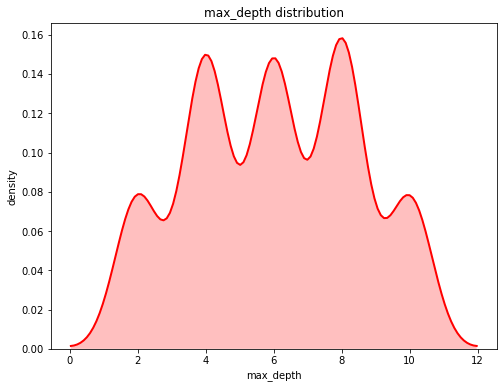

In [43]:
densityPlotSpace(space['max_depth'], 'max_depth')

### Min Child Weight

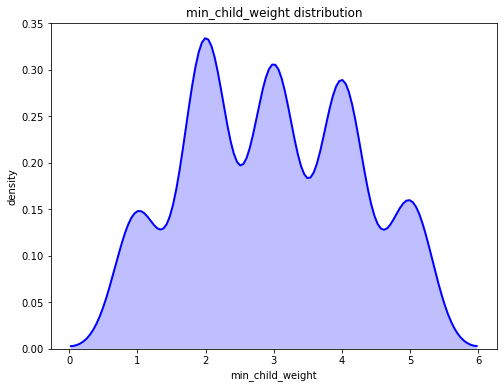

In [44]:
densityPlotSpace(space['min_child_weight'], 'min_child_weight', color='blue')

### Gamma

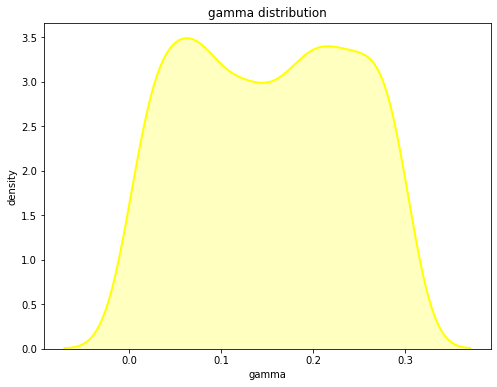

In [45]:
densityPlotSpace(space['gamma'], 'gamma', color='yellow')

### Subsample

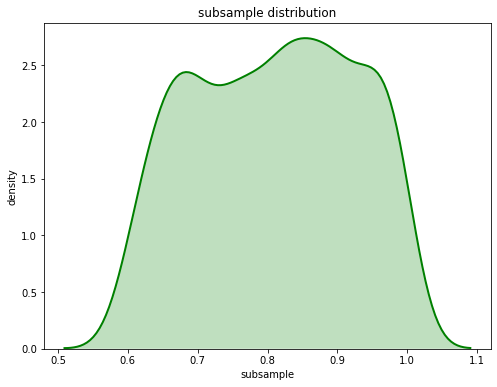

In [46]:
densityPlotSpace(space['subsample'], 'subsample', color='green')

### Colsample Bytree

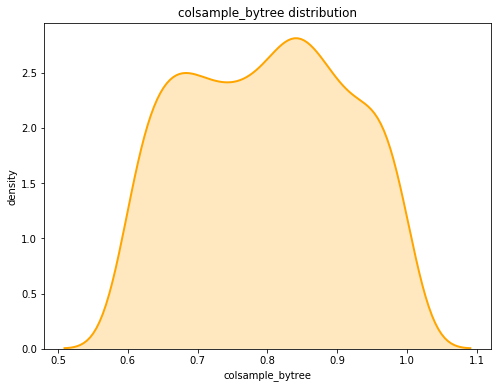

In [47]:
densityPlotSpace(space['colsample_bytree'], 'colsample_bytree', color='orange')

## Algorithm

In [48]:
algorithm = tpe.suggest

## History

In [49]:
trials = Trials()

## Objective

In [50]:
def objective(params):
    
    eval_set = [(X_val_proc, y_val)]
    
    model = xgb.XGBClassifier(n_estimators=10000,
                       max_depth=int(params['max_depth']),
                       min_child_weight=params['min_child_weight'],
                       gamma=params['gamma'],
                       colsample_bytree=params['colsample_bytree'],
                       subsample=params['subsample'],
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=1)

    model.fit(X_train_proc, y_train,
            early_stopping_rounds=5,
            eval_metric=[ 'merror', 'mlogloss'],
            eval_set=eval_set,
            verbose=True)
    
    proba  = model.predict_proba(X_val_proc, model.best_iteration)
    pred   = np.argmax(proba, axis=1)
    truth  = y_val.astype('category').cat.codes
    acc = accuracy_score(pred, truth)
    loss = log_loss(truth, proba, labels=[0,1,2])
    return {'loss': loss, 'acc': acc, 'status': STATUS_OK}

## Optimization

In [51]:
startHyper = datetime.datetime.now()
EVALS=100
best = fmin(fn=objective,
           space=space,
           algo=algorithm,
           max_evals=EVALS,
           trials=trials)
endHyper = datetime.datetime.now()

[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05947

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.

[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.02097

[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.994344

[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.96814

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.939934

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.920539

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.892173

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.870573

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.85208

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.836899

[10]	validation_0-merror:0.3	validation_0-mlogloss:0.817149

[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.801588

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.79193


[29]	validation_0-merror:0.3	validation_0-mlogloss:0.733318                   

[30]	validation_0-merror:0.3	validation_0-mlogloss:0.73074                    

[31]	validation_0-merror:0.3	validation_0-mlogloss:0.726136                   

[32]	validation_0-merror:0.3	validation_0-mlogloss:0.724442                   

[33]	validation_0-merror:0.3	validation_0-mlogloss:0.724902                   

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.721189                   

[35]	validation_0-merror:0.3	validation_0-mlogloss:0.720204                   

[36]	validation_0-merror:0.3	validation_0-mlogloss:0.724951                   

[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.727312              

[38]	validation_0-merror:0.3	validation_0-mlogloss:0.727675                   

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.727085              

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.726432              

Stopping. Best iteration:               

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.774139                  

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.770099              

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.767148              

[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.760646              

[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.75837               

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.759721              

[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.756836              

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.757523              

[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.756342              

[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.752147              

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.748656              

[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.748679              

[31]	validation_0-merror:0.333333	valida

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.747658              

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.745883              

[22]	validation_0-merror:0.35	validation_0-mlogloss:0.741675                  

[23]	validation_0-merror:0.35	validation_0-mlogloss:0.739549                  

[24]	validation_0-merror:0.35	validation_0-mlogloss:0.738341                  

[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.734945              

[26]	validation_0-merror:0.333333	validation_0-mlogloss:0.733839              

[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.730271              

[28]	validation_0-merror:0.333333	validation_0-mlogloss:0.728922              

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.725054              

[30]	validation_0-merror:0.333333	validation_0-mlogloss:0.72128               

[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.718639              

[32]	validation_0-merror:0.316667	valida

Will train until validation_0-mlogloss hasn't improved in 5 rounds.           

[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02529                

[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.991363               

[3]	validation_0-merror:0.333333	validation_0-mlogloss:0.965431               

[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.943455               

[5]	validation_0-merror:0.35	validation_0-mlogloss:0.921064                   

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.899785               

[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.880025               

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.861775                   

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.8432                 

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.831321              

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.819353              

[12]	validation_0-merror:0.333333	valida

[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05718                 

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.316667	validation_0-mlogloss:1.01745                 

[2]	validation_0-merror:0.333333	validation_0-mlogloss:0.983348                

[3]	validation_0-merror:0.283333	validation_0-mlogloss:0.95677                 

[4]	validation_0-merror:0.316667	validation_0-mlogloss:0.93295                 

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.913331                

[6]	validation_0-merror:0.3	validation_0-mlogloss:0.890034                     

[7]	validation_0-merror:0.3	validation_0-mlogloss:0.871439                     

[8]	validation_0-merror:0.3	validation_0-mlogloss:0.851256                     

[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.837993                

[10]	valid

[7]	validation_0-merror:0.316667	validation_0-mlogloss:0.864551                

[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.847196                

[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.827519                

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.813069               

[11]	validation_0-merror:0.3	validation_0-mlogloss:0.794527                    

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.783707               

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.771184               

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.761751               

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.756437               

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.750211               

[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.743821               

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.74381                

[19]	validation_0-merror:0.3

[14]	validation_0-merror:0.35	validation_0-mlogloss:0.790447                   

[15]	validation_0-merror:0.35	validation_0-mlogloss:0.786277                   

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.776443                   

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.767922                   

[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.763133               

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.756766                   

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.748422               

[21]	validation_0-merror:0.366667	validation_0-mlogloss:0.742923               

[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.739174               

[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.73393                

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.72635                

[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.719838               

[26]	validation_0-merror:0.3

[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.721319               

[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.719406               

[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.71513                

[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.71351                

[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.720708               

[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.719063               

[38]	validation_0-merror:0.333333	validation_0-mlogloss:0.721202               

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.720432               

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.716144               

Stopping. Best iteration:                                                      
[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.71351


[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06005                 

Multiple eval metrics have been passed: 'val

[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.897982                

[7]	validation_0-merror:0.366667	validation_0-mlogloss:0.876507                

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.85753                     

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.840225                

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.823894                   

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.811623               

[12]	validation_0-merror:0.333333	validation_0-mlogloss:0.803413               

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.78826                

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.783034               

[15]	validation_0-merror:0.35	validation_0-mlogloss:0.773406                   

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.764691                   

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.756626                   

[18]	validation_0-merror:0.3

[57]	validation_0-merror:0.283333	validation_0-mlogloss:0.653424               

[58]	validation_0-merror:0.283333	validation_0-mlogloss:0.653168               

[59]	validation_0-merror:0.283333	validation_0-mlogloss:0.652064               

[60]	validation_0-merror:0.283333	validation_0-mlogloss:0.651623               

Stopping. Best iteration:                                                      
[55]	validation_0-merror:0.283333	validation_0-mlogloss:0.649111


[0]	validation_0-merror:0.483333	validation_0-mlogloss:1.0629                  

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02709                 

[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.989484                

[3]	validation_0-merror:0.35	validation_0-mlogloss:0.966474                    

[4]	validation_0-merror:0

[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.691884               

[31]	validation_0-merror:0.283333	validation_0-mlogloss:0.688238               

[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.684531               

[33]	validation_0-merror:0.283333	validation_0-mlogloss:0.678748               

[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.675524               

[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.674396               

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.673848               

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.668769               

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.665246               

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.664257               

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.659926               

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.657263               

[42]	validation_0-merror:0.2

[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.649612               

[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.649909               

[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.648414               

[54]	validation_0-merror:0.266667	validation_0-mlogloss:0.648769               

[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.648806               

[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.652195               

[57]	validation_0-merror:0.266667	validation_0-mlogloss:0.65473                

[58]	validation_0-merror:0.266667	validation_0-mlogloss:0.655574               

Stopping. Best iteration:                                                      
[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.648414


[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.0628                  

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validati

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.832329                   

[12]	validation_0-merror:0.35	validation_0-mlogloss:0.823968                   

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.810206               

[14]	validation_0-merror:0.35	validation_0-mlogloss:0.797177                   

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.783426               

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.776178                   

[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.76841                

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.762475               

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.757955               

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.752564               

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.747235               

[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.737331               

[23]	validation_0-merror:0.3

[33]	validation_0-merror:0.3	validation_0-mlogloss:0.671053                    

[34]	validation_0-merror:0.283333	validation_0-mlogloss:0.669278               

[35]	validation_0-merror:0.3	validation_0-mlogloss:0.667696                    

[36]	validation_0-merror:0.3	validation_0-mlogloss:0.665738                    

[37]	validation_0-merror:0.3	validation_0-mlogloss:0.661702                    

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.65892                

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.658286               

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.65751                

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.654471               

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.653733               

[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.651837               

[44]	validation_0-merror:0.283333	validation_0-mlogloss:0.649067               

[45]	validation_0-merror:0.2

[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.921454                

[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.899529                

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.887339                    

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.869955                    

[9]	validation_0-merror:0.35	validation_0-mlogloss:0.855697                    

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.845811               

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.832895                   

[12]	validation_0-merror:0.35	validation_0-mlogloss:0.824537                   

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.81071                

[14]	validation_0-merror:0.35	validation_0-mlogloss:0.797626                   

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.783864               

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.776554                   

[17]	validation_0-merror:0.3

[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.665014               

[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.665554               

[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.660226               

[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.658913               

[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.659105               

[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.65979                

[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.660996               

[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.655386               

[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.655203               

[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.651182               

[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.650704               

[53]	validation_0-merror:0.283333	validation_0-mlogloss:0.650937               

[54]	validation_0-merror:0.2

[33]	validation_0-merror:0.3	validation_0-mlogloss:0.711869                    

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.713032                    

[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.71399                

[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.712748               

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.709856               

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.708593               

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.704046               

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.70396                

[41]	validation_0-merror:0.3	validation_0-mlogloss:0.704583                    

[42]	validation_0-merror:0.3	validation_0-mlogloss:0.704994                    

[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.707809               

[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.709857               

[45]	validation_0-merror:0.3

[19]	validation_0-merror:0.283333	validation_0-mlogloss:0.721862               

[20]	validation_0-merror:0.283333	validation_0-mlogloss:0.720841               

[21]	validation_0-merror:0.283333	validation_0-mlogloss:0.7155                 

[22]	validation_0-merror:0.266667	validation_0-mlogloss:0.709375               

[23]	validation_0-merror:0.266667	validation_0-mlogloss:0.707227               

[24]	validation_0-merror:0.266667	validation_0-mlogloss:0.699349               

[25]	validation_0-merror:0.266667	validation_0-mlogloss:0.688624               

[26]	validation_0-merror:0.266667	validation_0-mlogloss:0.687611               

[27]	validation_0-merror:0.266667	validation_0-mlogloss:0.684331               

[28]	validation_0-merror:0.266667	validation_0-mlogloss:0.68752                

[29]	validation_0-merror:0.266667	validation_0-mlogloss:0.69119                

[30]	validation_0-merror:0.266667	validation_0-mlogloss:0.685328               

[31]	validation_0-merror:0.2

[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.711662               

[30]	validation_0-merror:0.3	validation_0-mlogloss:0.706388                    

[31]	validation_0-merror:0.3	validation_0-mlogloss:0.704441                    

[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.699861               

[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.693788               

[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.690183               

[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.688876               

[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.686138               

[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.684176               

[38]	validation_0-merror:0.3	validation_0-mlogloss:0.683001                    

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.681762               

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.678066               

[41]	validation_0-merror:0.2

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.809431                   

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.799851                   

[12]	validation_0-merror:0.35	validation_0-mlogloss:0.791033                   

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.784977               

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.777365               

[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.766189               

[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.762468               

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.754256               

[18]	validation_0-merror:0.283333	validation_0-mlogloss:0.752603               

[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.750191               

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.748803               

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.748818                    

[22]	validation_0-merror:0.3

[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.960156                

[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.932052                

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.908509                

[6]	validation_0-merror:0.366667	validation_0-mlogloss:0.885199                

[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.871591                

[8]	validation_0-merror:0.35	validation_0-mlogloss:0.852705                    

[9]	validation_0-merror:0.283333	validation_0-mlogloss:0.834638                

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.823195               

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.809687               

[12]	validation_0-merror:0.3	validation_0-mlogloss:0.799983                    

[13]	validation_0-merror:0.283333	validation_0-mlogloss:0.786586               

[14]	validation_0-merror:0.3	validation_0-mlogloss:0.779438                    

[15]	validation_0-merror:0.3

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.743577               

[20]	validation_0-merror:0.3	validation_0-mlogloss:0.737738                    

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.732473                    

[22]	validation_0-merror:0.3	validation_0-mlogloss:0.725826                    

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.718742               

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.715786               

[25]	validation_0-merror:0.3	validation_0-mlogloss:0.713411                    

[26]	validation_0-merror:0.3	validation_0-mlogloss:0.708157                    

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.704056                    

[28]	validation_0-merror:0.3	validation_0-mlogloss:0.699939                    

[29]	validation_0-merror:0.3	validation_0-mlogloss:0.694963                    

[30]	validation_0-merror:0.3	validation_0-mlogloss:0.688693                    

[31]	validation_0-merror:0.2

[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.770081               

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.760568                   

[18]	validation_0-merror:0.35	validation_0-mlogloss:0.752537                   

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.753152                   

[20]	validation_0-merror:0.35	validation_0-mlogloss:0.747804                   

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.746203               

[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.737697               

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.734481               

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.72496                

[25]	validation_0-merror:0.3	validation_0-mlogloss:0.713896                    

[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.713557               

[27]	validation_0-merror:0.333333	validation_0-mlogloss:0.714398               

[28]	validation_0-merror:0.3

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.777976               

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.773772               

[16]	validation_0-merror:0.35	validation_0-mlogloss:0.767969                   

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.763148                   

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.764075               

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.764505                   

[20]	validation_0-merror:0.366667	validation_0-mlogloss:0.761379               

[21]	validation_0-merror:0.383333	validation_0-mlogloss:0.757006               

[22]	validation_0-merror:0.366667	validation_0-mlogloss:0.752956               

[23]	validation_0-merror:0.383333	validation_0-mlogloss:0.747382               

[24]	validation_0-merror:0.383333	validation_0-mlogloss:0.742011               

[25]	validation_0-merror:0.366667	validation_0-mlogloss:0.736319               

[26]	validation_0-merror:0.3

[31]	validation_0-merror:0.333333	validation_0-mlogloss:0.735075               

[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.731036               

[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.728833               

[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.727833               

[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.730422               

[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.734037               

[37]	validation_0-merror:0.333333	validation_0-mlogloss:0.730968               

[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.730241               

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.730292               

Stopping. Best iteration:                                                      
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.727833


[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.05845                 

Multiple eval metrics have been passed: 'va

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.06184                 

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.333333	validation_0-mlogloss:1.02784                 

[2]	validation_0-merror:0.3	validation_0-mlogloss:0.991989                     

[3]	validation_0-merror:0.266667	validation_0-mlogloss:0.967298                

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.944491                

[5]	validation_0-merror:0.333333	validation_0-mlogloss:0.9237                  

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.901605                

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.882896                    

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.86534                 

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.851175                

[10]	valid

[33]	validation_0-merror:0.333333	validation_0-mlogloss:0.705404               

[34]	validation_0-merror:0.333333	validation_0-mlogloss:0.70425                

[35]	validation_0-merror:0.333333	validation_0-mlogloss:0.703944               

[36]	validation_0-merror:0.333333	validation_0-mlogloss:0.705572               

[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.70467                

[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.703325               

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.703194               

[40]	validation_0-merror:0.316667	validation_0-mlogloss:0.70052                

[41]	validation_0-merror:0.316667	validation_0-mlogloss:0.700367               

[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.702704               

[43]	validation_0-merror:0.316667	validation_0-mlogloss:0.702695               

[44]	validation_0-merror:0.316667	validation_0-mlogloss:0.698077               

[45]	validation_0-merror:0.3

[14]	validation_0-merror:0.35	validation_0-mlogloss:0.778091                   

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.769124               

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.769063               

[17]	validation_0-merror:0.35	validation_0-mlogloss:0.76774                    

[18]	validation_0-merror:0.366667	validation_0-mlogloss:0.765647               

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.765217                   

[20]	validation_0-merror:0.35	validation_0-mlogloss:0.759853                   

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.757706               

[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.751253               

[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.746544               

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.749577               

[25]	validation_0-merror:0.35	validation_0-mlogloss:0.749768                   

[26]	validation_0-merror:0.3

[3]	validation_0-merror:0.383333	validation_0-mlogloss:0.970785                

[4]	validation_0-merror:0.383333	validation_0-mlogloss:0.94723                 

[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.925481                

[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.905058                

[7]	validation_0-merror:0.383333	validation_0-mlogloss:0.88691                 

[8]	validation_0-merror:0.383333	validation_0-mlogloss:0.869918                

[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.857201                

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.842925                   

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.831206                   

[12]	validation_0-merror:0.35	validation_0-mlogloss:0.827626                   

[13]	validation_0-merror:0.333333	validation_0-mlogloss:0.818887               

[14]	validation_0-merror:0.333333	validation_0-mlogloss:0.811267               

[15]	validation_0-merror:0.3

[32]	validation_0-merror:0.333333	validation_0-mlogloss:0.719348               

[33]	validation_0-merror:0.316667	validation_0-mlogloss:0.717575               

[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.716779               

[35]	validation_0-merror:0.316667	validation_0-mlogloss:0.713704               

[36]	validation_0-merror:0.316667	validation_0-mlogloss:0.716288               

[37]	validation_0-merror:0.316667	validation_0-mlogloss:0.71363                

[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.7147                 

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.717828               

[40]	validation_0-merror:0.3	validation_0-mlogloss:0.717762                    

[41]	validation_0-merror:0.3	validation_0-mlogloss:0.718106                    

[42]	validation_0-merror:0.3	validation_0-mlogloss:0.723119                    

Stopping. Best iteration:                                                      
[37]	validation_0-merror:0.31

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.859551                

[10]	validation_0-merror:0.35	validation_0-mlogloss:0.843271                   

[11]	validation_0-merror:0.35	validation_0-mlogloss:0.827822                   

[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.817788               

[13]	validation_0-merror:0.35	validation_0-mlogloss:0.807484                   

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.799013               

[15]	validation_0-merror:0.333333	validation_0-mlogloss:0.785916               

[16]	validation_0-merror:0.333333	validation_0-mlogloss:0.77906                

[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.769659               

[18]	validation_0-merror:0.3	validation_0-mlogloss:0.763433                    

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.758938               

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.752928               

[21]	validation_0-merror:0.3

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.0599                  

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.01632                 

[2]	validation_0-merror:0.35	validation_0-mlogloss:0.983077                    

[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.953939                

[4]	validation_0-merror:0.333333	validation_0-mlogloss:0.930095                

[5]	validation_0-merror:0.3	validation_0-mlogloss:0.903799                     

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.875795                    

[7]	validation_0-merror:0.35	validation_0-mlogloss:0.857833                    

[8]	validation_0-merror:0.316667	validation_0-mlogloss:0.84142                 

[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.826658                

[10]	valid

[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.654857               

Stopping. Best iteration:                                                      
[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.652467


[0]	validation_0-merror:0.416667	validation_0-mlogloss:1.06296                 

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.35	validation_0-mlogloss:1.03108                     

[2]	validation_0-merror:0.316667	validation_0-mlogloss:0.996635                

[3]	validation_0-merror:0.316667	validation_0-mlogloss:0.971845                

[4]	validation_0-merror:0.3	validation_0-mlogloss:0.950777                     

[5]	validation_0-merror:0.316667	validation_0-mlogloss:0.923737                

[6]	validation_0-merror:0.333333	validation_0-mlogloss:0.897786                

[7]	validation_0-merror:0

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.665716               

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.662849               

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.662303               

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.66135                

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.658123               

[42]	validation_0-merror:0.266667	validation_0-mlogloss:0.657213               

[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.655012               

[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.652445               

[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.648787               

[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.647175               

[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.646742               

[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.649195               

[49]	validation_0-merror:0.2

[0]	validation_0-merror:0.466667	validation_0-mlogloss:1.06297                 

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.02933                 

[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.99445                 

[3]	validation_0-merror:0.416667	validation_0-mlogloss:0.96961                 

[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.943717                

[5]	validation_0-merror:0.35	validation_0-mlogloss:0.919276                    

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.897613                    

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.883075                

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.866076                

[9]	validation_0-merror:0.333333	validation_0-mlogloss:0.852007                

[10]	valid

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.670224               

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.668839               

[39]	validation_0-merror:0.283333	validation_0-mlogloss:0.667733               

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.665251               

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.662373               

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.664271               

[43]	validation_0-merror:0.266667	validation_0-mlogloss:0.66435                

[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.659424               

[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.656502               

[46]	validation_0-merror:0.266667	validation_0-mlogloss:0.653398               

[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.656153               

[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.657774               

[49]	validation_0-merror:0.2

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.755334               

[20]	validation_0-merror:0.3	validation_0-mlogloss:0.746577                    

[21]	validation_0-merror:0.3	validation_0-mlogloss:0.740669                    

[22]	validation_0-merror:0.3	validation_0-mlogloss:0.732192                    

[23]	validation_0-merror:0.3	validation_0-mlogloss:0.726435                    

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.718982               

[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.709733               

[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.706866               

[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.703789               

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.703192               

[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.69811                

[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.691653               

[31]	validation_0-merror:0.3

[54]	validation_0-merror:0.3	validation_0-mlogloss:0.644584                    

[55]	validation_0-merror:0.3	validation_0-mlogloss:0.645057                    

[56]	validation_0-merror:0.3	validation_0-mlogloss:0.647704                    

[57]	validation_0-merror:0.3	validation_0-mlogloss:0.649568                    

[58]	validation_0-merror:0.3	validation_0-mlogloss:0.649776                    

[59]	validation_0-merror:0.3	validation_0-mlogloss:0.647919                    

Stopping. Best iteration:                                                      
[54]	validation_0-merror:0.3	validation_0-mlogloss:0.644584


[0]	validation_0-merror:0.366667	validation_0-mlogloss:1.05345                 

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.35	validation_0-mlogloss:1.01354                     

[2]	validation_0-merror:0.3666

[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.653172               

[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.654551               

[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.652754               

[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.653281               

[51]	validation_0-merror:0.266667	validation_0-mlogloss:0.653675               

Stopping. Best iteration:                                                      
[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.652394


[0]	validation_0-merror:0.4	validation_0-mlogloss:1.05843                      

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.35	validation_0-mlogloss:1.02457                     

[2]	validation_0-merror:0.35	validation_0-mlogloss:0.989655                    

[3]	validation_0-merror:0

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.66676                     

[40]	validation_0-merror:0.3	validation_0-mlogloss:0.665686                    

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.662554               

[42]	validation_0-merror:0.283333	validation_0-mlogloss:0.661762               

[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.658231               

[44]	validation_0-merror:0.266667	validation_0-mlogloss:0.654234               

[45]	validation_0-merror:0.266667	validation_0-mlogloss:0.649952               

[46]	validation_0-merror:0.283333	validation_0-mlogloss:0.648502               

[47]	validation_0-merror:0.266667	validation_0-mlogloss:0.647847               

[48]	validation_0-merror:0.266667	validation_0-mlogloss:0.649931               

[49]	validation_0-merror:0.266667	validation_0-mlogloss:0.644888               

[50]	validation_0-merror:0.266667	validation_0-mlogloss:0.645936               

[51]	validation_0-merror:0.2

[61]	validation_0-merror:0.283333	validation_0-mlogloss:0.642559               

[62]	validation_0-merror:0.283333	validation_0-mlogloss:0.641905               

[63]	validation_0-merror:0.283333	validation_0-mlogloss:0.641908               

[64]	validation_0-merror:0.283333	validation_0-mlogloss:0.639905               

[65]	validation_0-merror:0.283333	validation_0-mlogloss:0.64102                

[66]	validation_0-merror:0.283333	validation_0-mlogloss:0.638302               

[67]	validation_0-merror:0.283333	validation_0-mlogloss:0.640688               

[68]	validation_0-merror:0.283333	validation_0-mlogloss:0.642206               

[69]	validation_0-merror:0.283333	validation_0-mlogloss:0.645391               

[70]	validation_0-merror:0.3	validation_0-mlogloss:0.645641                    

[71]	validation_0-merror:0.3	validation_0-mlogloss:0.645243                    

Stopping. Best iteration:                                                      
[66]	validation_0-merror:0.28

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.683138               

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.680905                    

[40]	validation_0-merror:0.283333	validation_0-mlogloss:0.680151               

[41]	validation_0-merror:0.283333	validation_0-mlogloss:0.679376               

[42]	validation_0-merror:0.3	validation_0-mlogloss:0.678206                    

[43]	validation_0-merror:0.283333	validation_0-mlogloss:0.67863                

[44]	validation_0-merror:0.3	validation_0-mlogloss:0.674273                    

[45]	validation_0-merror:0.283333	validation_0-mlogloss:0.670731               

[46]	validation_0-merror:0.3	validation_0-mlogloss:0.670818                    

[47]	validation_0-merror:0.283333	validation_0-mlogloss:0.670696               

[48]	validation_0-merror:0.3	validation_0-mlogloss:0.673331                    

[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.667196               

[50]	validation_0-merror:0.2

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.760478               

[19]	validation_0-merror:0.333333	validation_0-mlogloss:0.755089               

[20]	validation_0-merror:0.333333	validation_0-mlogloss:0.74838                

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.741925               

[22]	validation_0-merror:0.333333	validation_0-mlogloss:0.734515               

[23]	validation_0-merror:0.333333	validation_0-mlogloss:0.727299               

[24]	validation_0-merror:0.333333	validation_0-mlogloss:0.717974               

[25]	validation_0-merror:0.333333	validation_0-mlogloss:0.706219               

[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.702834               

[27]	validation_0-merror:0.316667	validation_0-mlogloss:0.700677               

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.699243               

[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.694948               

[30]	validation_0-merror:0.3

[58]	validation_0-merror:0.3	validation_0-mlogloss:0.704367                    

[59]	validation_0-merror:0.3	validation_0-mlogloss:0.704409                    

[60]	validation_0-merror:0.3	validation_0-mlogloss:0.70375                     

[61]	validation_0-merror:0.3	validation_0-mlogloss:0.701757                    

[62]	validation_0-merror:0.283333	validation_0-mlogloss:0.701936               

[63]	validation_0-merror:0.283333	validation_0-mlogloss:0.701528               

[64]	validation_0-merror:0.283333	validation_0-mlogloss:0.701306               

[65]	validation_0-merror:0.283333	validation_0-mlogloss:0.701743               

[66]	validation_0-merror:0.283333	validation_0-mlogloss:0.700528               

[67]	validation_0-merror:0.283333	validation_0-mlogloss:0.703986               

[68]	validation_0-merror:0.283333	validation_0-mlogloss:0.704263               

[69]	validation_0-merror:0.283333	validation_0-mlogloss:0.703416               

[70]	validation_0-merror:0.2

[38]	validation_0-merror:0.316667	validation_0-mlogloss:0.725964               

[39]	validation_0-merror:0.316667	validation_0-mlogloss:0.726602               

Stopping. Best iteration:                                                      
[34]	validation_0-merror:0.316667	validation_0-mlogloss:0.723092


[0]	validation_0-merror:0.5	validation_0-mlogloss:1.06273                      

Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.


Will train until validation_0-mlogloss hasn't improved in 5 rounds.            

[1]	validation_0-merror:0.366667	validation_0-mlogloss:1.02542                 

[2]	validation_0-merror:0.35	validation_0-mlogloss:0.990267                    

[3]	validation_0-merror:0.366667	validation_0-mlogloss:0.964533                

[4]	validation_0-merror:0.4	validation_0-mlogloss:0.940307                     

[5]	validation_0-merror:0.383333	validation_0-mlogloss:0.917097                

[6]	validation_0-merror:0

[25]	validation_0-merror:0.3	validation_0-mlogloss:0.725538                    

[26]	validation_0-merror:0.3	validation_0-mlogloss:0.718457                    

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.713324                    

[28]	validation_0-merror:0.3	validation_0-mlogloss:0.710123                    

[29]	validation_0-merror:0.283333	validation_0-mlogloss:0.708342               

[30]	validation_0-merror:0.283333	validation_0-mlogloss:0.700778               

[31]	validation_0-merror:0.266667	validation_0-mlogloss:0.697358               

[32]	validation_0-merror:0.283333	validation_0-mlogloss:0.693798               

[33]	validation_0-merror:0.266667	validation_0-mlogloss:0.688152               

[34]	validation_0-merror:0.266667	validation_0-mlogloss:0.685059               

[35]	validation_0-merror:0.283333	validation_0-mlogloss:0.68379                

[36]	validation_0-merror:0.283333	validation_0-mlogloss:0.684308               

[37]	validation_0-merror:0.2

[19]	validation_0-merror:0.316667	validation_0-mlogloss:0.759301               

[20]	validation_0-merror:0.316667	validation_0-mlogloss:0.752949               

[21]	validation_0-merror:0.316667	validation_0-mlogloss:0.748165               

[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.740097               

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.73104                

[24]	validation_0-merror:0.3	validation_0-mlogloss:0.728226                    

[25]	validation_0-merror:0.3	validation_0-mlogloss:0.716024                    

[26]	validation_0-merror:0.3	validation_0-mlogloss:0.710373                    

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.708482                    

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.707519               

[29]	validation_0-merror:0.316667	validation_0-mlogloss:0.706832               

[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.698645               

[31]	validation_0-merror:0.3

[28]	validation_0-merror:0.316667	validation_0-mlogloss:0.715342               

[29]	validation_0-merror:0.333333	validation_0-mlogloss:0.718944               

[30]	validation_0-merror:0.316667	validation_0-mlogloss:0.71387                

[31]	validation_0-merror:0.316667	validation_0-mlogloss:0.709689               

[32]	validation_0-merror:0.316667	validation_0-mlogloss:0.707514               

[33]	validation_0-merror:0.3	validation_0-mlogloss:0.705236                    

[34]	validation_0-merror:0.3	validation_0-mlogloss:0.704893                    

[35]	validation_0-merror:0.3	validation_0-mlogloss:0.705366                    

[36]	validation_0-merror:0.3	validation_0-mlogloss:0.706164                    

[37]	validation_0-merror:0.283333	validation_0-mlogloss:0.705376               

[38]	validation_0-merror:0.283333	validation_0-mlogloss:0.701293               

[39]	validation_0-merror:0.3	validation_0-mlogloss:0.701553                    

[40]	validation_0-merror:0.2

[48]	validation_0-merror:0.283333	validation_0-mlogloss:0.675859               

[49]	validation_0-merror:0.283333	validation_0-mlogloss:0.675395               

[50]	validation_0-merror:0.283333	validation_0-mlogloss:0.675118               

[51]	validation_0-merror:0.283333	validation_0-mlogloss:0.669833               

[52]	validation_0-merror:0.266667	validation_0-mlogloss:0.668288               

[53]	validation_0-merror:0.266667	validation_0-mlogloss:0.668114               

[54]	validation_0-merror:0.266667	validation_0-mlogloss:0.668764               

[55]	validation_0-merror:0.266667	validation_0-mlogloss:0.669798               

[56]	validation_0-merror:0.266667	validation_0-mlogloss:0.669021               

[57]	validation_0-merror:0.266667	validation_0-mlogloss:0.669049               

[58]	validation_0-merror:0.266667	validation_0-mlogloss:0.670423               

Stopping. Best iteration:                                                      
[53]	validation_0-merror:0.26

[6]	validation_0-merror:0.35	validation_0-mlogloss:0.901371                    

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.886427                

[8]	validation_0-merror:0.3	validation_0-mlogloss:0.869339                     

[9]	validation_0-merror:0.3	validation_0-mlogloss:0.854664                     

[10]	validation_0-merror:0.316667	validation_0-mlogloss:0.841506               

[11]	validation_0-merror:0.316667	validation_0-mlogloss:0.825015               

[12]	validation_0-merror:0.3	validation_0-mlogloss:0.816122                    

[13]	validation_0-merror:0.3	validation_0-mlogloss:0.803645                    

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.792426               

[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.780023               

[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.772775               

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.765507               

[18]	validation_0-merror:0.3

[7]	validation_0-merror:0.333333	validation_0-mlogloss:0.883521                

[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.868541                

[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.85363                 

[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.840018               

[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.826809               

[12]	validation_0-merror:0.316667	validation_0-mlogloss:0.814938               

[13]	validation_0-merror:0.316667	validation_0-mlogloss:0.801155               

[14]	validation_0-merror:0.316667	validation_0-mlogloss:0.792697               

[15]	validation_0-merror:0.316667	validation_0-mlogloss:0.780469               

[16]	validation_0-merror:0.316667	validation_0-mlogloss:0.775258               

[17]	validation_0-merror:0.316667	validation_0-mlogloss:0.769076               

[18]	validation_0-merror:0.316667	validation_0-mlogloss:0.763382               

[19]	validation_0-merror:0.3

[42]	validation_0-merror:0.316667	validation_0-mlogloss:0.669198               

[43]	validation_0-merror:0.3	validation_0-mlogloss:0.667486                    

[44]	validation_0-merror:0.3	validation_0-mlogloss:0.663241                    

[45]	validation_0-merror:0.3	validation_0-mlogloss:0.659763                    

[46]	validation_0-merror:0.3	validation_0-mlogloss:0.66068                     

[47]	validation_0-merror:0.3	validation_0-mlogloss:0.66242                     

[48]	validation_0-merror:0.3	validation_0-mlogloss:0.660044                    

[49]	validation_0-merror:0.3	validation_0-mlogloss:0.657409                    

[50]	validation_0-merror:0.3	validation_0-mlogloss:0.657832                    

[51]	validation_0-merror:0.3	validation_0-mlogloss:0.652109                    

[52]	validation_0-merror:0.3	validation_0-mlogloss:0.651895                    

[53]	validation_0-merror:0.3	validation_0-mlogloss:0.65038                     

[54]	validation_0-merror:0.3

[16]	validation_0-merror:0.366667	validation_0-mlogloss:0.789641               

[17]	validation_0-merror:0.333333	validation_0-mlogloss:0.779448               

[18]	validation_0-merror:0.333333	validation_0-mlogloss:0.773442               

[19]	validation_0-merror:0.35	validation_0-mlogloss:0.763738                   

[20]	validation_0-merror:0.35	validation_0-mlogloss:0.753177                   

[21]	validation_0-merror:0.333333	validation_0-mlogloss:0.745989               

[22]	validation_0-merror:0.316667	validation_0-mlogloss:0.740189               

[23]	validation_0-merror:0.316667	validation_0-mlogloss:0.734366               

[24]	validation_0-merror:0.316667	validation_0-mlogloss:0.729479               

[25]	validation_0-merror:0.316667	validation_0-mlogloss:0.724188               

[26]	validation_0-merror:0.316667	validation_0-mlogloss:0.721629               

[27]	validation_0-merror:0.3	validation_0-mlogloss:0.717631                    

[28]	validation_0-merror:0.3

In [52]:
hyperTime = (endHyper - startHyper).seconds
print(f'Hyperopt took {hyperTime} seconds')

Hyperopt took 25 seconds


## Best

In [53]:
best

{'colsample_bytree': 0.8632009299148728,
 'gamma': 0.09139281803354446,
 'max_depth': 2.0,
 'min_child_weight': 2.0,
 'subsample': 0.6541858602650205}

## Fit

In [54]:
model = xgb.XGBClassifier(n_estimators=10000,
                       max_depth=int(best['max_depth']),
                       min_child_weight=best['min_child_weight'],
                       gamma=best['gamma'],
                       colsample_bytree=best['colsample_bytree'],
                       subsample=best['subsample'],
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=1)

model.fit(X_train_proc, y_train,
        early_stopping_rounds=5,
        eval_metric=[ 'merror', 'mlogloss'],
        eval_set=eval_set,
        verbose=True)

[0]	validation_0-merror:0.433333	validation_0-mlogloss:1.0623
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.383333	validation_0-mlogloss:1.02758
[2]	validation_0-merror:0.366667	validation_0-mlogloss:0.997696
[3]	validation_0-merror:0.35	validation_0-mlogloss:0.976374
[4]	validation_0-merror:0.366667	validation_0-mlogloss:0.954761
[5]	validation_0-merror:0.366667	validation_0-mlogloss:0.930088
[6]	validation_0-merror:0.35	validation_0-mlogloss:0.907913
[7]	validation_0-merror:0.35	validation_0-mlogloss:0.893572
[8]	validation_0-merror:0.333333	validation_0-mlogloss:0.876303
[9]	validation_0-merror:0.316667	validation_0-mlogloss:0.861628
[10]	validation_0-merror:0.333333	validation_0-mlogloss:0.847562
[11]	validation_0-merror:0.333333	validation_0-mlogloss:0.832038
[12]	validation_0-merror:0.3	validation_0-mlogloss:0.822053
[13]	validation_0-m

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bytree=0.8632009299148728, gamma=0.09139281803354446,
              learning_rate=0.1, max_delta_step=0, max_depth=2,
              min_child_weight=2.0, missing=None, n_estimators=10000, n_jobs=1,
              nthread=None, num_class=3, objective='multi:softprob',
              random_state=0, reg_alpha=0, reg_lambda=1, scale_pos_weight=1,
              seed=None, silent=True, subsample=0.6541858602650205,
              verbosity=1)

## Predict

In [55]:
proba  = model.predict_proba(X_test_proc, model.best_iteration)
pred   = np.argmax(proba, axis=1)
truth  = y_test.astype('category').cat.codes
acc    = errors(truth, pred);

Accuracy 0.7333333333333333
Confusion Matrix
[[21  0  2]
 [ 2 18  7]
 [ 4  5 16]]
Classification Report
              precision    recall  f1-score   support

           0       0.78      0.91      0.84        23
           1       0.78      0.67      0.72        27
           2       0.64      0.64      0.64        25

    accuracy                           0.73        75
   macro avg       0.73      0.74      0.73        75
weighted avg       0.73      0.73      0.73        75



## Log Results

In [56]:
resultsDF.loc['Hyperopt'] = [hyperTime, acc]
resultsDF

,Time,Accuracy
Default,0.0,0.666667
GridSearch,145.0,0.733333
RandomSearch,15.0,0.693333
Hyperopt,25.0,0.733333


## Visualize
* Not much variation in log loss given the search space

avg best error: 0.6259377947387595


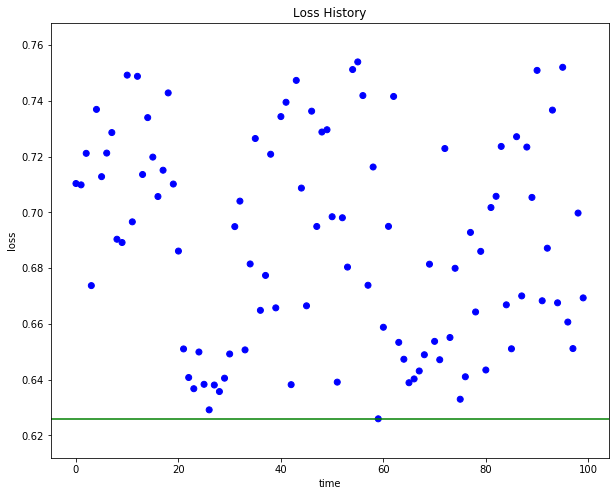

In [94]:
plt.figure(figsize=(10,8))
plotting.main_plot_history(trials)

Showing Histogram of 100 jobs


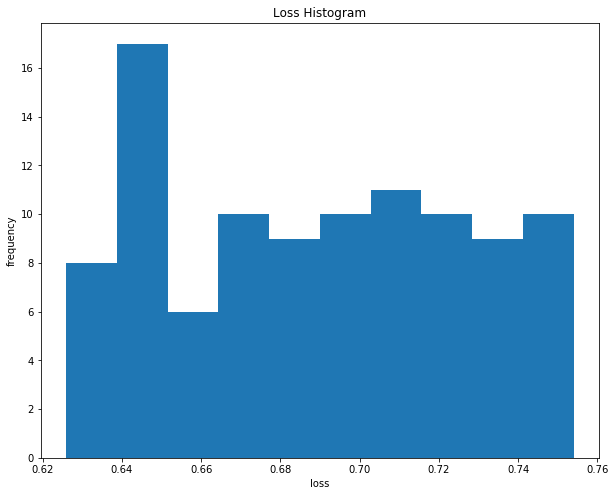

In [95]:
plt.figure(figsize=(10,8))
plotting.main_plot_histogram(trials)

finite loss range 0.6259377947387595 0.7539914088944594 -0.37406220526124045


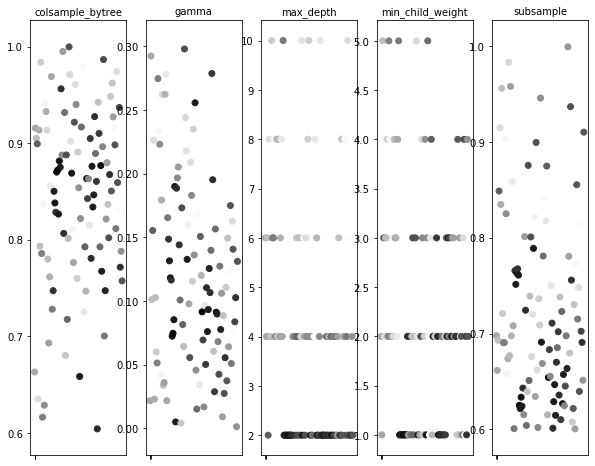

In [96]:
plt.figure(figsize=(10,8))
plotting.main_plot_vars(trials)

# Takeaways
* Grid Search - finds a good value, extremely expensive
* Consider greedy grid search
    * Tune most important variable
    * Tune next most important, Third etc
    * Changes from N x N x N to N + N + N
    * May miss interactions & combinations
* Random Search - Better in practice with respect to search and training time
* Bayesian Optimization > Random Search > Grid Search

# Bonus

In [60]:
exploreDF = df.copy()

## Create Interactions

In [61]:
# 2 Way
exploreDF['bone_flesh'] = exploreDF.bone_length * exploreDF.rotting_flesh
exploreDF['bone_hair']  = exploreDF.bone_length * exploreDF.hair_length
exploreDF['bone_soul']  = exploreDF.bone_length * exploreDF.has_soul
exploreDF['hair_flesh'] = exploreDF.hair_length * exploreDF.rotting_flesh
exploreDF['hair_soul']  = exploreDF.hair_length * exploreDF.has_soul
exploreDF['flesh_soul'] = exploreDF.hair_length * exploreDF.rotting_flesh

# 3 Way
exploreDF['bone_flesh_hair'] = exploreDF.bone_length * exploreDF.rotting_flesh * exploreDF.hair_length
exploreDF['flesh_hair_soul'] = exploreDF.rotting_flesh * exploreDF.hair_length * exploreDF.has_soul
exploreDF['hair_soul_bone']  = exploreDF.hair_length * exploreDF.has_soul * exploreDF.bone_length
exploreDF['soul_bone_flesh'] = exploreDF.has_soul * exploreDF.bone_length * exploreDF.rotting_flesh
exploreDF.head()

,id,bone_length,rotting_flesh,hair_length,has_soul,color,type,bone_flesh,bone_hair,bone_soul,hair_flesh,hair_soul,flesh_soul,bone_flesh_hair,flesh_hair_soul,hair_soul_bone,soul_bone_flesh
0,0,0.354512,0.350839,0.465761,0.781142,clear,Ghoul,0.124377,0.165118,0.276924,0.163407,0.363825,0.163407,0.057930,0.127644,0.128980,0.097156
1,1,0.575560,0.425868,0.531401,0.439899,green,Goblin,0.245113,0.305853,0.253188,0.226307,0.233763,0.226307,0.130253,0.099552,0.134545,0.107825
2,2,0.467875,0.354330,0.811616,0.791225,black,Ghoul,0.165783,0.379735,0.370195,0.287580,0.642171,0.287580,0.134552,0.227541,0.300456,0.131171
3,4,0.776652,0.508723,0.636766,0.884464,black,Ghoul,0.395101,0.494546,0.686921,0.323937,0.563196,0.323937,0.251586,0.286511,0.437408,0.349452
4,5,0.566117,0.875862,0.418594,0.636438,green,Ghost,0.495840,0.236973,0.360298,0.366630,0.266409,0.366630,0.207555,0.233337,0.150818,0.315571


## Pipeline

In [62]:
lb_featuresN = ['bone_length', 
               'rotting_flesh',
               'hair_length',
               'has_soul',
               'bone_flesh',
               'bone_hair',
               'bone_soul',
               'hair_flesh',
               'hair_soul',
               'flesh_soul',
               'bone_flesh_hair',
               'flesh_hair_soul',
               'hair_soul_bone',
               'soul_bone_flesh']
lb_transformerN = Pipeline(steps=[('scaler', StandardScaler())], verbose=True)

lb_featuresC = ['color']
lb_transformerC = Pipeline(steps=[('ohe', OneHotEncoder())], verbose=True)

lb_preprocessor = ColumnTransformer(transformers=[
    ('numerical', lb_transformerN, lb_featuresN),
    ('categorical', lb_transformerC, lb_featuresC)
])

In [63]:
y_lb = exploreDF.type
X_lb = exploreDF.drop(columns=['type', 'id'])

In [64]:
X_lb_train, X_lb_test, y_lb_train, y_lb_test = train_test_split(X_lb, y_lb, test_size=0.2, random_state=46)
X_lb_train, X_lb_val, y_lb_train, y_lb_val = train_test_split(X_lb_train, y_lb_train, test_size=0.2, random_state=46)

In [65]:
lb_pipe = Pipeline(steps=[('pre', lb_preprocessor)])
X_lb_train_proc = lb_pipe.fit_transform(X_lb_train, y_lb_train)
X_lb_val_proc   = lb_pipe.fit_transform(X_lb_val, y_lb_val)
X_lb_test_proc  = lb_pipe.fit_transform(X_lb_test, y_lb_test)

[Pipeline] ............ (step 1 of 1) Processing scaler, total=   0.0s
[Pipeline] ............... (step 1 of 1) Processing ohe, total=   0.0s
[Pipeline] ............ (step 1 of 1) Processing scaler, total=   0.0s
[Pipeline] ............... (step 1 of 1) Processing ohe, total=   0.0s
[Pipeline] ............ (step 1 of 1) Processing scaler, total=   0.0s
[Pipeline] ............... (step 1 of 1) Processing ohe, total=   0.0s


## Models

### Boosted Model

In [116]:
bst_lb = xgb.XGBClassifier(n_estimators=50,
                       max_depth=2,
                       min_child_weight=2,
                       subsample=.95,
                       colsample_bytree=.8,
                       gamma=0.05,
                       objective='mlogloss',
                       num_class=3,
                       learning_rate=0.1,
                       verbosity=1)

In [117]:
lb_eval_set = [(X_lb_val_proc, y_lb_val)]
bst_lb.fit(X_lb_train_proc, y_lb_train,
        early_stopping_rounds=5,
        eval_metric=[ 'merror', 'mlogloss'],
        eval_set=lb_eval_set,
        verbose=True)

[0]	validation_0-merror:0.383333	validation_0-mlogloss:1.05467
Multiple eval metrics have been passed: 'validation_0-mlogloss' will be used for early stopping.

Will train until validation_0-mlogloss hasn't improved in 5 rounds.
[1]	validation_0-merror:0.416667	validation_0-mlogloss:1.01837
[2]	validation_0-merror:0.383333	validation_0-mlogloss:0.979855
[3]	validation_0-merror:0.4	validation_0-mlogloss:0.945277
[4]	validation_0-merror:0.4	validation_0-mlogloss:0.917638
[5]	validation_0-merror:0.4	validation_0-mlogloss:0.895643
[6]	validation_0-merror:0.383333	validation_0-mlogloss:0.870751
[7]	validation_0-merror:0.4	validation_0-mlogloss:0.852929
[8]	validation_0-merror:0.366667	validation_0-mlogloss:0.834907
[9]	validation_0-merror:0.366667	validation_0-mlogloss:0.816185
[10]	validation_0-merror:0.366667	validation_0-mlogloss:0.801999
[11]	validation_0-merror:0.366667	validation_0-mlogloss:0.786399
[12]	validation_0-merror:0.366667	validation_0-mlogloss:0.77528
[13]	validation_0-merr

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bytree=0.8, gamma=0.05, learning_rate=0.1,
              max_delta_step=0, max_depth=2, min_child_weight=2, missing=None,
              n_estimators=50, n_jobs=1, nthread=None, num_class=3,
              objective='multi:softprob', random_state=0, reg_alpha=0,
              reg_lambda=1, scale_pos_weight=1, seed=None, silent=True,
              subsample=0.95, verbosity=1)

### Logistic Regression Model

In [118]:
lr = LogisticRegression(penalty='l2', C=1)
lr.fit(X_lb_train_proc, y_lb_train.astype('category').cat.codes)

/Users/wilsons/anaconda3/envs/pyjup/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/wilsons/anaconda3/envs/pyjup/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


LogisticRegression(C=1, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='warn', n_jobs=None, penalty='l2',
                   random_state=None, solver='warn', tol=0.0001, verbose=0,
                   warm_start=False)

### Random Forest

In [119]:
rf = RandomForestClassifier(n_estimators=100,
                           min_samples_leaf=6)
rf.fit(X_lb_train_proc, y_lb_train.astype('category').cat.codes)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=6, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [120]:
rf.feature_importances_

array([2.42050595e-02, 5.32070503e-02, 9.01799166e-02, 6.84810604e-02,
       3.16055116e-02, 1.06806079e-01, 8.30925123e-02, 2.93121850e-02,
       1.64083204e-01, 3.29900525e-02, 4.71243275e-02, 5.54248839e-02,
       1.68815573e-01, 3.80319009e-02, 1.08664775e-05, 0.00000000e+00,
       1.71498216e-04, 2.53337505e-03, 0.00000000e+00, 3.92494373e-03])

In [121]:
exploreDF.shape

(371, 17)

## Predict

In [122]:
truth = y_lb_test.astype('category').cat.codes

### Boosted

In [123]:
xgb_proba = bst_lb.predict_proba(X_lb_test_proc, bst_lb.best_iteration)
xgb_pred  = np.argmax(xgb_proba, axis=1)
acc   = errors(truth, xgb_pred);

Accuracy 0.7066666666666667
Confusion Matrix
[[20  0  3]
 [ 2 19  8]
 [ 5  4 14]]
Classification Report
              precision    recall  f1-score   support

           0       0.74      0.87      0.80        23
           1       0.83      0.66      0.73        29
           2       0.56      0.61      0.58        23

    accuracy                           0.71        75
   macro avg       0.71      0.71      0.70        75
weighted avg       0.72      0.71      0.71        75



### Logistic

In [124]:
lr_pred = lr.predict(X_lb_test_proc)
acc = errors(truth, lr_pred)

Accuracy 0.7466666666666667
Confusion Matrix
[[23  0  2]
 [ 3 19  9]
 [ 1  4 14]]
Classification Report
              precision    recall  f1-score   support

           0       0.85      0.92      0.88        25
           1       0.83      0.61      0.70        31
           2       0.56      0.74      0.64        19

    accuracy                           0.75        75
   macro avg       0.75      0.76      0.74        75
weighted avg       0.77      0.75      0.75        75



### Random Forest

In [125]:
rf_pred = rf.predict(X_lb_test_proc)
acc = errors(truth, rf_pred)

Accuracy 0.7333333333333333
Confusion Matrix
[[21  0  2]
 [ 1 19  8]
 [ 5  4 15]]
Classification Report
              precision    recall  f1-score   support

           0       0.78      0.91      0.84        23
           1       0.83      0.68      0.75        28
           2       0.60      0.62      0.61        24

    accuracy                           0.73        75
   macro avg       0.73      0.74      0.73        75
weighted avg       0.74      0.73      0.73        75



## Ensemble
* Ensemble and bote the mode
* This is a "hard" vote where we look at the class
* A "soft" vote takes the probabilities into consideration (add up and pick max)

In [126]:
from scipy.stats import mode
votesDF = pd.DataFrame(columns=['XGB', 'Logistic', 'RF', 'Pred', 'Truth'])
votesDF['XGB'] = pred
votesDF['XGB'] = votesDF.XGB.astype('category').cat.codes
votesDF['Logistic'] = lr_pred
votesDF['RF'] = rf_pred
votesDF['Pred'] = mode(votesDF[['XGB', 'Logistic', 'RF']], axis=1)[0]
votesDF['Truth'] = truth.reset_index(drop=True)
votesDF.head()

,XGB,Logistic,RF,Pred,Truth
0,1,1,1,1,1
1,1,1,1,1,0
2,0,0,0,0,0
3,2,2,2,2,2
4,1,1,1,1,1


In [127]:
ensembleAcc = (votesDF.Pred == votesDF.Truth).sum() / votesDF.shape[0]
print(f'Ensemble Accuracy {ensembleAcc}')

Ensemble Accuracy 0.7466666666666667


## Voting Classifier
* Example using soft voting

In [128]:
v = VotingClassifier(estimators=[
    ('xgb', bst_lb),
    ('lr',  lr),
    ('rf',  rf)
], voting='soft', weights=[1,1,1])

In [129]:
v.fit(X_lb_train_proc, y_lb_train)

/Users/wilsons/anaconda3/envs/pyjup/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:432: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/Users/wilsons/anaconda3/envs/pyjup/lib/python3.6/site-packages/sklearn/linear_model/logistic.py:469: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


VotingClassifier(estimators=[('xgb',
                              XGBClassifier(base_score=0.5, booster='gbtree',
                                            colsample_bylevel=1,
                                            colsample_bytree=0.8, gamma=0.05,
                                            learning_rate=0.1, max_delta_step=0,
                                            max_depth=2, min_child_weight=2,
                                            missing=None, n_estimators=50,
                                            n_jobs=1, nthread=None, num_class=3,
                                            objective='multi:softprob',
                                            random_state=0, reg_alpha=0,
                                            reg_lambda=1, scale_pos_weight=1,
                                            s...
                                                     class_weight=None,
                                                     criterion='gini',
             

In [130]:
pred = v.predict(X_lb_test_proc)
errors(pred, y_lb_test);

Accuracy 0.76
Confusion Matrix
[[21  3  3]
 [ 0 20  3]
 [ 1  8 16]]
Classification Report
              precision    recall  f1-score   support

       Ghost       0.95      0.78      0.86        27
       Ghoul       0.65      0.87      0.74        23
      Goblin       0.73      0.64      0.68        25

    accuracy                           0.76        75
   macro avg       0.78      0.76      0.76        75
weighted avg       0.78      0.76      0.76        75



0.76

# Final
* Really standard approach to this dataset
    * Clean up data
    * Missing & Standardizing
    * Split train, val, test
    * Train baseline model
    * Hypertune (Hyperopt)
* Bonus work
    * Add more EDA
    * Feature engineer interactions
    * Simple ensemble (soft / hard votes)
    * .76 vs leaderboard 
* More things to try?
    * Hypertune ensemble models
    * Add more models to ensemble
    * Add color - interations
    * Polynomial features